In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genextreme

In [ ]:
min_lat=8
max_lat=39
min_lon=68
max_lon=99
regions=[]
i=min_lat
while(i<=max_lat):
    j=min_lon
    while(j<=max_lon):
        regions.append(((i,i+2),(j,j+2)))
        j=j+2
    i=i+2

In [ ]:
df=pd.read_csv('Data.csv')

In [ ]:
df

,LONGITUDE,LATITUDE,RAINFALL,Date,Year,Month
0,68.00,23.75,3.473554,1997-06-01,1997,6
1,68.00,23.75,1.803211,1997-06-02,1997,6
2,68.00,23.75,20.312241,1997-06-03,1997,6
3,68.00,23.75,0.000000,1997-06-04,1997,6
4,68.00,23.75,0.000000,1997-06-05,1997,6
...,...,...,...,...,...,...
15739459,97.25,28.25,0.000000,2022-09-26,2022,9
15739460,97.25,28.25,0.000000,2022-09-27,2022,9
15739461,97.25,28.25,0.000000,2022-09-28,2022,9
15739462,97.25,28.25,0.000000,2022-09-29,2022,9


In [ ]:
def gev_analysis(df,region,year_min=1997,year_max=2022):
    (lat_min,lat_max),(lon_min,lon_max)=region
    data=df[(df['LATITUDE']>=lat_min) & (df['LATITUDE']<=lat_max) & (df['LONGITUDE']>=lon_min) &
            (df['LONGITUDE']<=lon_max) & (df['Year']>=year_min) & (df['Year']<=year_max)]
    rainfall_data=data['RAINFALL']
    if(len(rainfall_data)==0):
        return
    print(len(rainfall_data))
    upper_threshold = np.percentile(rainfall_data, 95)  # Example: 95th percentile
    lower_threshold = np.percentile(rainfall_data, 5)
    plt.hist(rainfall_data, bins=30, alpha=0.5, color='blue', label='Rainfall Data')
    plt.axvline(upper_threshold, color='red', linestyle='dashed', linewidth=2, label='Upper Threshold')
    plt.axvline(lower_threshold, color='green', linestyle='dashed', linewidth=2, label='Lower Threshold')
    plt.legend()
    plt.title('Histogram with Estimated Threshold')
    plt.xlabel('Rainfall Value')
    plt.ylabel('Frequency')
    plt.show()
    print(f"Estimated Upper Threshold: {upper_threshold:.2f}")
    print(f"Estimated Lower Threshold: {lower_threshold:.2f}")
    upper_extremes=rainfall_data[rainfall_data>=upper_threshold]
    lower_extremes=rainfall_data[rainfall_data<=lower_threshold]
    gev_upper=genextreme.fit(upper_extremes)
    surrounding=((lat_min-2,lat_max+2),(lon_min-2,lon_max+2))
    (test_lat_min,test_lat_max),(test_lon_min,test_lon_max)=surrounding
    test_data=df[(df['LATITUDE']>=test_lat_min) & (df['LATITUDE']<=test_lat_max) & (df['LONGITUDE']>=test_lon_min) &
            (df['LONGITUDE']<=test_lon_max) & (df['Year']>=year_min) & (df['Year']<=year_max) &
                 ((df['LATITUDE']<lat_min) | (df['LATITUDE']>lat_max)) & ((df['LONGITUDE']>lon_max) | (df['LONGITUDE']<lon_min))]
    test_rainfall_data=test_data['RAINFALL']
    test_upper_threshold = np.percentile(test_rainfall_data, 95)  # Example: 95th percentile
    test_lower_threshold = np.percentile(test_rainfall_data, 5)
    test_upper_extremes=test_rainfall_data[test_rainfall_data>=upper_threshold]
    return_period = 100
    shape, loc, scale=gev_upper
    years=[]
    expected_number=[]
    actual_number=[]
    for y in range(year_min,year_max+1):
        years.append(y)
        x=test_data[test_data['Year']==y]
        x=x['RAINFALL']
        period_of_interest = len(x)
        return_value = genextreme.ppf(1 - 1 / return_period, shape, loc=loc, scale=scale)
        intensity=1/scale
        expected_number_of_events = (period_of_interest / return_period) * intensity
        expected_number.append(expected_number_of_events)
        y=x[x>=return_value]
        num=len(y)
        actual_number.append(num)
    plt.scatter(years, expected_number, label='Expected', color='blue')
    plt.scatter(years, actual_number, label='Actual', color='red')
    plt.xlabel('Years')
    plt.ylabel('No. of extreme events')
    plt.title('Expected vs Actual no of extreme events in surrounding region')
    plt.legend()
    plt.show()
    theoretical_quantiles = genextreme.ppf(np.linspace(0.001, 0.999, 100), *gev_upper)
    observed_quantiles = np.percentile(test_upper_extremes, np.linspace(0.1, 99.9, 100))
    plt.scatter(theoretical_quantiles, observed_quantiles)
    plt.plot([np.min(theoretical_quantiles), np.max(theoretical_quantiles)], [np.min(theoretical_quantiles), np.max(theoretical_quantiles)], color='red', linestyle='dashed')
    plt.title('QQ Plot for Rainfall Upper Extreme Values (GEV Distribution)')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Observed Quantiles')
    plt.show()
    return_periods = np.array([2, 5, 10, 25, 50, 100])
    shape,loc,scale=gev_upper
    return_values = genextreme.ppf(1 - 1 / return_periods, shape, loc=loc, scale=scale)
    plt.figure(figsize=(10, 6))
    plt.plot(return_periods, return_values, marker='o', linestyle='-', color='b')
    plt.xscale('log')  # Logarithmic scale for return periods
    plt.xlabel('Return Period (days)')
    plt.ylabel('Return Value')
    plt.title('Return Value vs. Return Period (Upper GEV Distribution)')
    plt.grid(True)
    plt.show()
    gev_lower=genextreme.fit(lower_extremes)
    test_lower_extremes=test_rainfall_data[test_rainfall_data<=test_lower_threshold]
    return_period = 100
    shape, loc, scale=gev_lower
    years=[]
    expected_number=[]
    actual_number=[]
    for y in range(year_min,year_max+1):
        years.append(y)
        x=test_data[test_data['Year']==y]
        x=x['RAINFALL']
        period_of_interest = len(x)
        return_value = genextreme.ppf(1 - 1 / return_period, shape, loc=loc, scale=scale)
        intensity=1/scale
        expected_number_of_events = (period_of_interest / return_period) * intensity
        expected_number.append(expected_number_of_events)
        y=x[x<=return_value]
        num=len(y)
        actual_number.append(num)
    plt.scatter(years, expected_number, label='Expected', color='blue')
    plt.scatter(years, actual_number, label='Actual', color='red')
    plt.xlabel('Years')
    plt.ylabel('No. of extreme events')
    plt.title('Expected vs Actual no of extreme events in surrounding region')
    plt.legend()
    plt.show()
    theoretical_quantiles = genextreme.ppf(np.linspace(0.001, 0.999, 100), *gev_lower)
    observed_quantiles = np.percentile(test_lower_extremes, np.linspace(0.1, 99.9, 100))
    plt.scatter(theoretical_quantiles, observed_quantiles)
    plt.plot([np.min(theoretical_quantiles), np.max(theoretical_quantiles)], [np.min(theoretical_quantiles), np.max(theoretical_quantiles)], color='red', linestyle='dashed')
    plt.title('QQ Plot for Rainfall Lower Extreme Values (GEV Distribution)')
    plt.xlabel('Theoretical Quantiles')
    plt.ylabel('Observed Quantiles')
    plt.show()
    return_periods = np.array([2, 5, 10, 25, 50, 100])
    shape,loc,scale=gev_lower
    return_values = genextreme.ppf(1 - 1 / return_periods, shape, loc=loc, scale=scale)
    plt.figure(figsize=(10, 6))
    plt.plot(return_periods, return_values, marker='o', linestyle='-', color='b')
    plt.xscale('log')  # Logarithmic scale for return periods
    plt.xlabel('Return Period (days)')
    plt.ylabel('Return Value')
    plt.title('Return Value vs. Return Period (Lower GEV Distribution)')
    plt.grid(True)
    plt.show()

((8, 10), (68, 70))
((8, 10), (70, 72))
((8, 10), (72, 74))
((8, 10), (74, 76))
3172


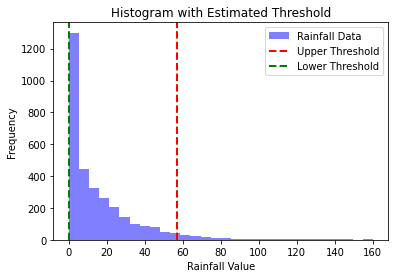

Estimated Upper Threshold: 56.78
Estimated Lower Threshold: 0.00


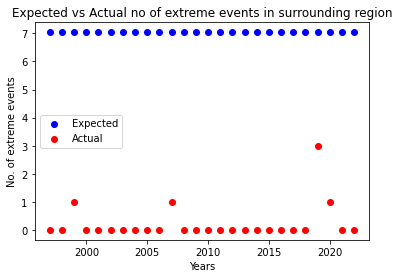

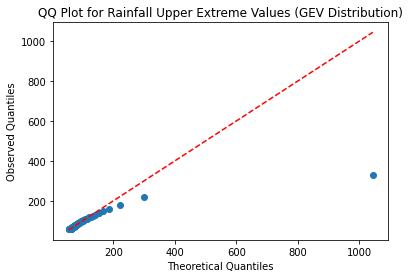

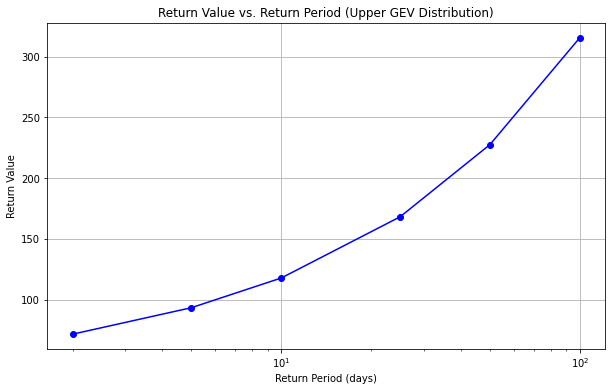

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


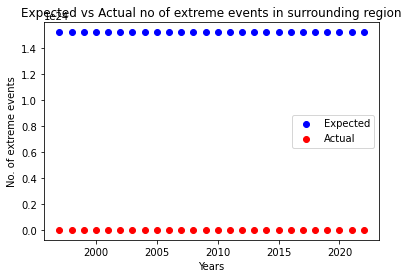

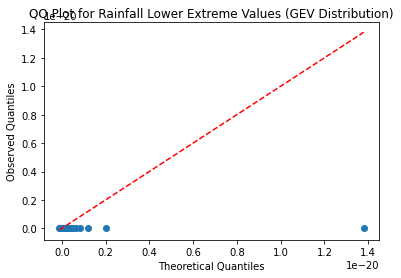

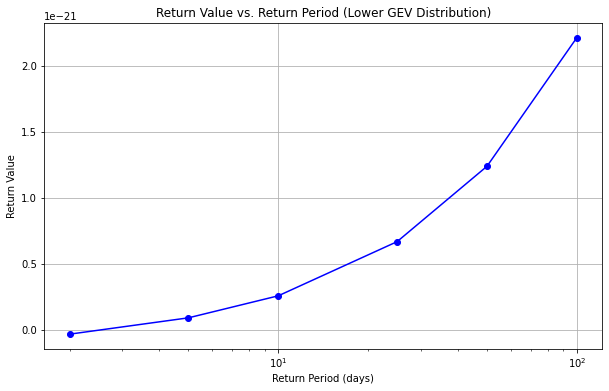

((8, 10), (76, 78))
180804


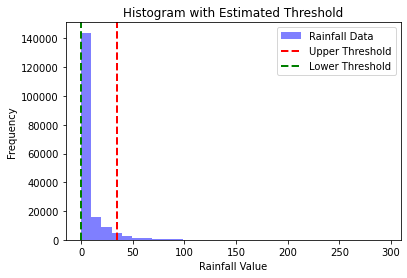

Estimated Upper Threshold: 34.98
Estimated Lower Threshold: 0.00


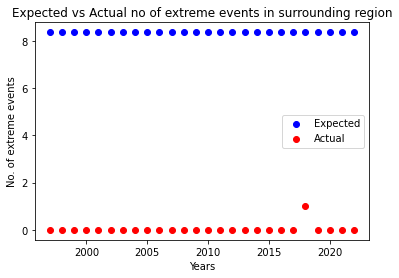

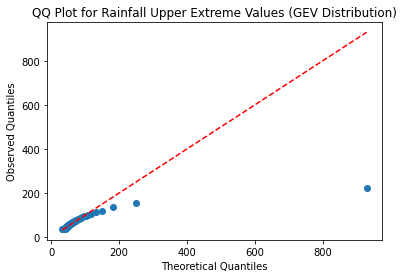

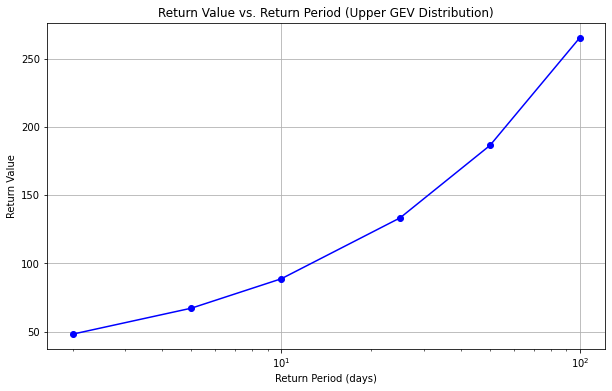

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


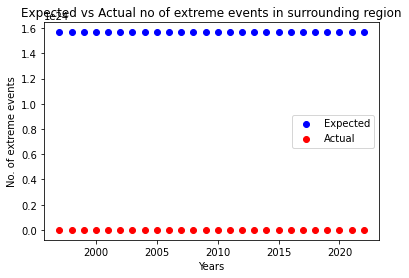

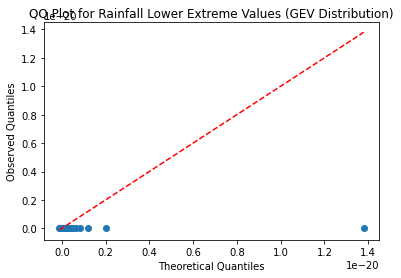

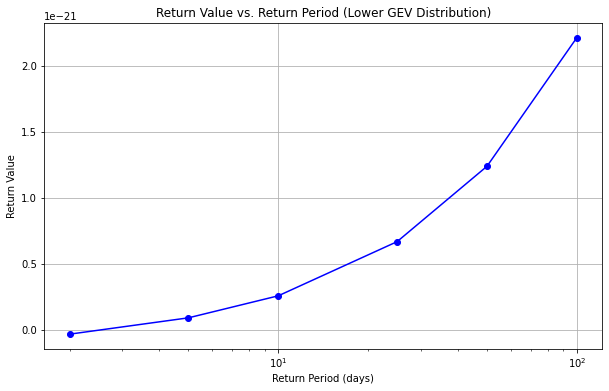

((8, 10), (78, 80))
72956


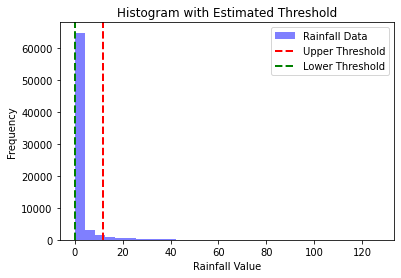

Estimated Upper Threshold: 11.89
Estimated Lower Threshold: 0.00


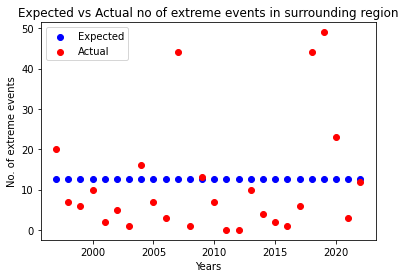

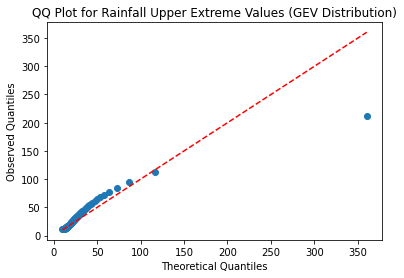

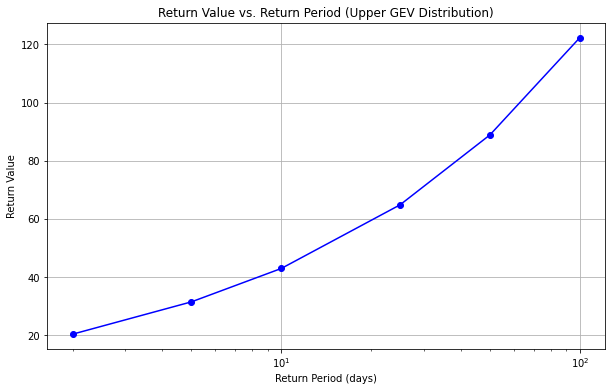

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


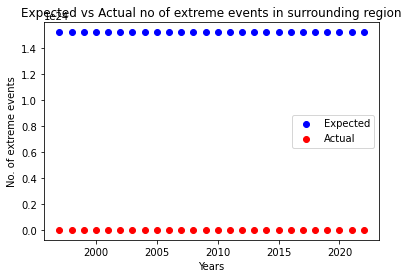

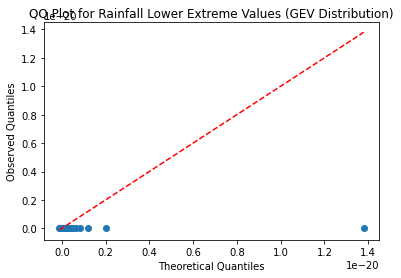

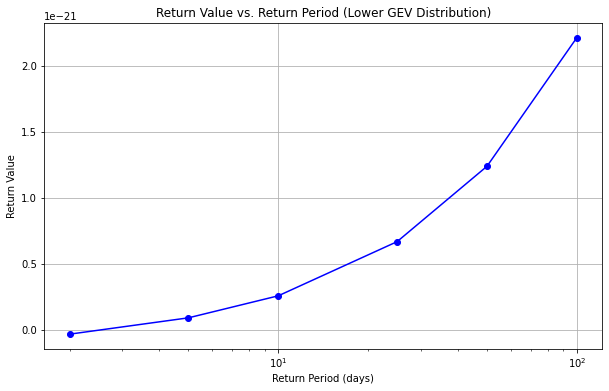

((8, 10), (80, 82))
((8, 10), (82, 84))
((8, 10), (84, 86))
((8, 10), (86, 88))
((8, 10), (88, 90))
((8, 10), (90, 92))
((8, 10), (92, 94))
((8, 10), (94, 96))
((8, 10), (96, 98))
((8, 10), (98, 100))
((10, 12), (68, 70))
((10, 12), (70, 72))
((10, 12), (72, 74))
((10, 12), (74, 76))
66612


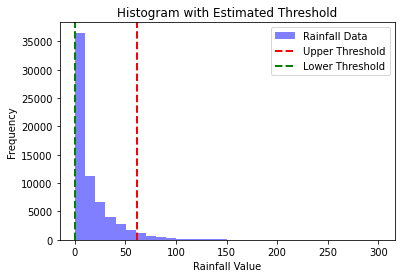

Estimated Upper Threshold: 61.84
Estimated Lower Threshold: 0.00


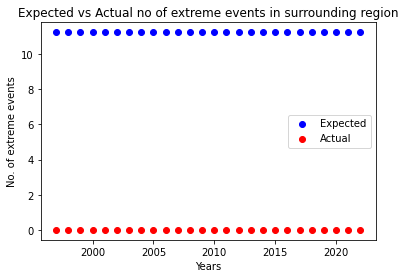

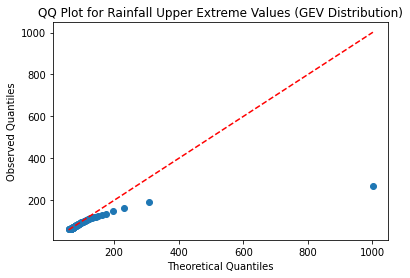

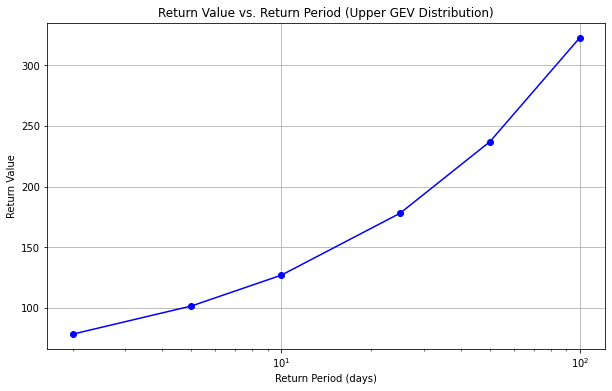

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


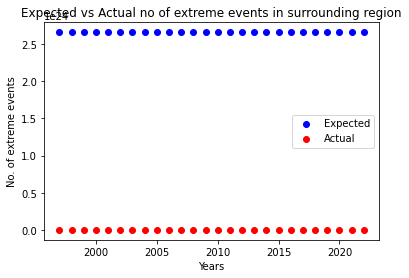

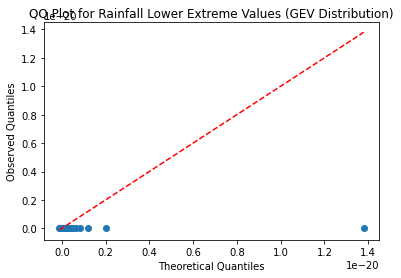

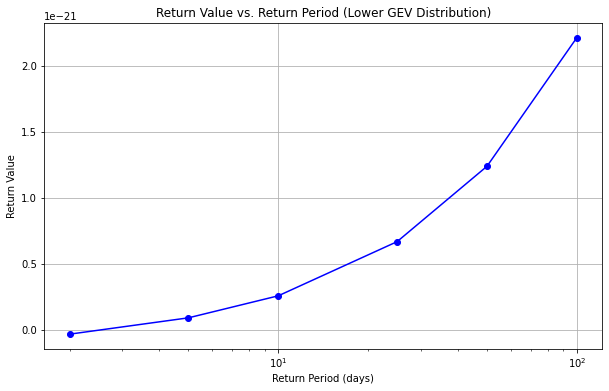

((10, 12), (76, 78))
256932


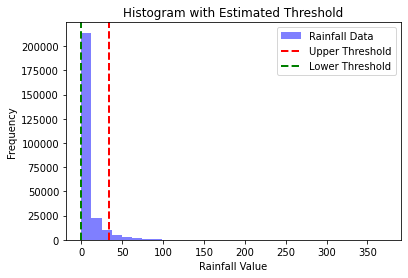

Estimated Upper Threshold: 34.37
Estimated Lower Threshold: 0.00


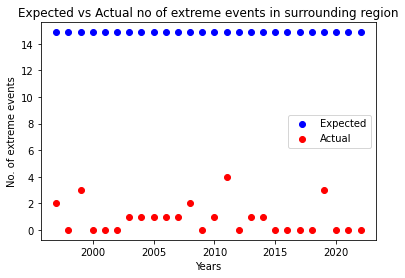

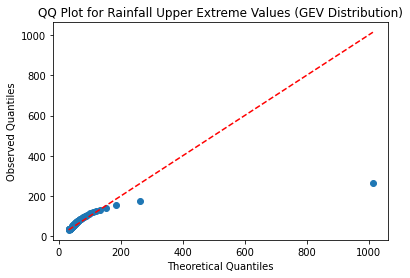

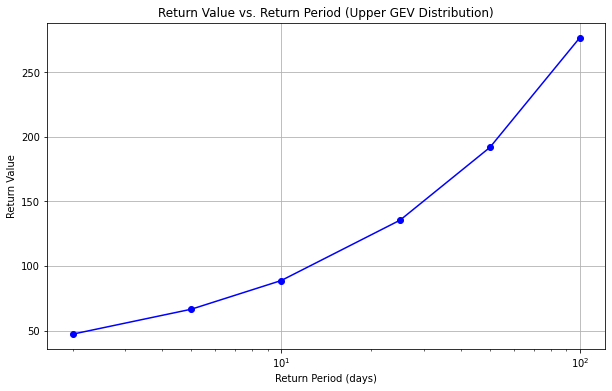

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


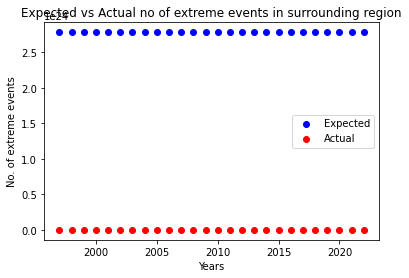

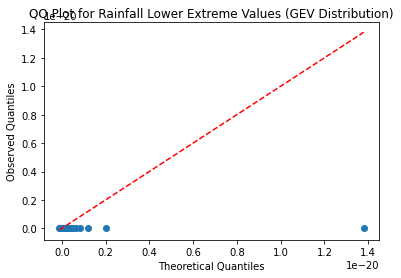

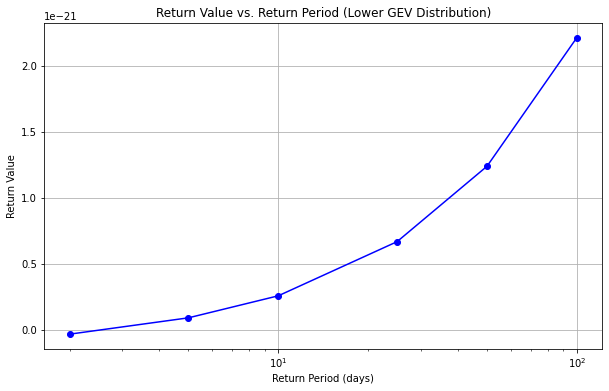

((10, 12), (78, 80))
212524


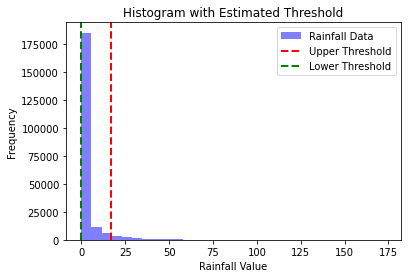

Estimated Upper Threshold: 17.03
Estimated Lower Threshold: 0.00


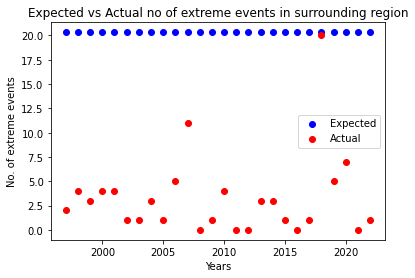

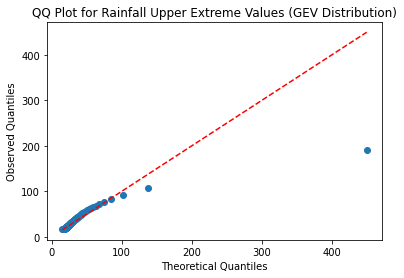

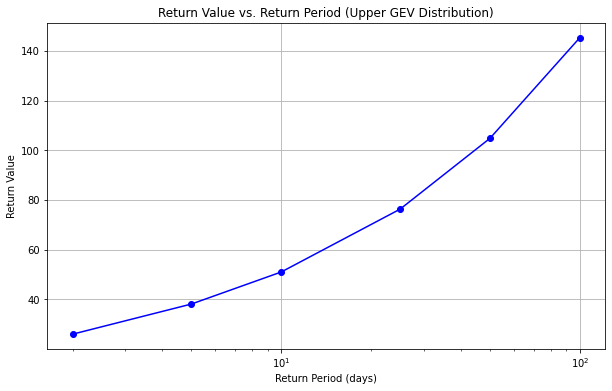

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


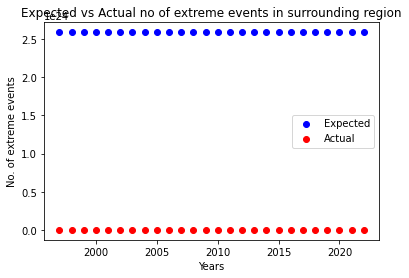

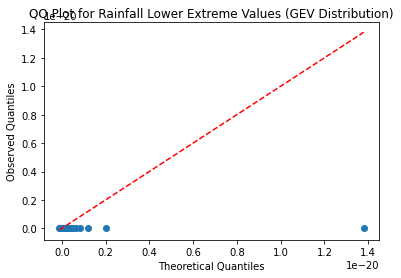

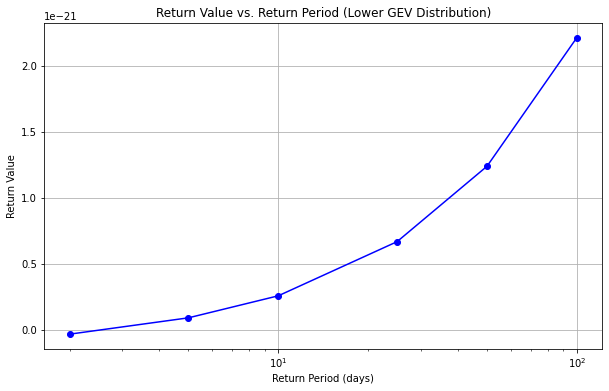

((10, 12), (80, 82))
((10, 12), (82, 84))
((10, 12), (84, 86))
((10, 12), (86, 88))
((10, 12), (88, 90))
((10, 12), (90, 92))
((10, 12), (92, 94))
((10, 12), (94, 96))
((10, 12), (96, 98))
((10, 12), (98, 100))
((12, 14), (68, 70))
((12, 14), (70, 72))
((12, 14), (72, 74))
((12, 14), (74, 76))
174460


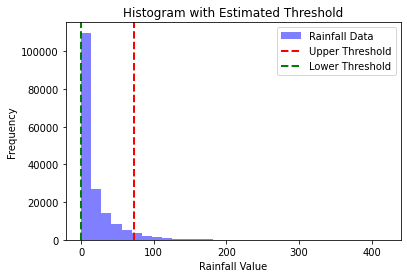

Estimated Upper Threshold: 73.19
Estimated Lower Threshold: 0.00


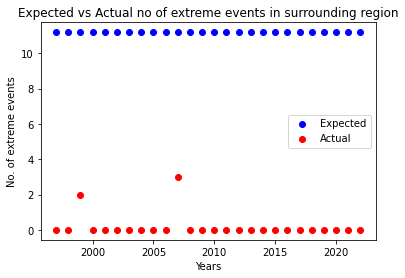

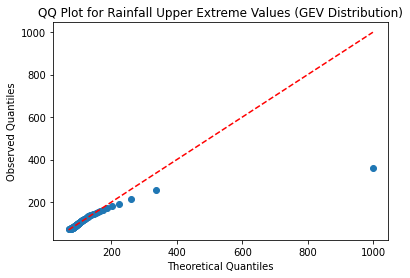

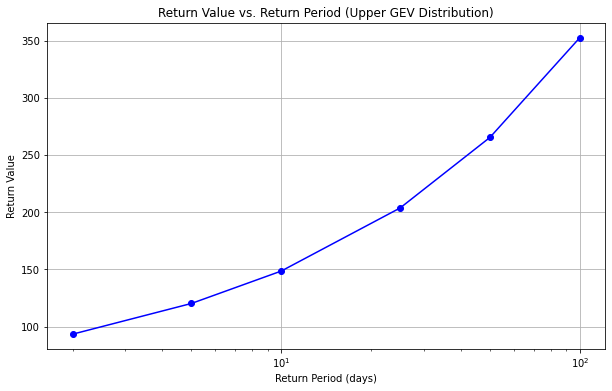

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


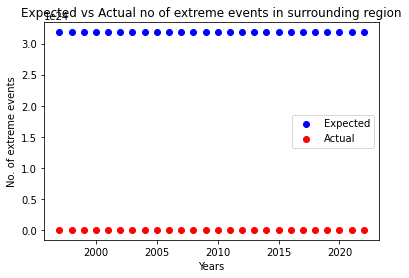

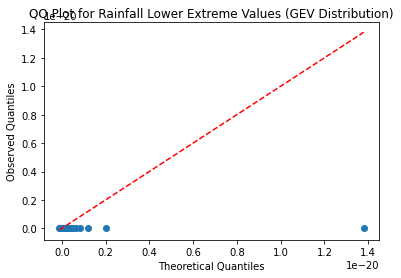

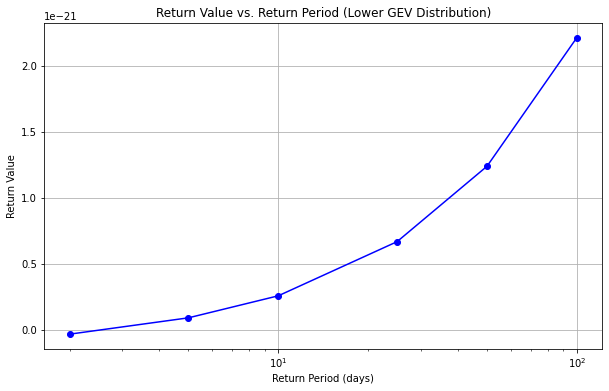

((12, 14), (76, 78))
256932


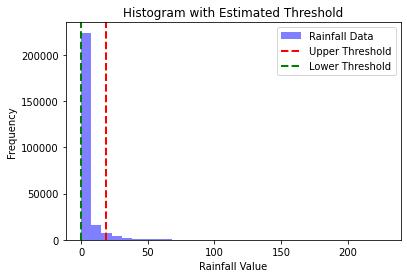

Estimated Upper Threshold: 18.84
Estimated Lower Threshold: 0.00


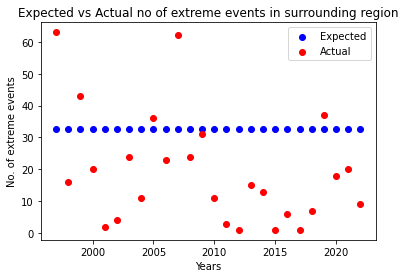

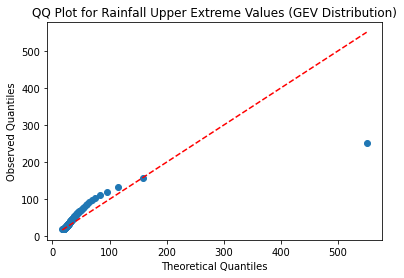

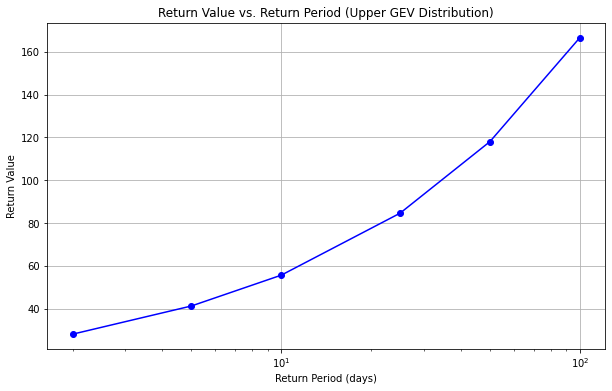

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


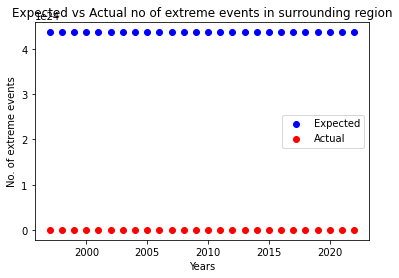

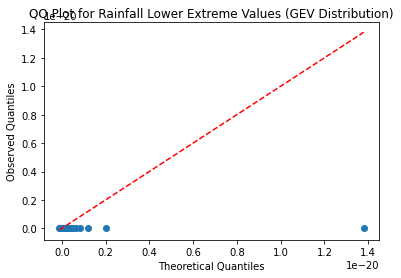

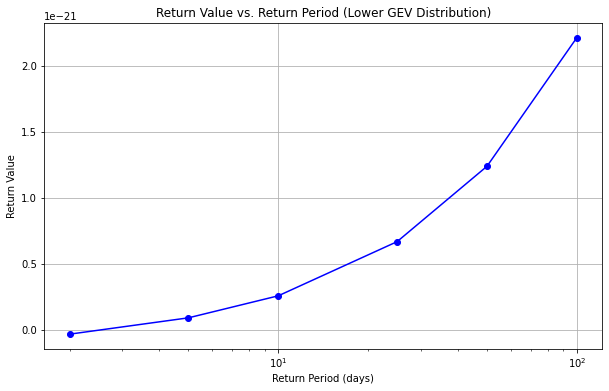

((12, 14), (78, 80))
250588


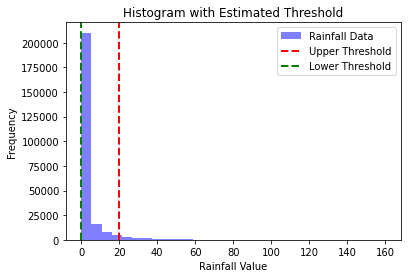

Estimated Upper Threshold: 19.90
Estimated Lower Threshold: 0.00


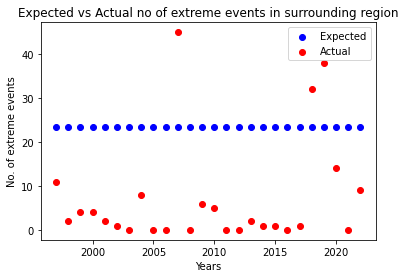

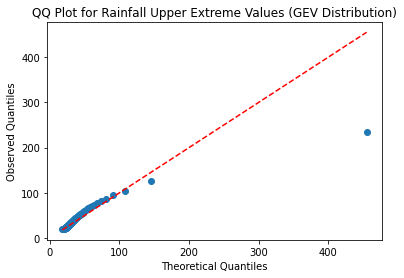

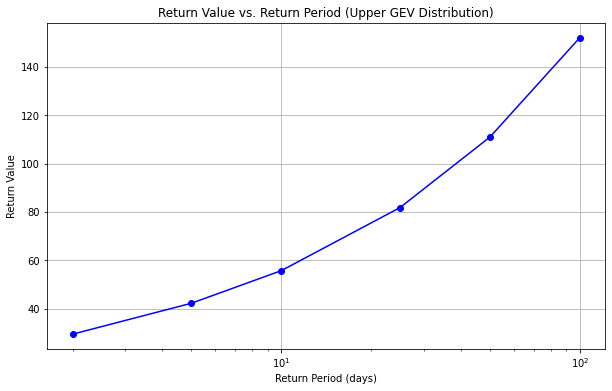

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


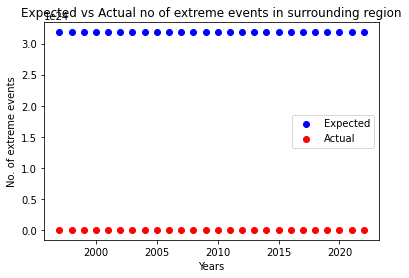

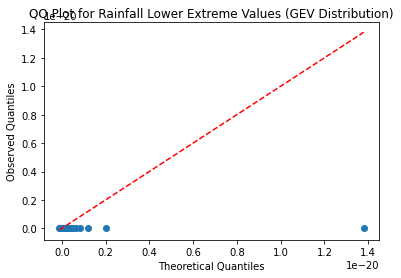

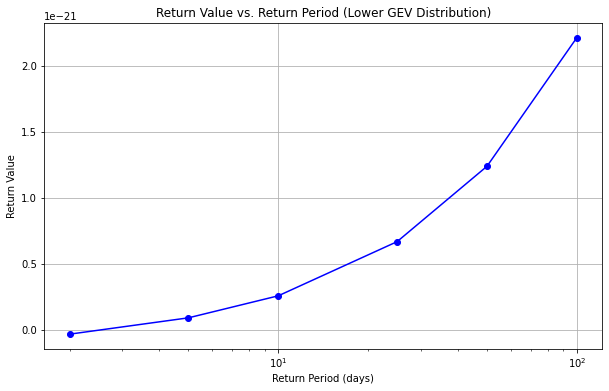

((12, 14), (80, 82))
31720


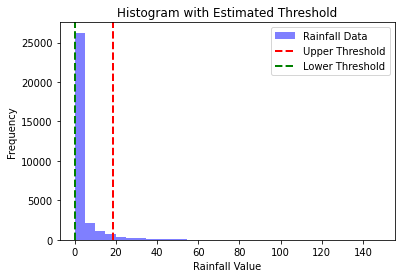

Estimated Upper Threshold: 18.50
Estimated Lower Threshold: 0.00


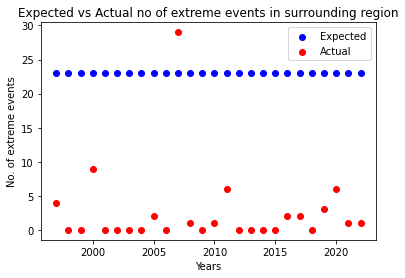

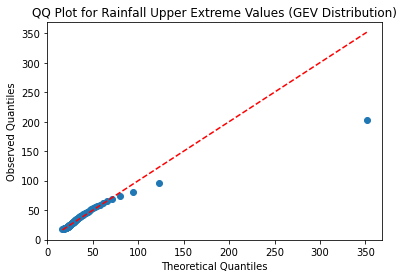

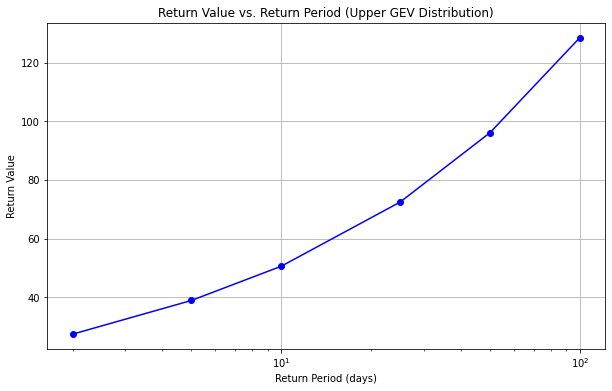

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


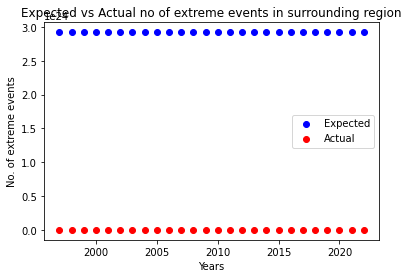

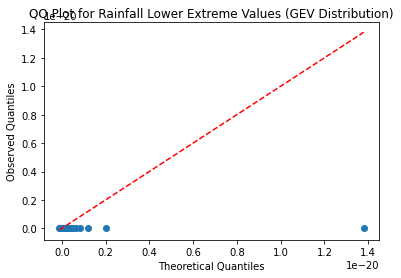

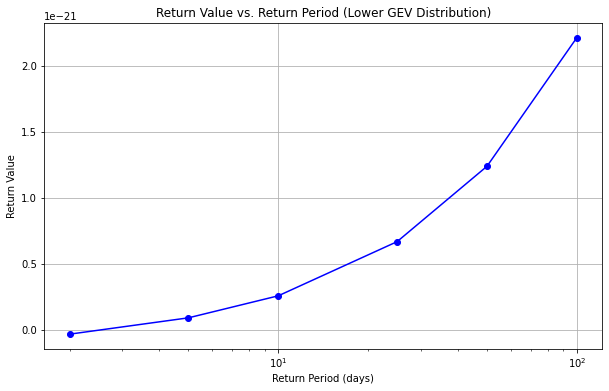

((12, 14), (82, 84))
((12, 14), (84, 86))
((12, 14), (86, 88))
((12, 14), (88, 90))
((12, 14), (90, 92))
((12, 14), (92, 94))
((12, 14), (94, 96))
((12, 14), (96, 98))
((12, 14), (98, 100))
((14, 16), (68, 70))
((14, 16), (70, 72))
((14, 16), (72, 74))
34892


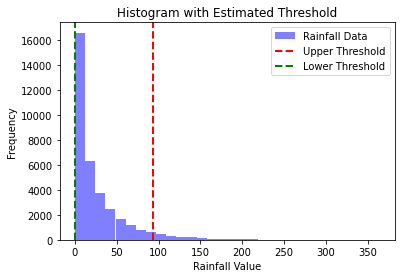

Estimated Upper Threshold: 93.66
Estimated Lower Threshold: 0.00


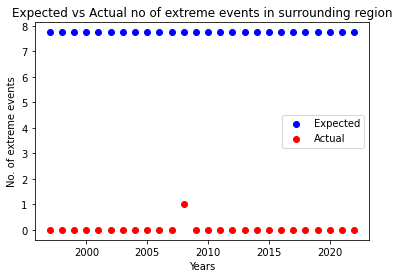

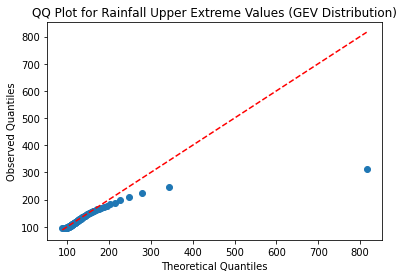

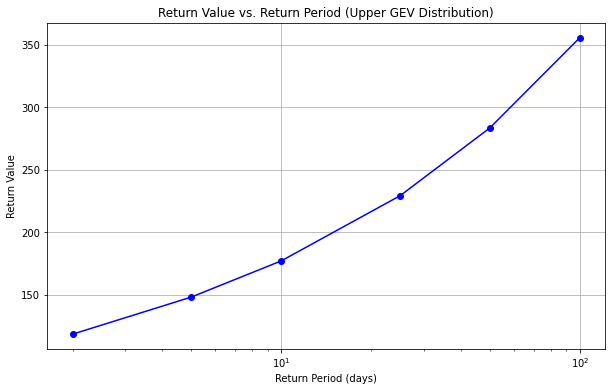

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


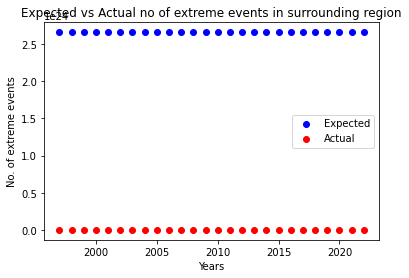

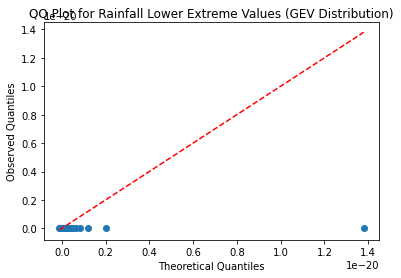

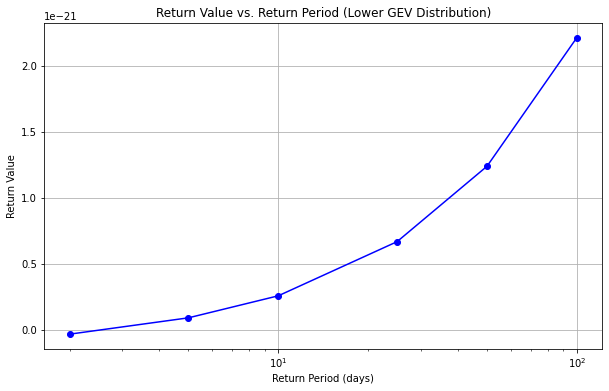

((14, 16), (74, 76))
241072


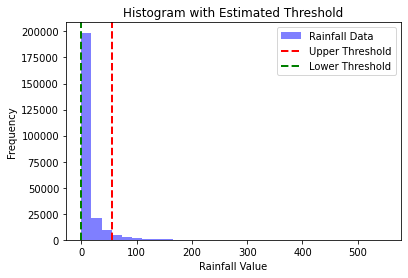

Estimated Upper Threshold: 54.68
Estimated Lower Threshold: 0.00


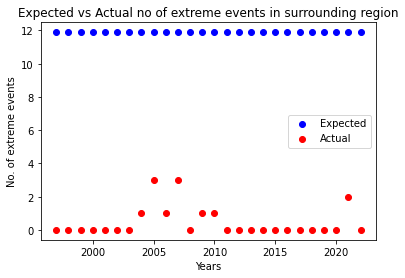

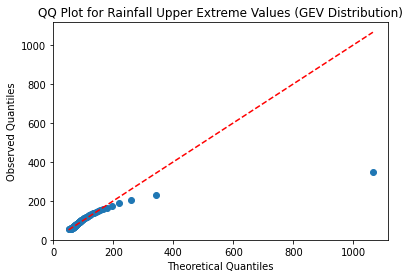

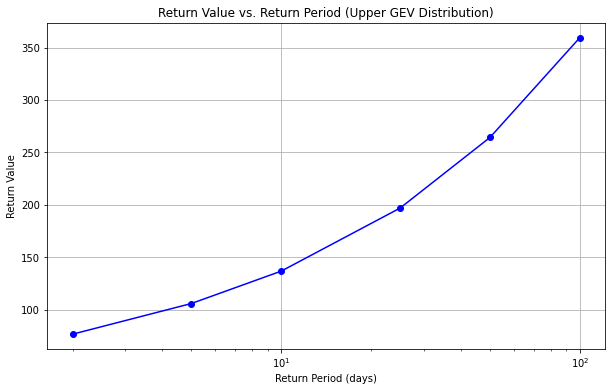

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


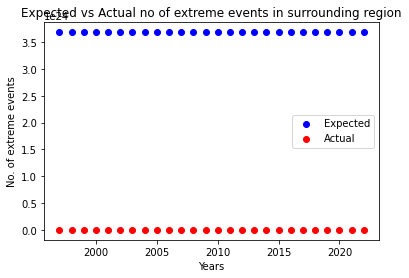

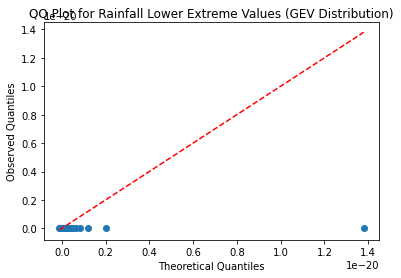

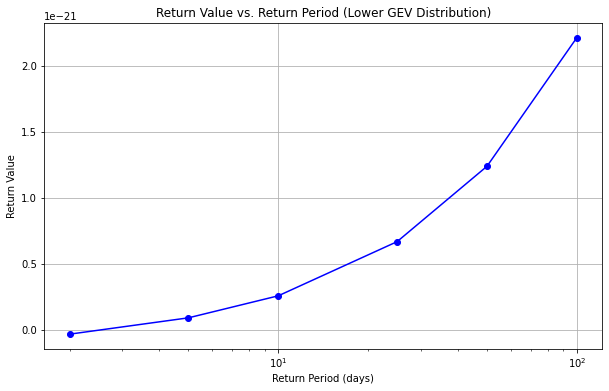

((14, 16), (76, 78))
256932


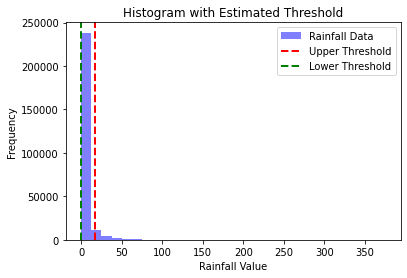

Estimated Upper Threshold: 17.30
Estimated Lower Threshold: 0.00


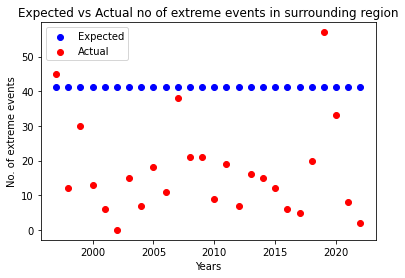

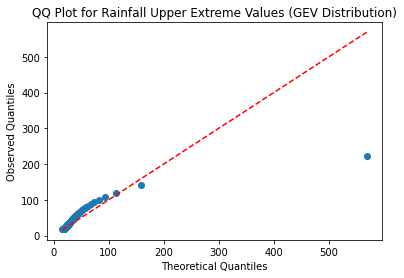

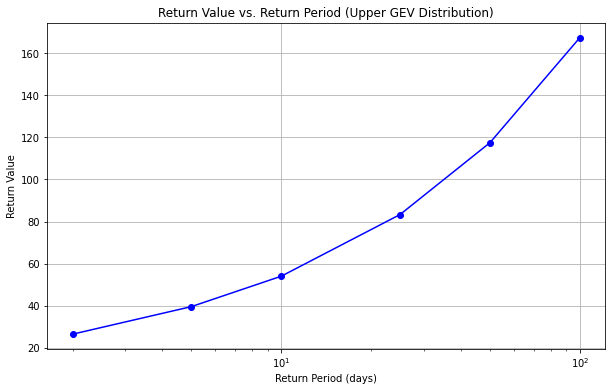

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


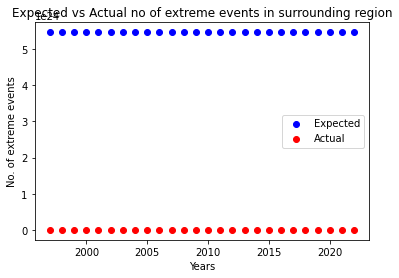

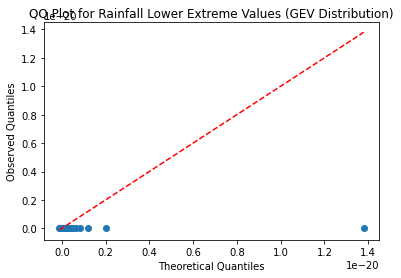

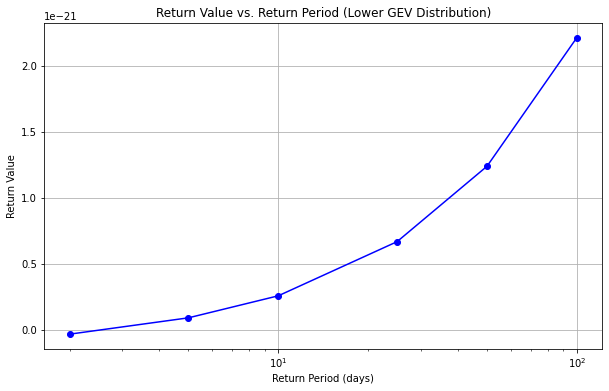

((14, 16), (78, 80))
256932


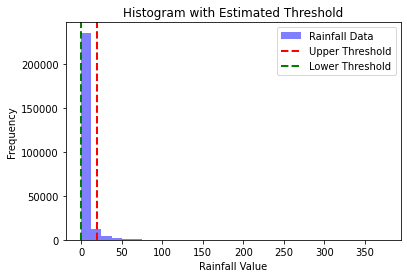

Estimated Upper Threshold: 19.19
Estimated Lower Threshold: 0.00


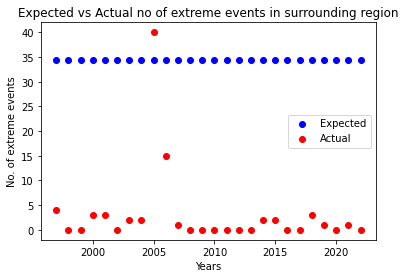

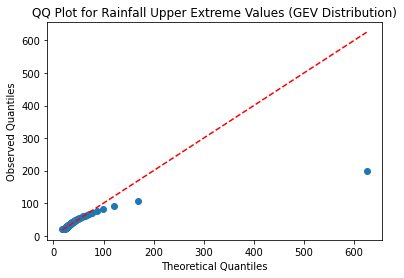

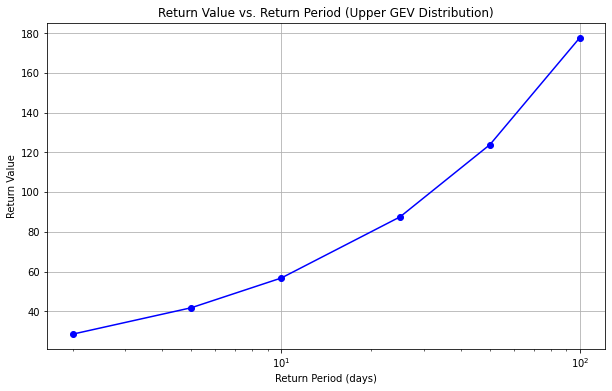

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


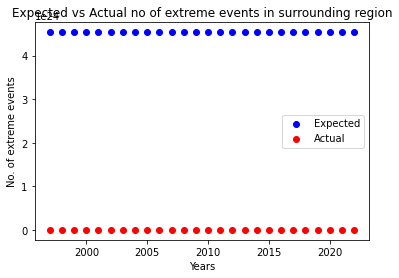

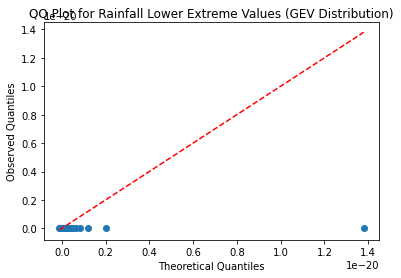

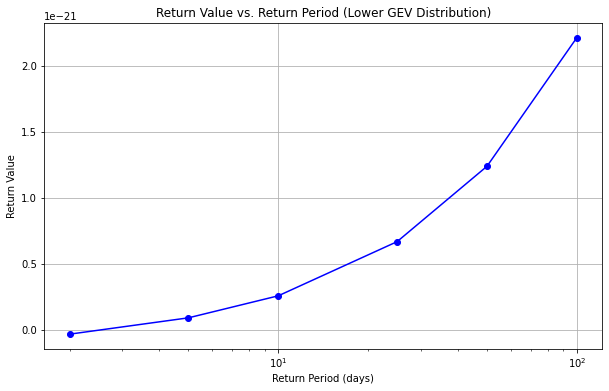

((14, 16), (80, 82))
47580


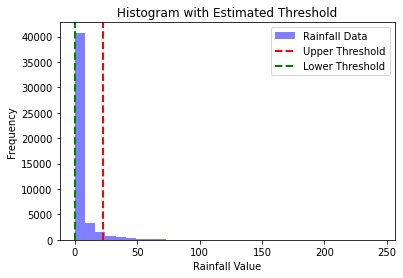

Estimated Upper Threshold: 22.34
Estimated Lower Threshold: 0.00


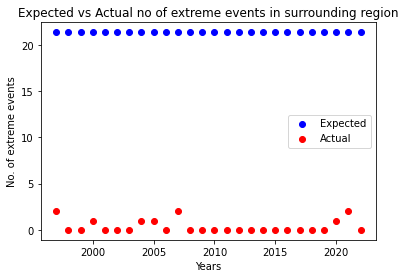

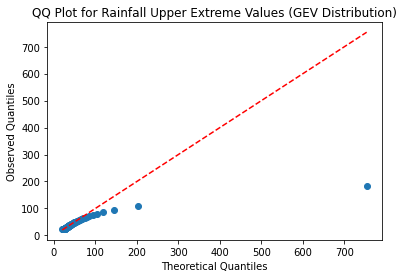

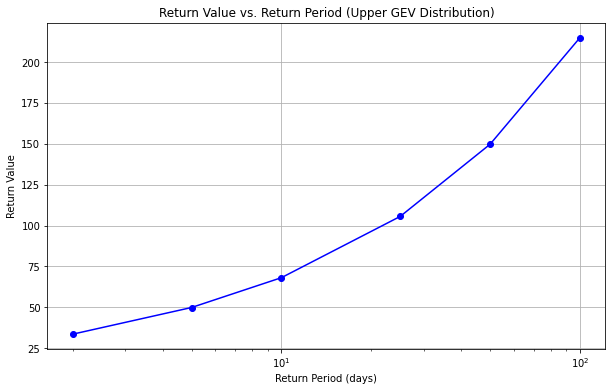

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


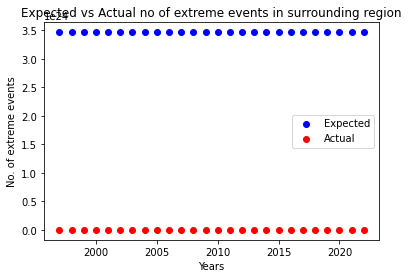

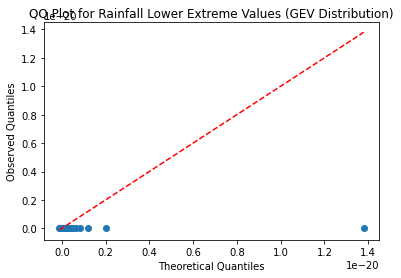

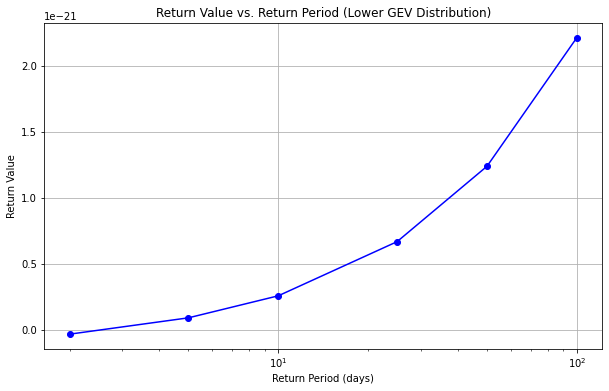

((14, 16), (82, 84))
((14, 16), (84, 86))
((14, 16), (86, 88))
((14, 16), (88, 90))
((14, 16), (90, 92))
((14, 16), (92, 94))
((14, 16), (94, 96))
((14, 16), (96, 98))
((14, 16), (98, 100))
((16, 18), (68, 70))
((16, 18), (70, 72))
((16, 18), (72, 74))
120536


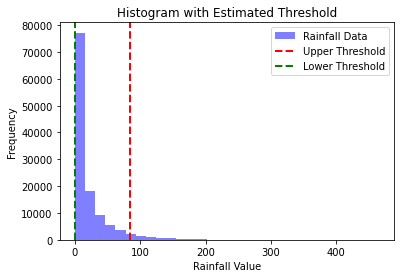

Estimated Upper Threshold: 84.47
Estimated Lower Threshold: 0.00


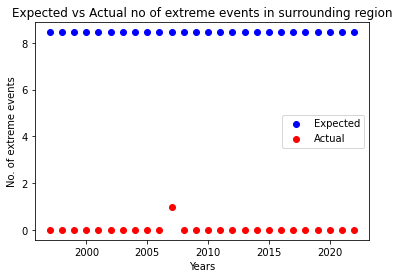

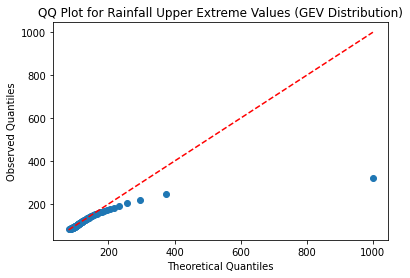

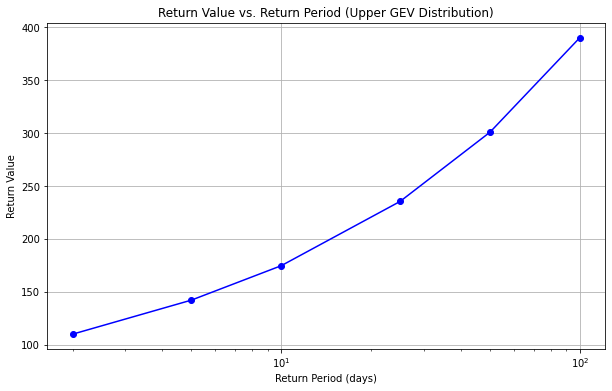

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


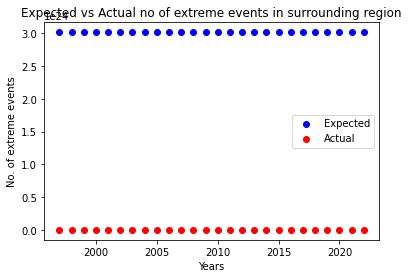

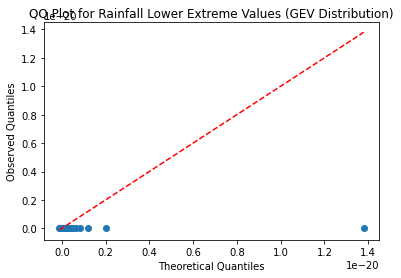

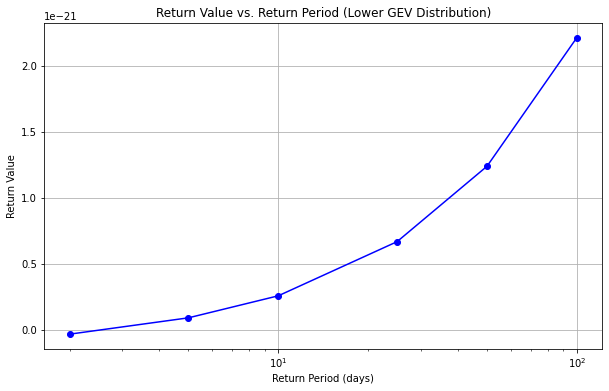

((16, 18), (74, 76))
256932


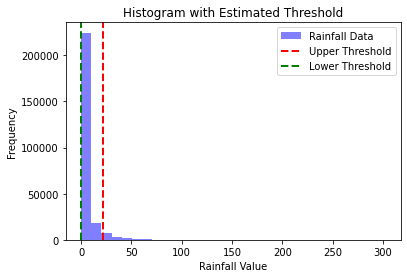

Estimated Upper Threshold: 22.10
Estimated Lower Threshold: 0.00


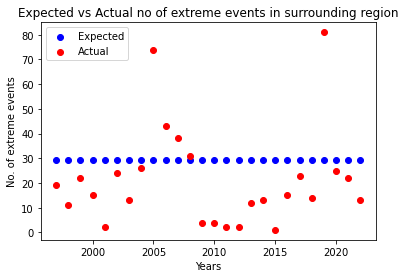

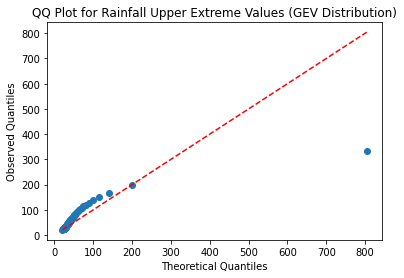

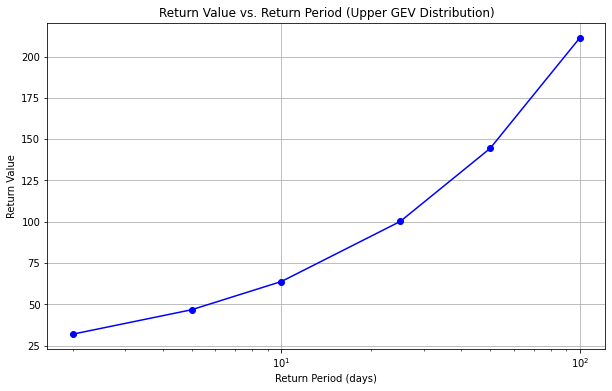

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


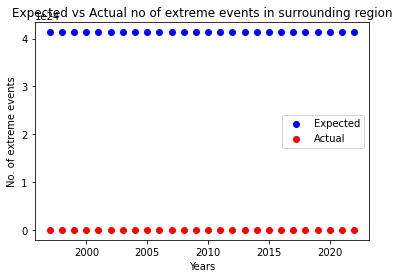

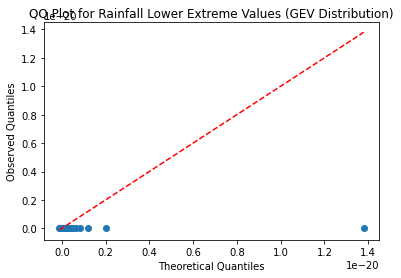

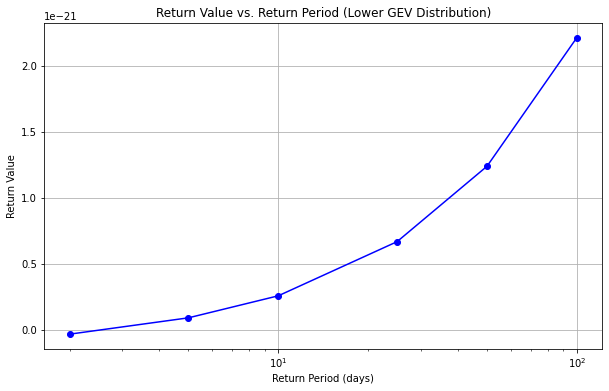

((16, 18), (76, 78))
256932


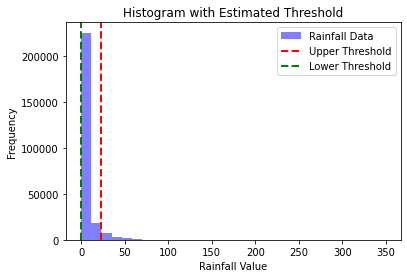

Estimated Upper Threshold: 23.20
Estimated Lower Threshold: 0.00


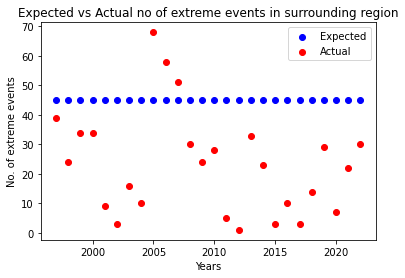

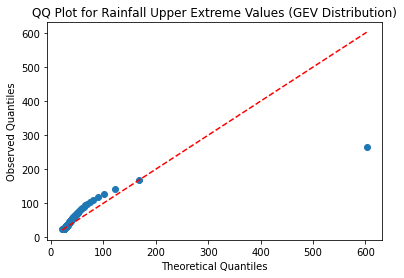

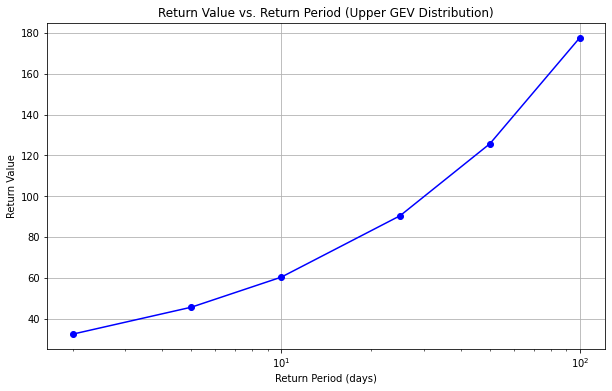

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


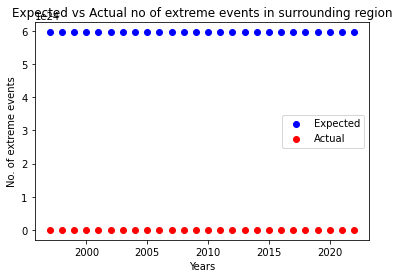

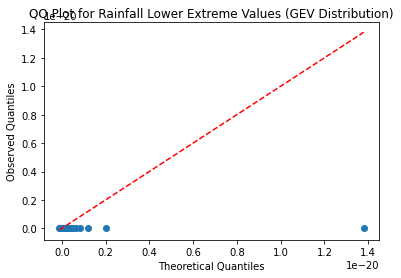

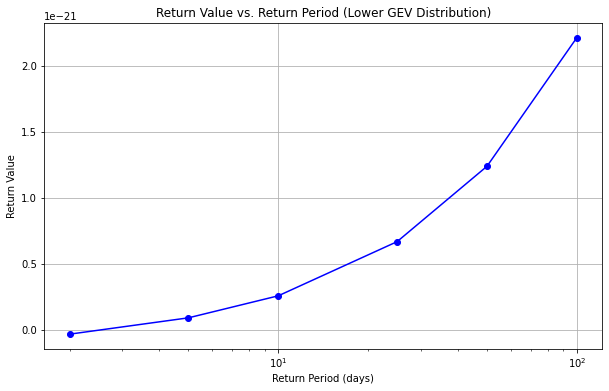

((16, 18), (78, 80))
256932


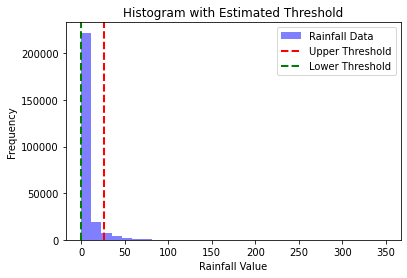

Estimated Upper Threshold: 25.96
Estimated Lower Threshold: 0.00


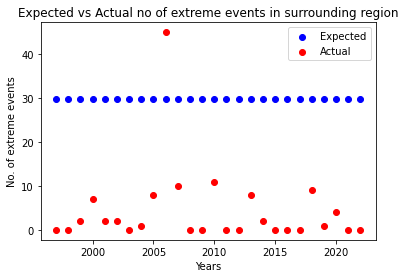

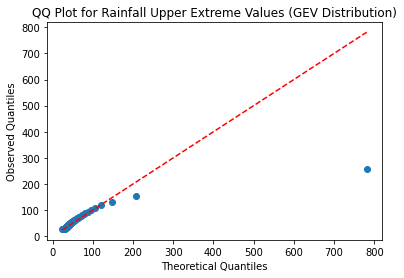

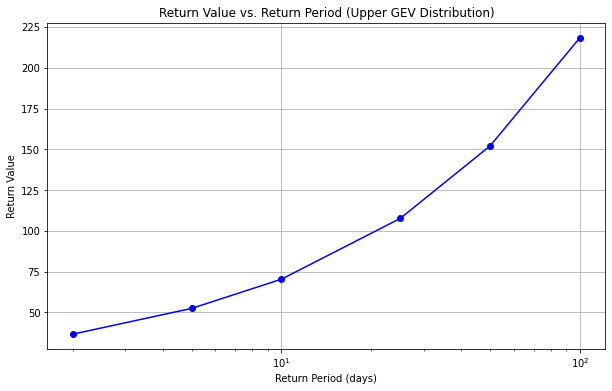

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


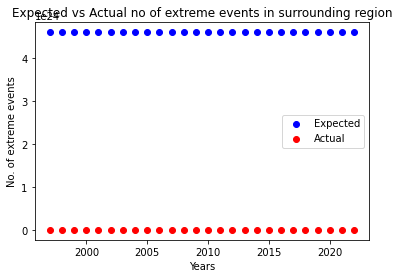

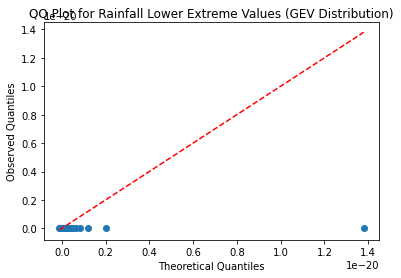

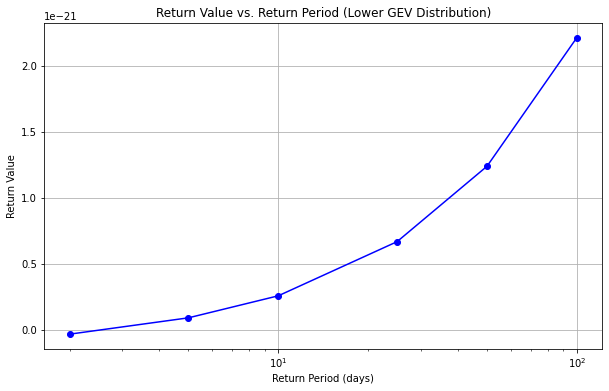

((16, 18), (80, 82))
231556


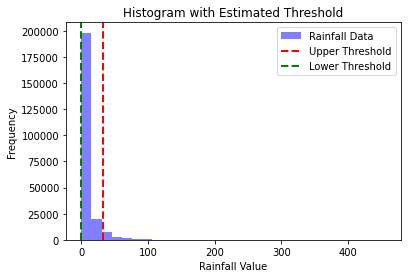

Estimated Upper Threshold: 32.98
Estimated Lower Threshold: 0.00


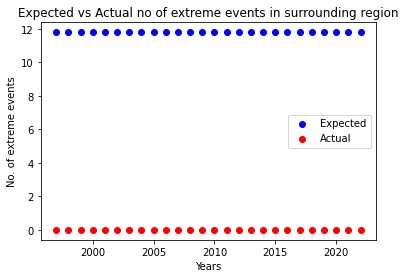

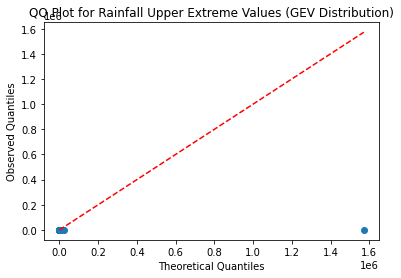

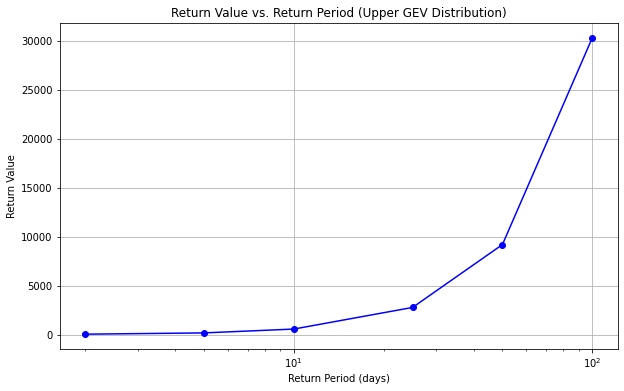

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


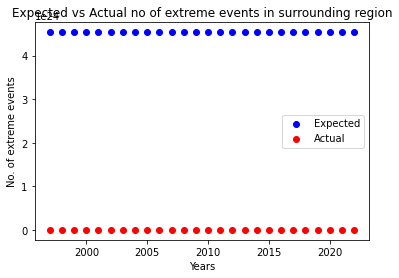

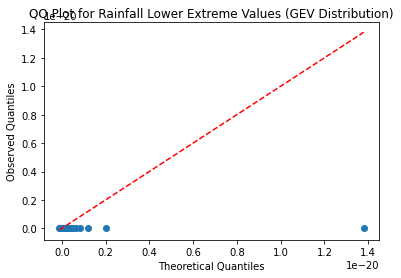

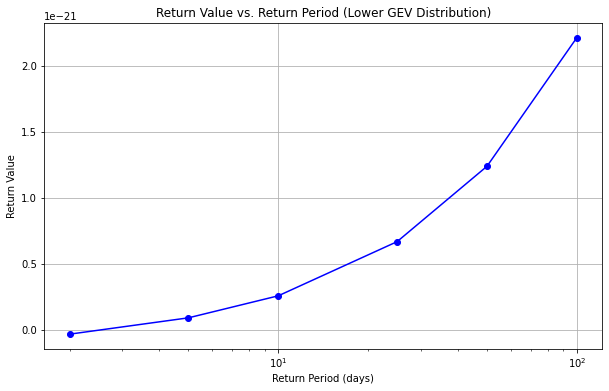

((16, 18), (82, 84))
79300


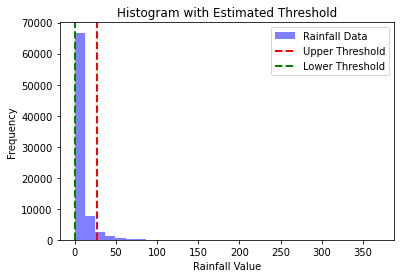

Estimated Upper Threshold: 27.31
Estimated Lower Threshold: 0.00


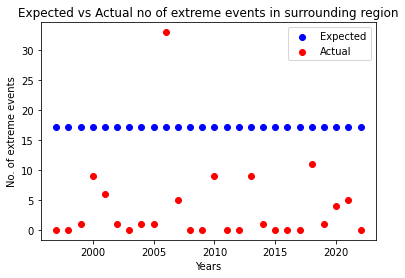

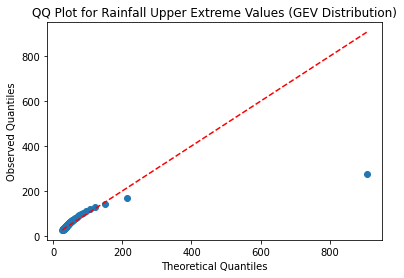

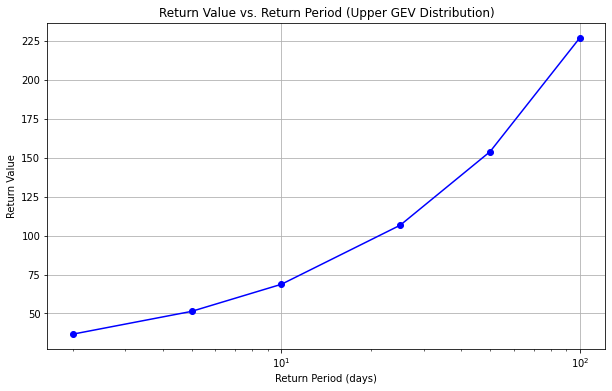

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


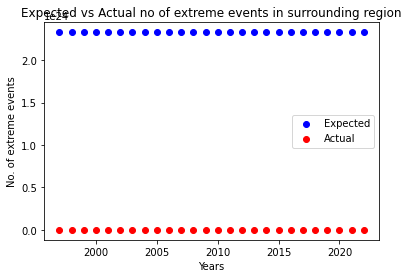

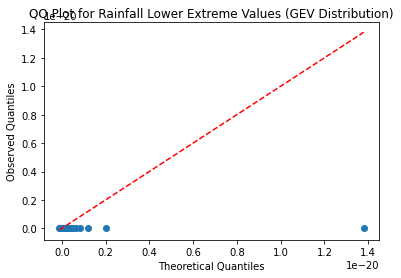

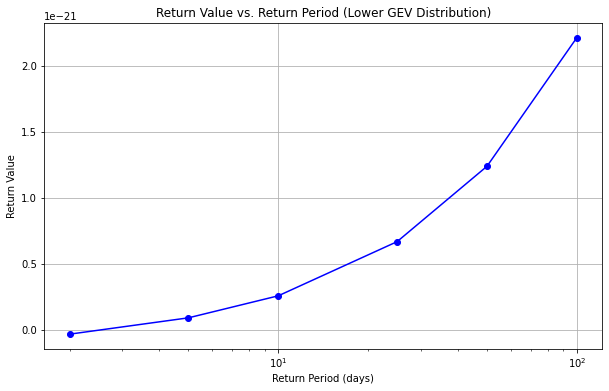

((16, 18), (84, 86))
((16, 18), (86, 88))
((16, 18), (88, 90))
((16, 18), (90, 92))
((16, 18), (92, 94))
((16, 18), (94, 96))
((16, 18), (96, 98))
((16, 18), (98, 100))
((18, 20), (68, 70))
((18, 20), (70, 72))
((18, 20), (72, 74))
174460


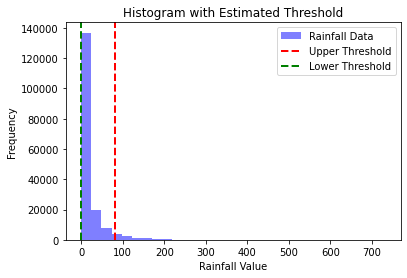

Estimated Upper Threshold: 80.82
Estimated Lower Threshold: 0.00


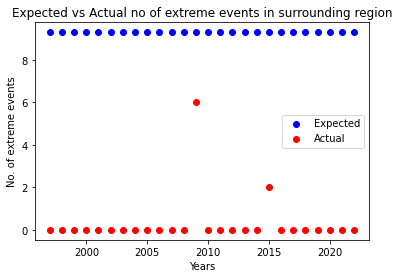

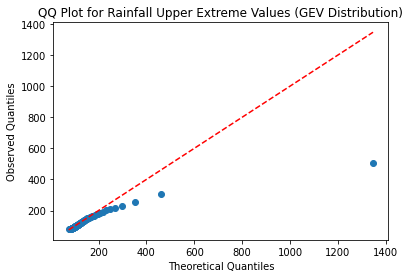

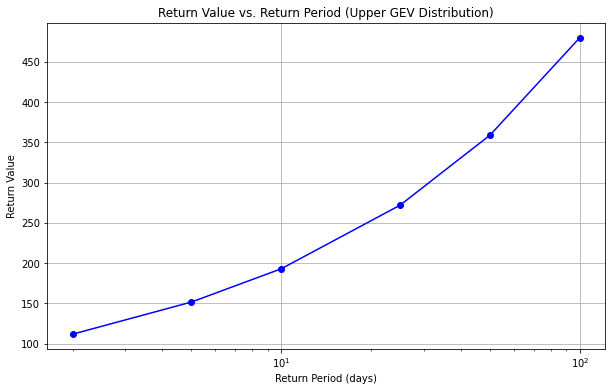

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


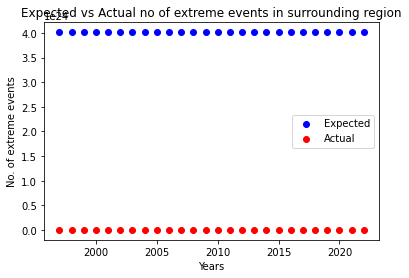

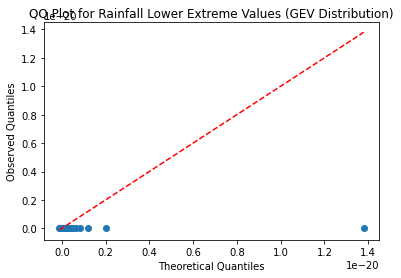

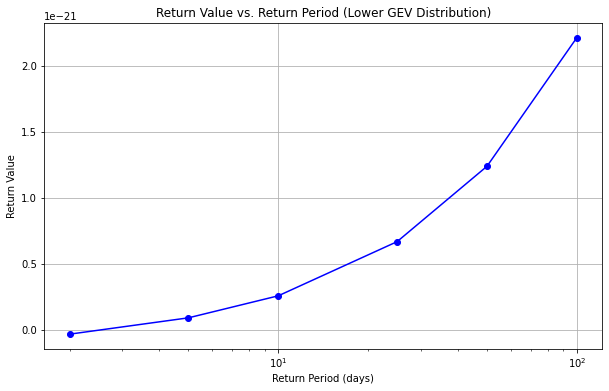

((18, 20), (74, 76))
256932


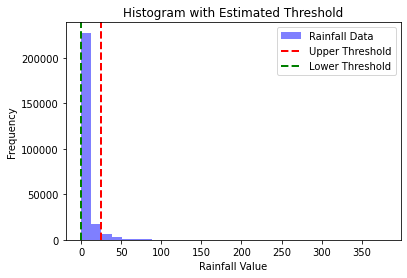

Estimated Upper Threshold: 24.37
Estimated Lower Threshold: 0.00


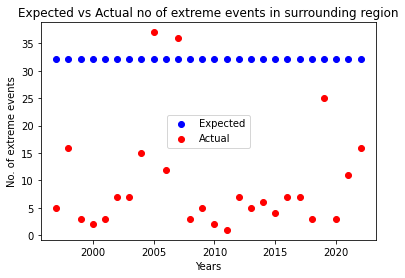

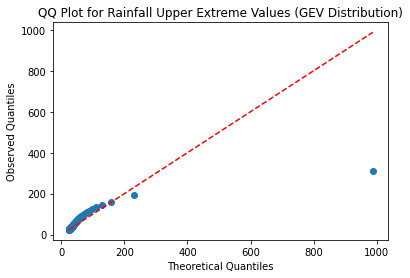

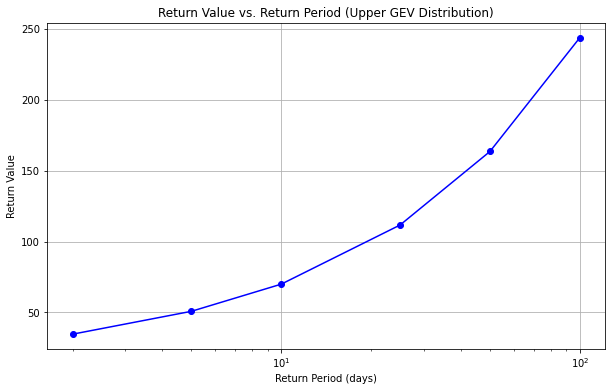

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


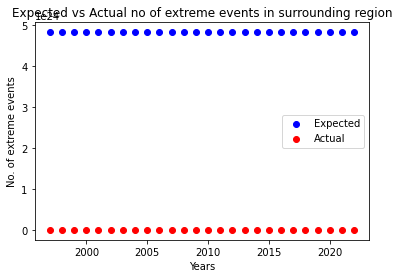

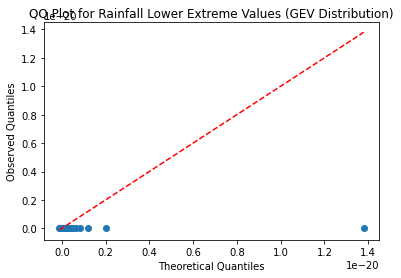

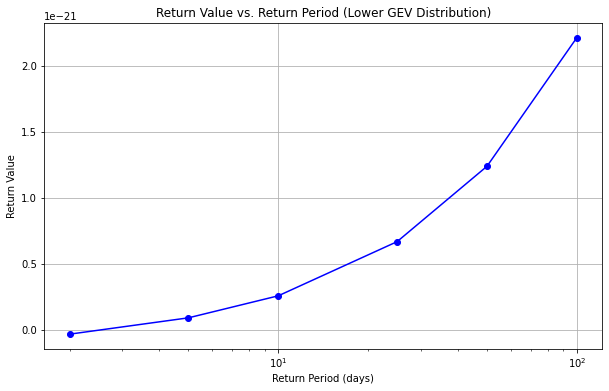

((18, 20), (76, 78))
256932


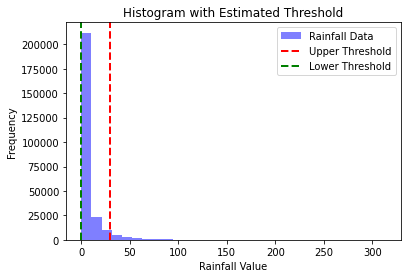

Estimated Upper Threshold: 29.83
Estimated Lower Threshold: 0.00


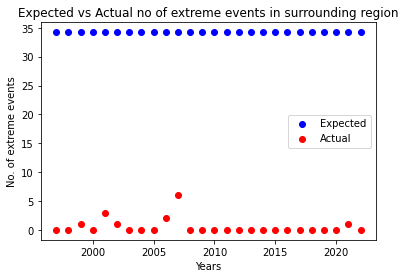

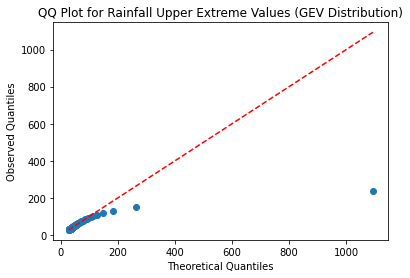

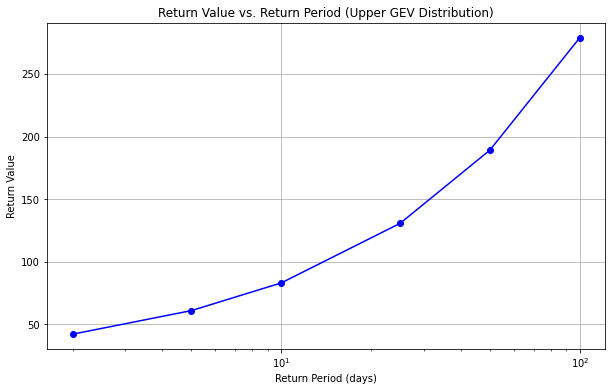

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


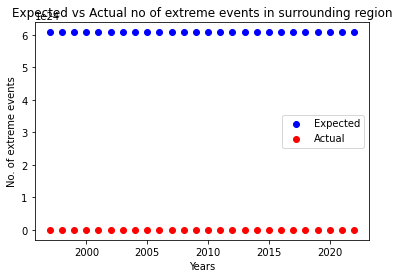

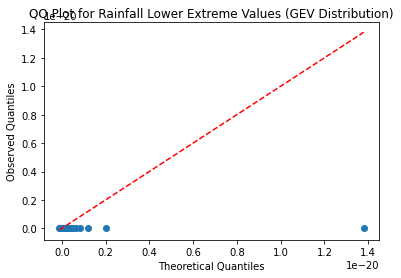

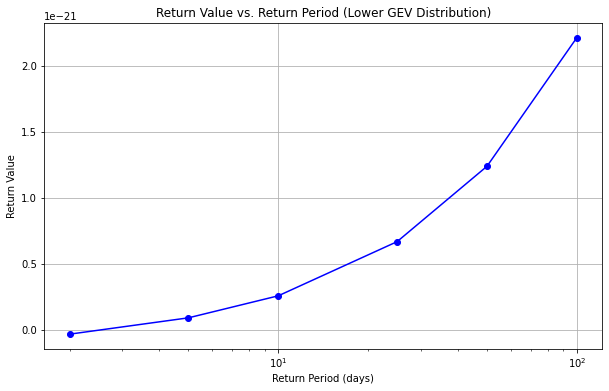

((18, 20), (78, 80))
256932


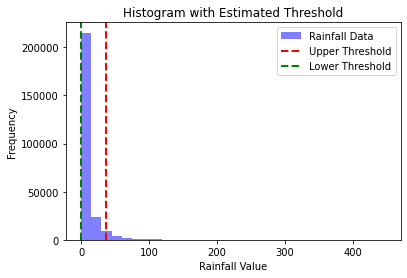

Estimated Upper Threshold: 37.26
Estimated Lower Threshold: 0.00


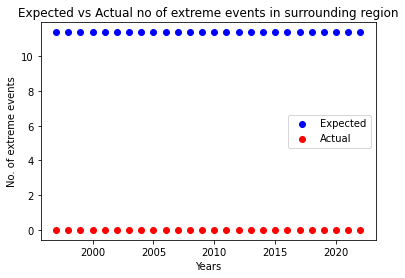

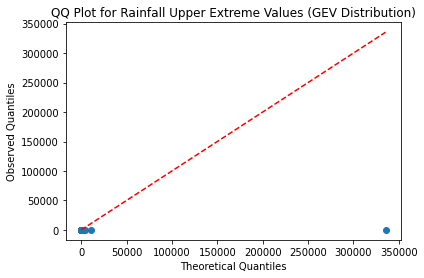

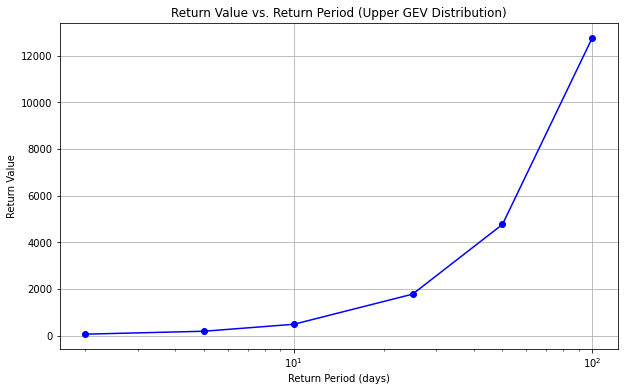

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


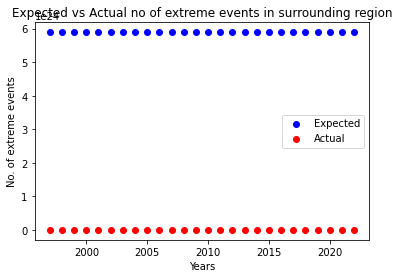

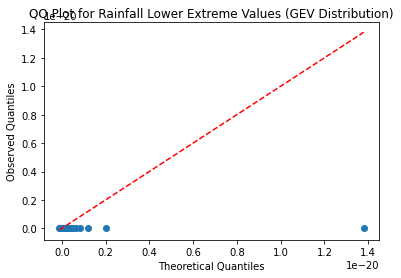

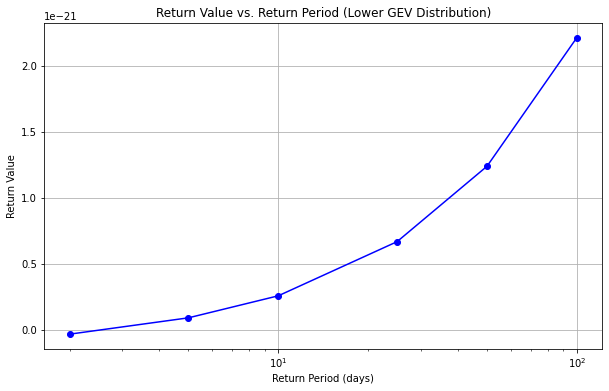

((18, 20), (80, 82))
256932


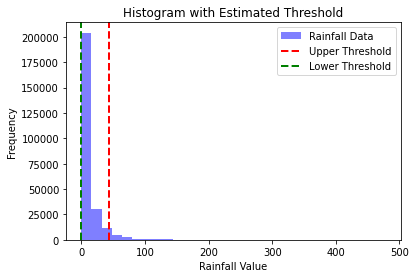

Estimated Upper Threshold: 44.20
Estimated Lower Threshold: 0.00


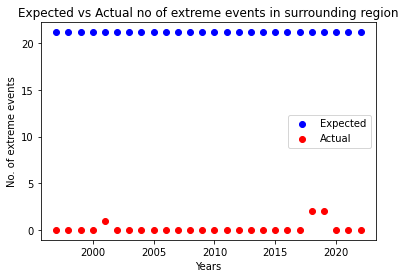

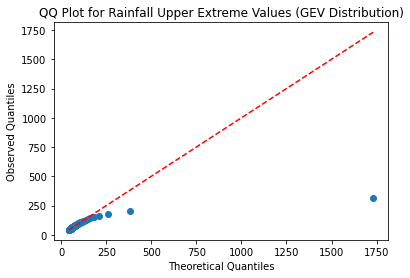

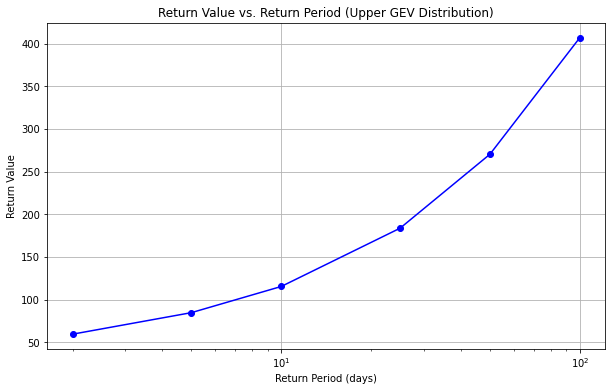

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


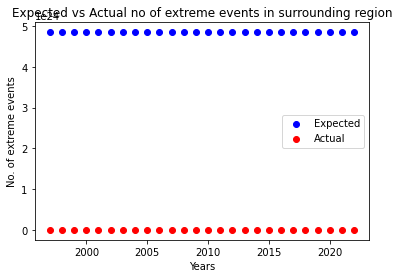

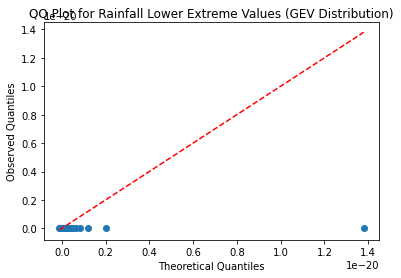

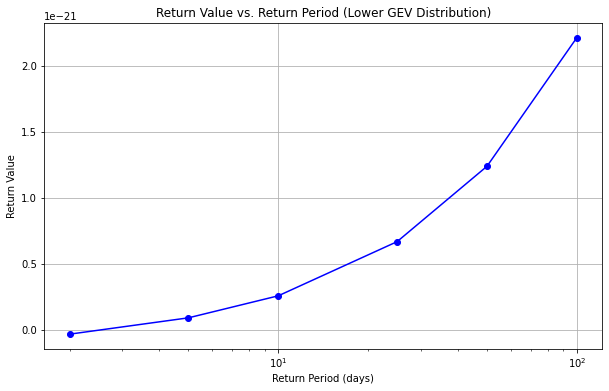

((18, 20), (82, 84))
247416


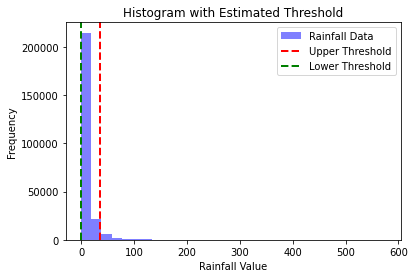

Estimated Upper Threshold: 36.15
Estimated Lower Threshold: 0.00


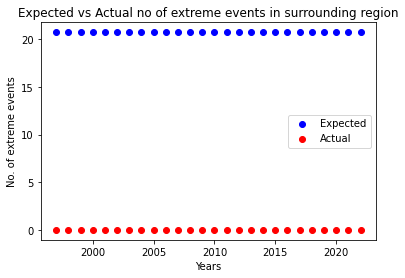

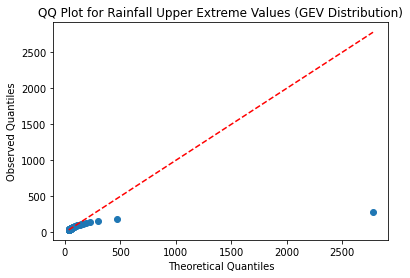

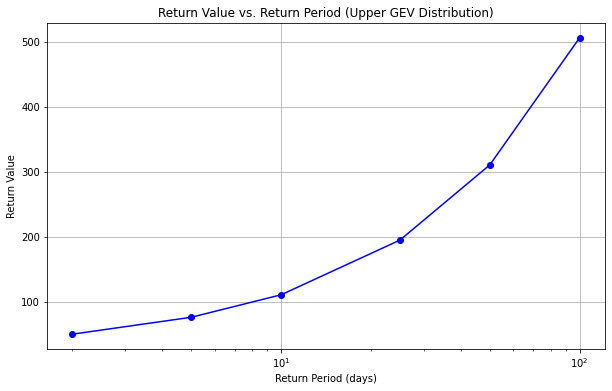

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


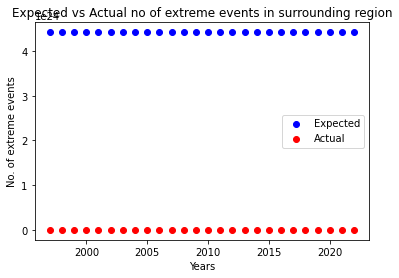

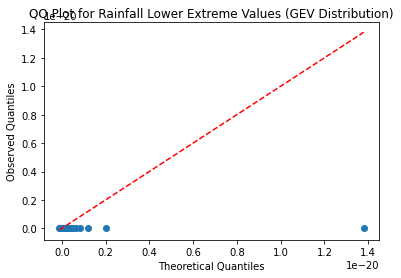

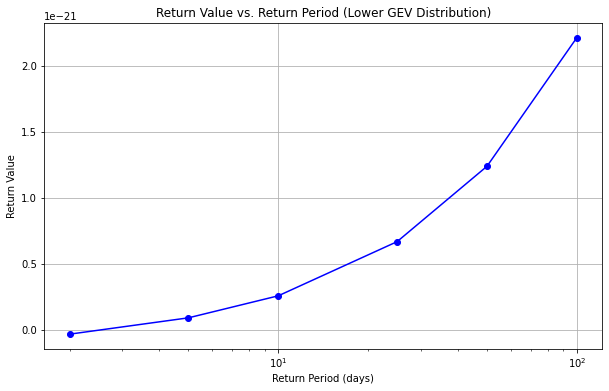

((18, 20), (84, 86))
98332


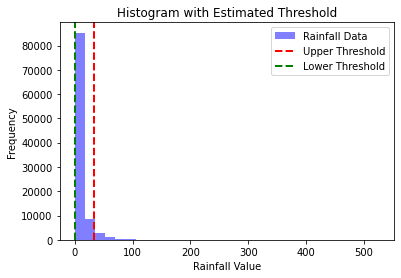

Estimated Upper Threshold: 33.79
Estimated Lower Threshold: 0.00


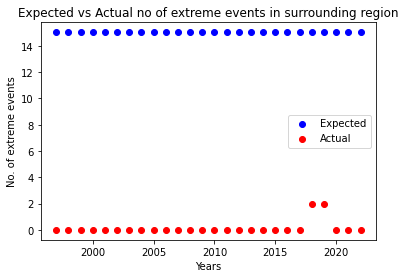

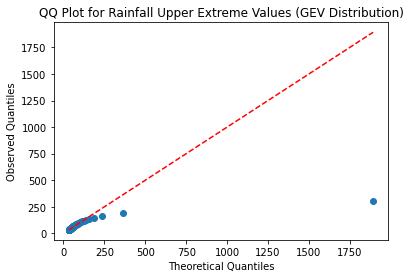

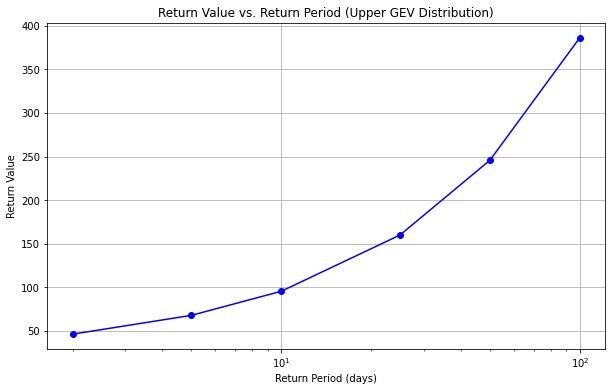

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


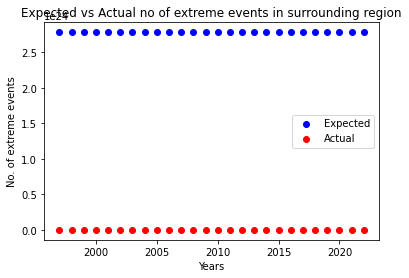

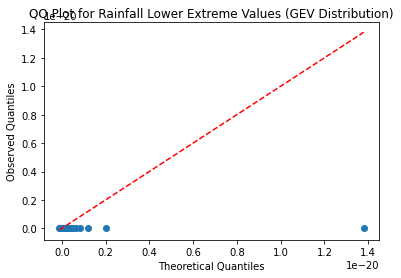

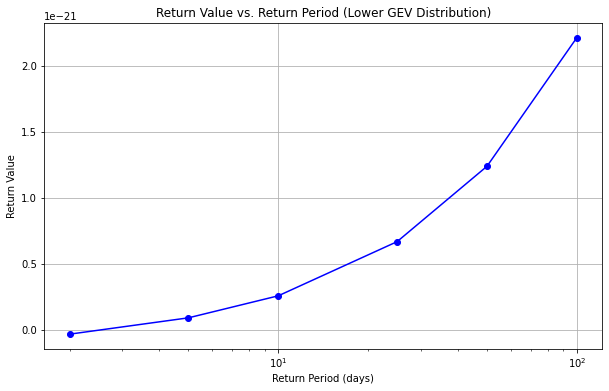

((18, 20), (86, 88))
6344


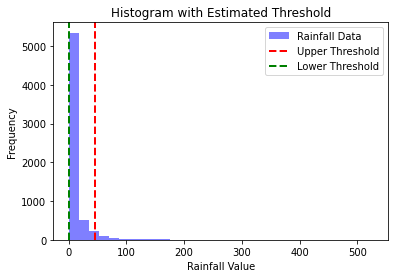

Estimated Upper Threshold: 46.45
Estimated Lower Threshold: 0.00


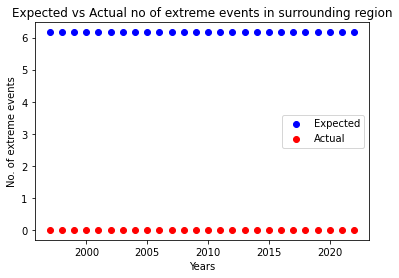

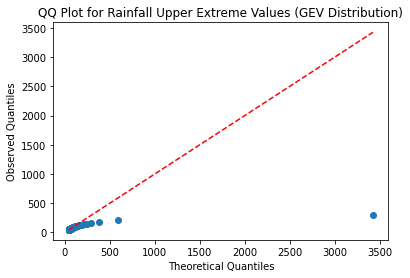

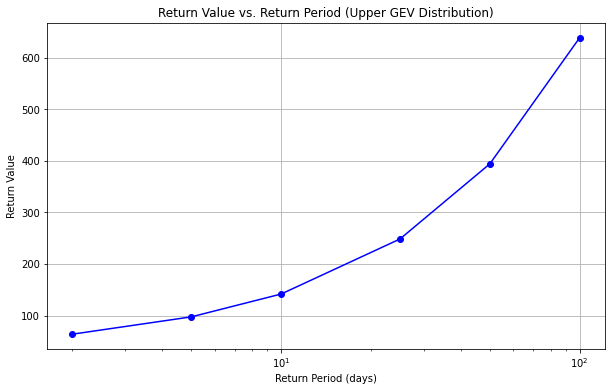

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


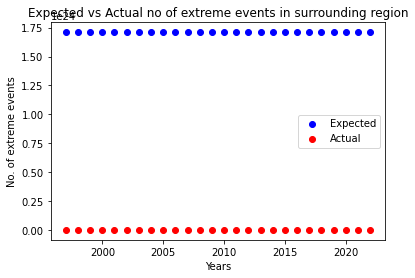

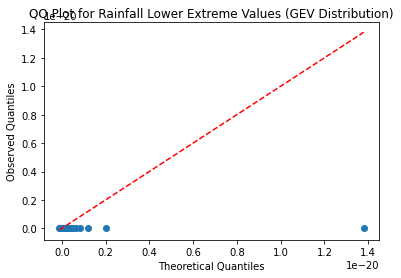

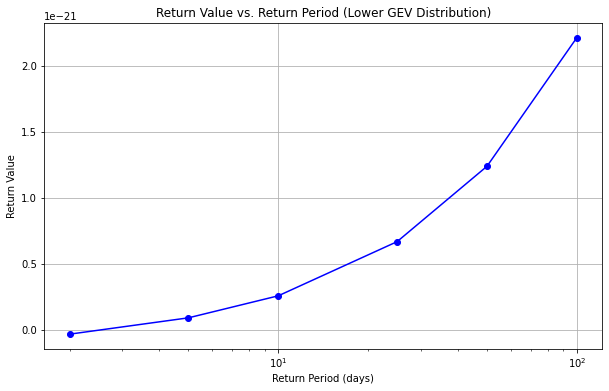

((18, 20), (88, 90))
((18, 20), (90, 92))
((18, 20), (92, 94))
((18, 20), (94, 96))
((18, 20), (96, 98))
((18, 20), (98, 100))
((20, 22), (68, 70))
47580


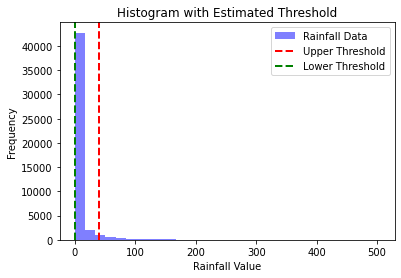

Estimated Upper Threshold: 39.92
Estimated Lower Threshold: 0.00


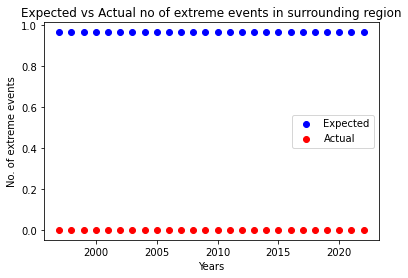

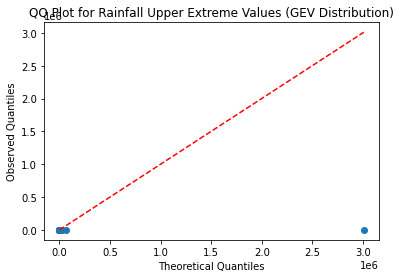

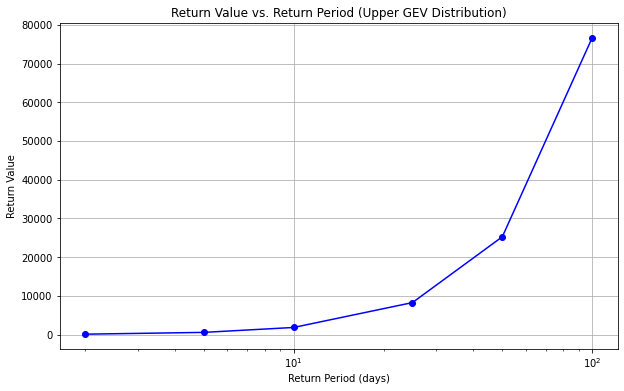

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


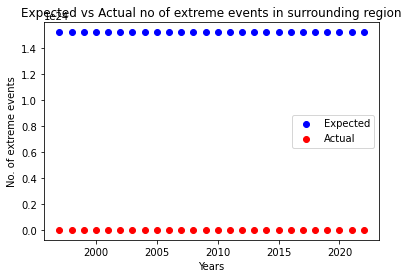

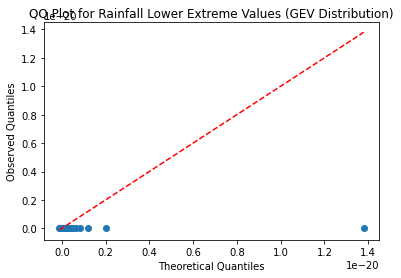

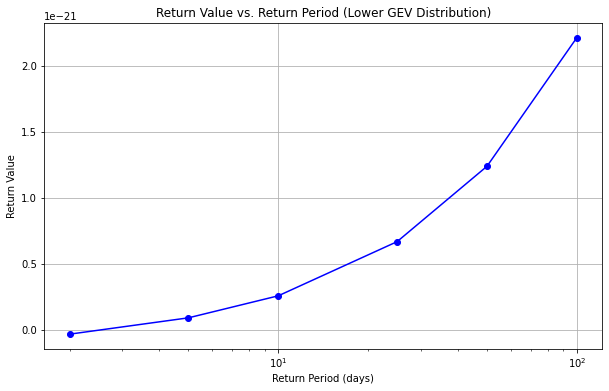

((20, 22), (70, 72))
142740


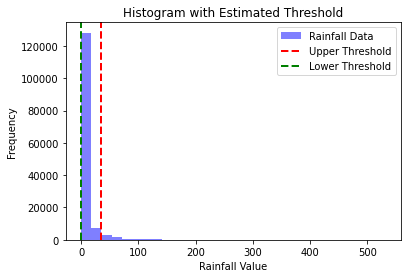

Estimated Upper Threshold: 35.26
Estimated Lower Threshold: 0.00


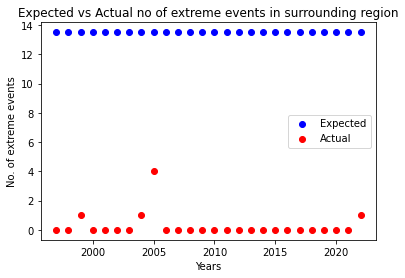

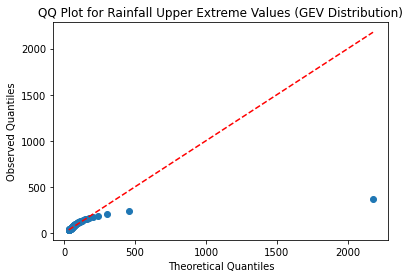

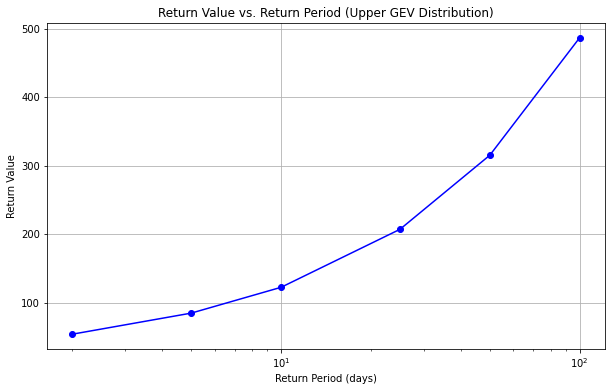

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


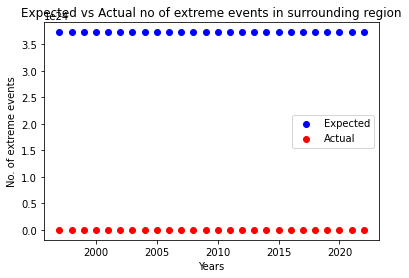

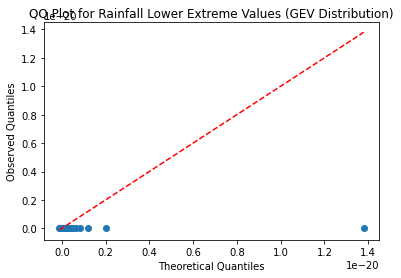

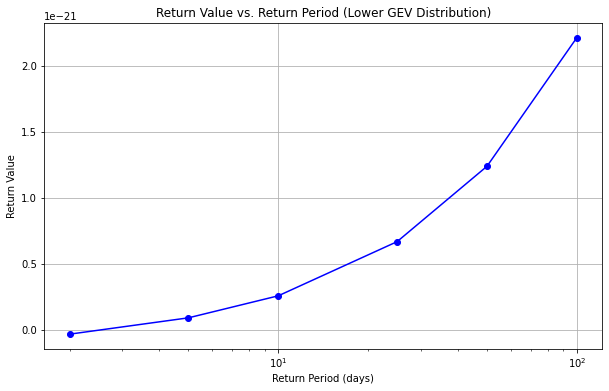

((20, 22), (72, 74))
206180


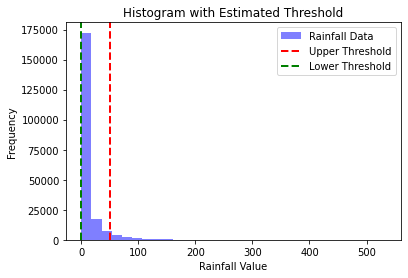

Estimated Upper Threshold: 50.31
Estimated Lower Threshold: 0.00


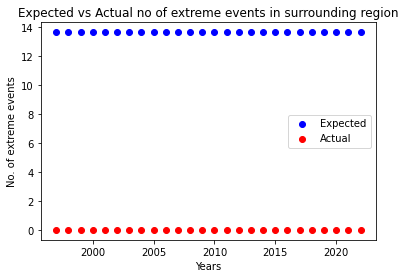

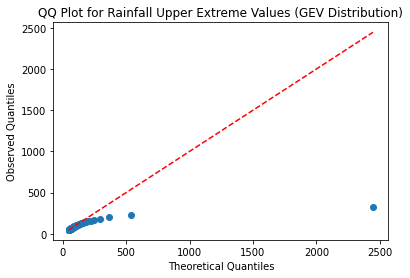

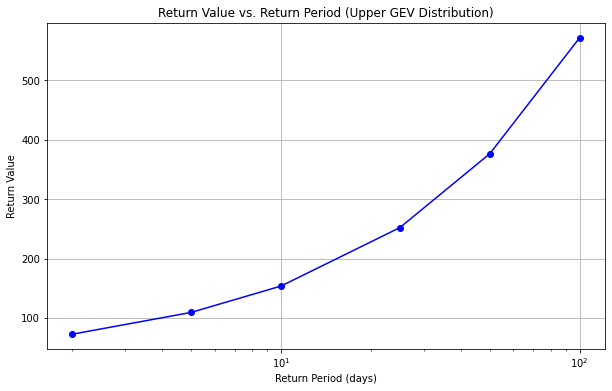

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


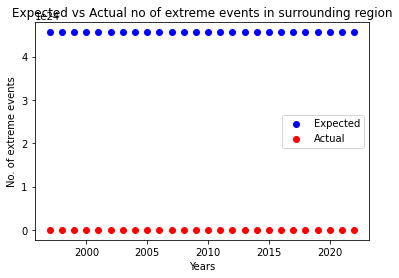

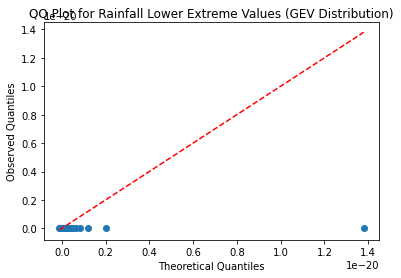

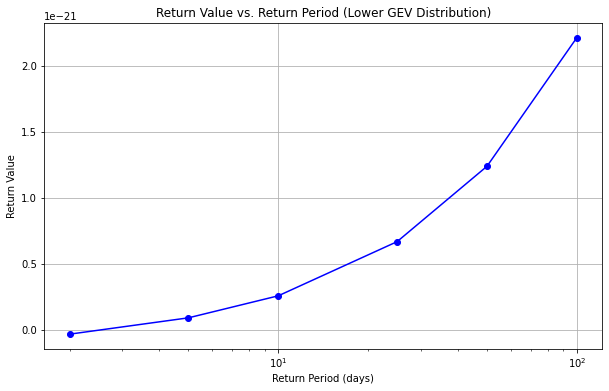

((20, 22), (74, 76))
256932


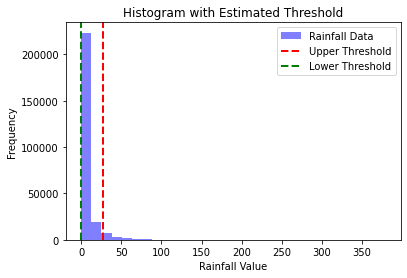

Estimated Upper Threshold: 26.83
Estimated Lower Threshold: 0.00


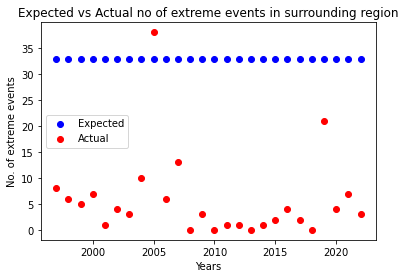

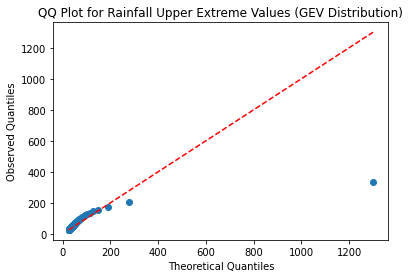

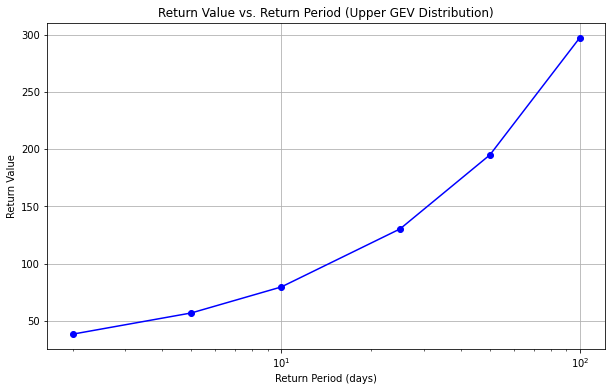

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


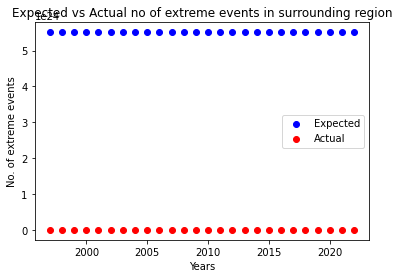

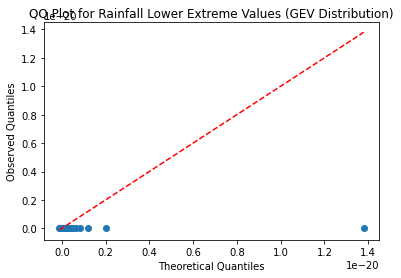

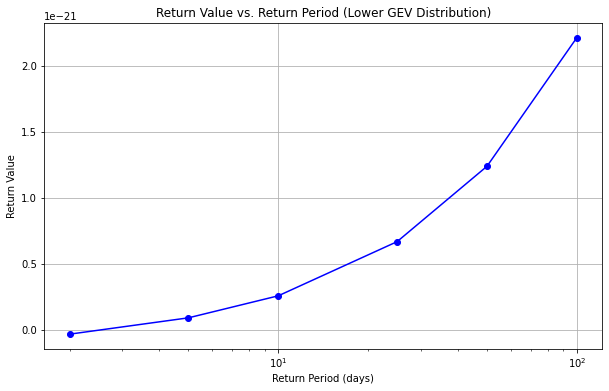

((20, 22), (76, 78))
256932


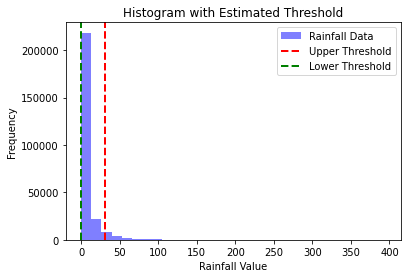

Estimated Upper Threshold: 30.69
Estimated Lower Threshold: 0.00


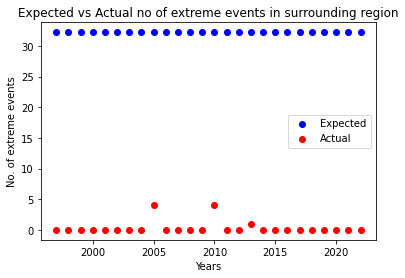

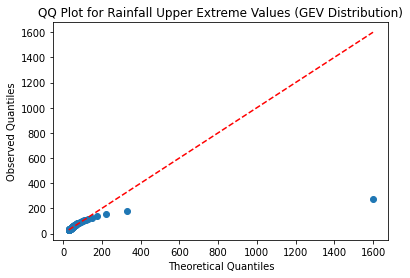

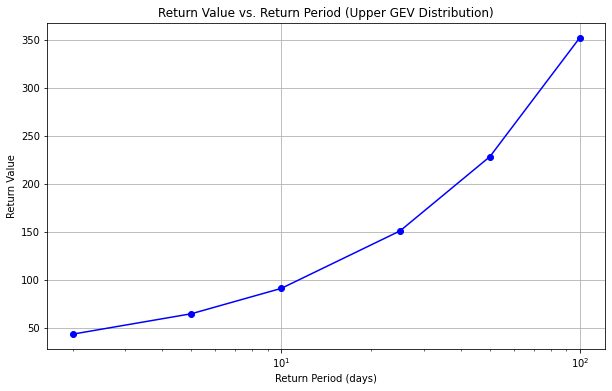

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


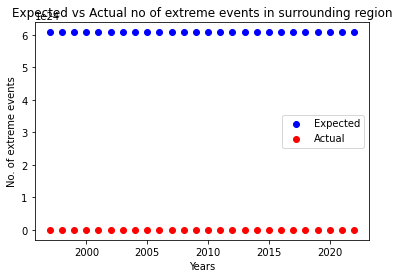

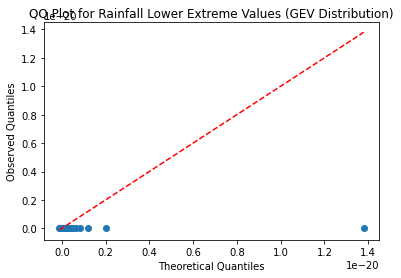

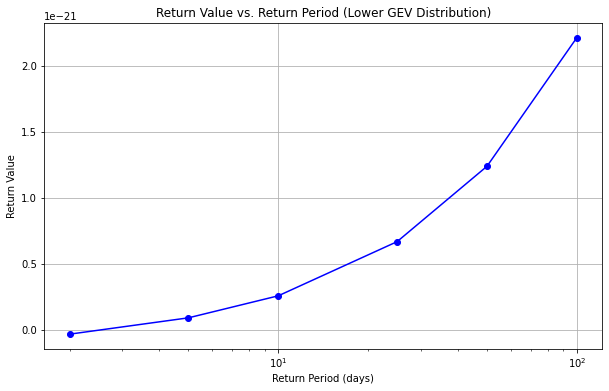

((20, 22), (78, 80))
256932


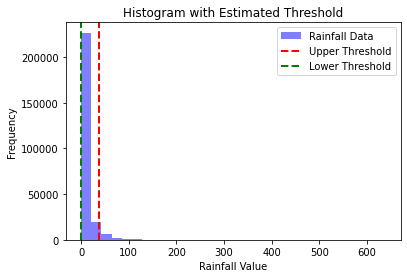

Estimated Upper Threshold: 37.68
Estimated Lower Threshold: 0.00


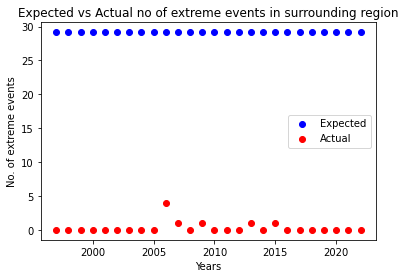

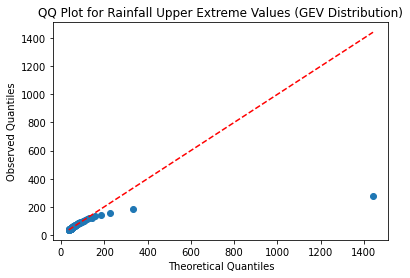

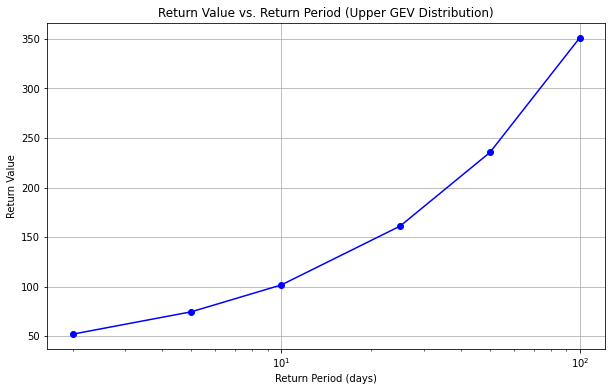

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


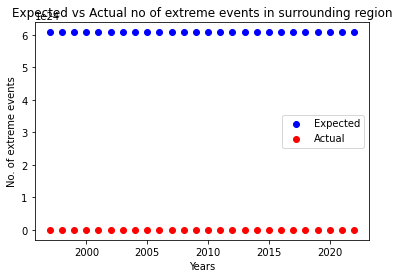

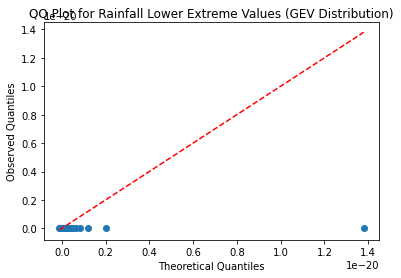

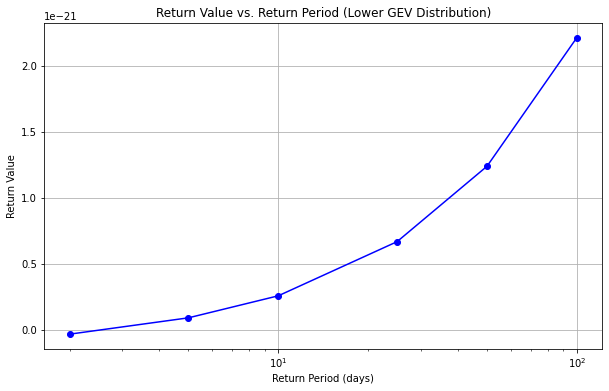

((20, 22), (80, 82))
256932


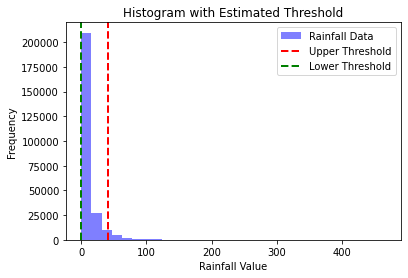

Estimated Upper Threshold: 40.68
Estimated Lower Threshold: 0.00


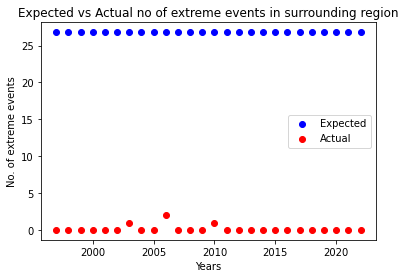

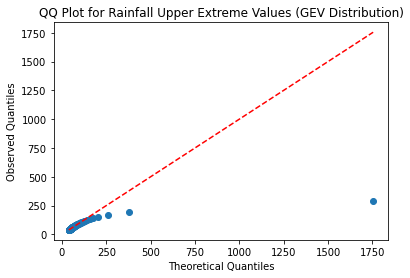

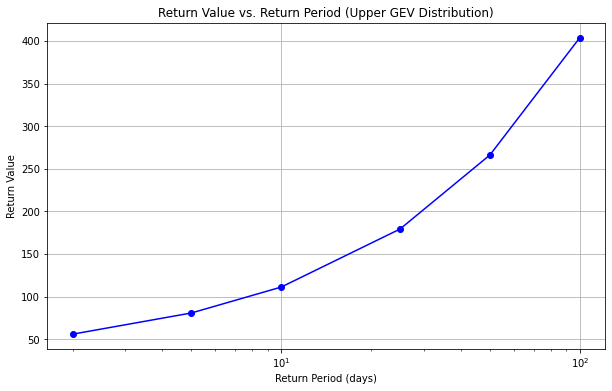

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


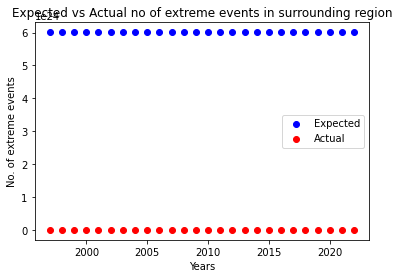

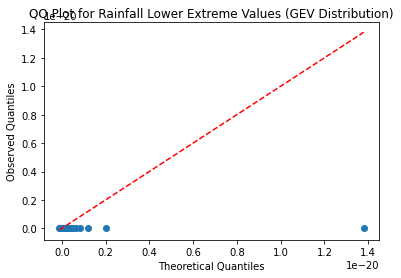

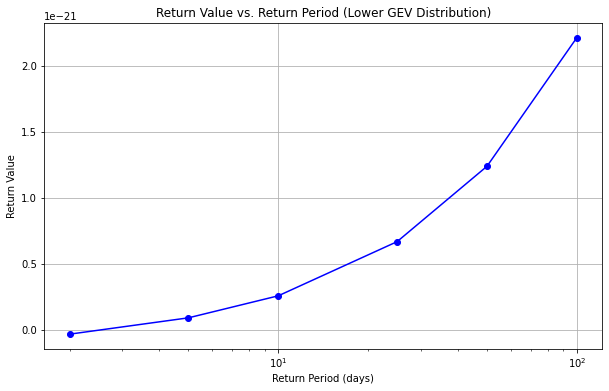

((20, 22), (82, 84))
256932


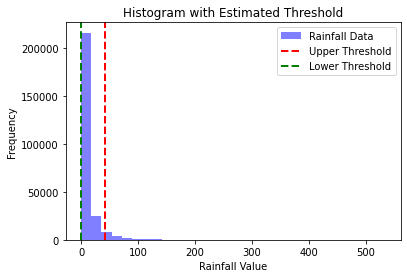

Estimated Upper Threshold: 41.17
Estimated Lower Threshold: 0.00


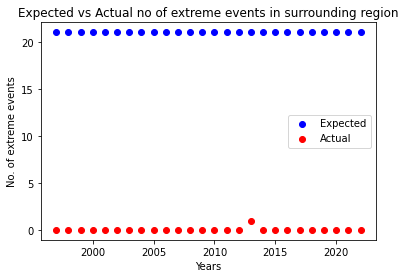

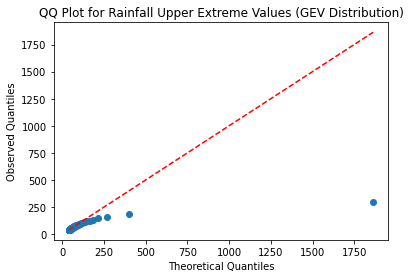

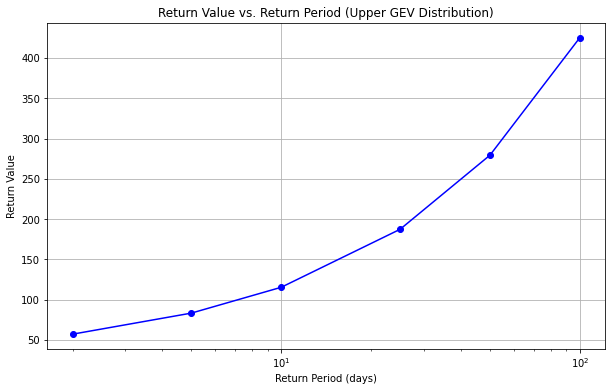

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


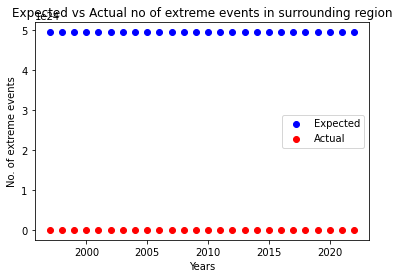

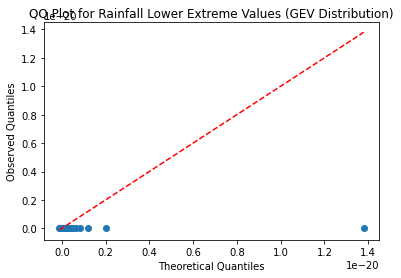

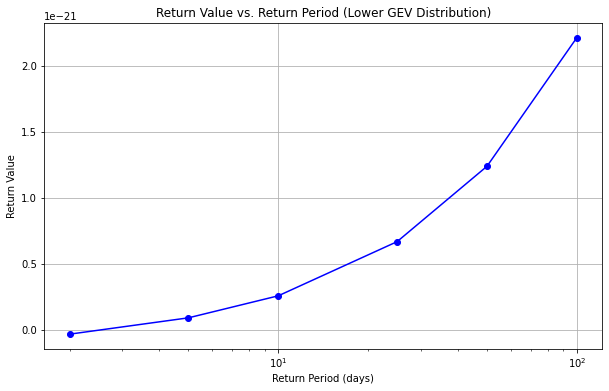

((20, 22), (84, 86))
256932


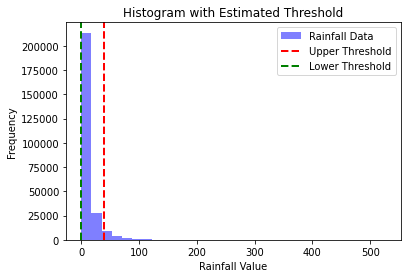

Estimated Upper Threshold: 39.91
Estimated Lower Threshold: 0.00


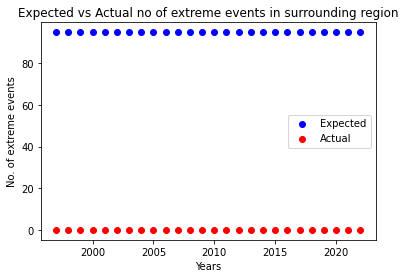

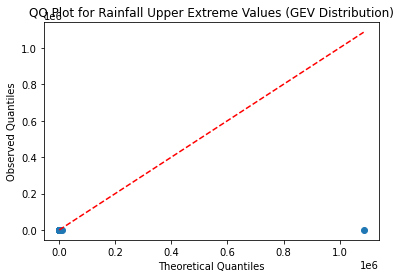

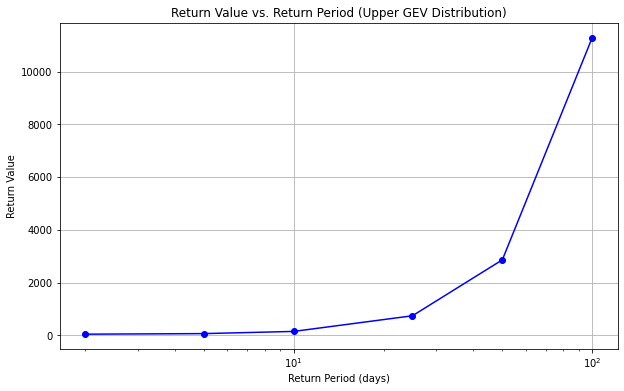

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


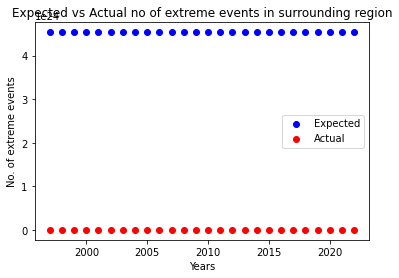

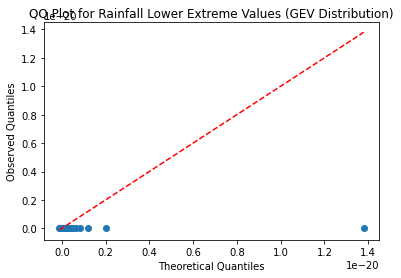

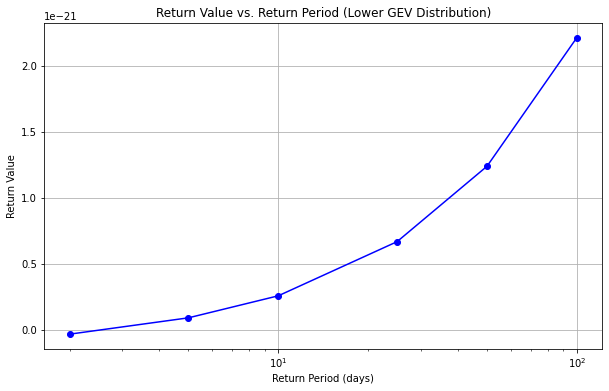

((20, 22), (86, 88))
142740


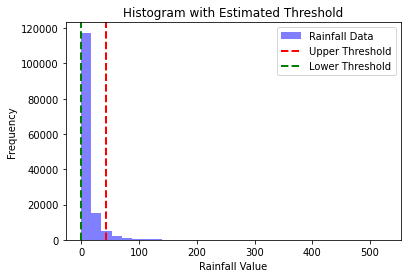

Estimated Upper Threshold: 42.46
Estimated Lower Threshold: 0.00


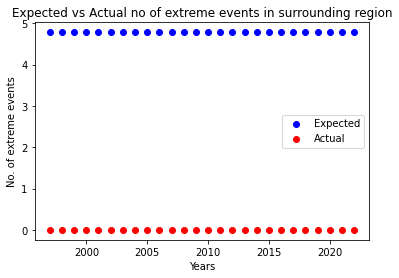

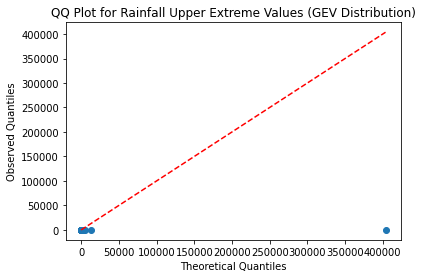

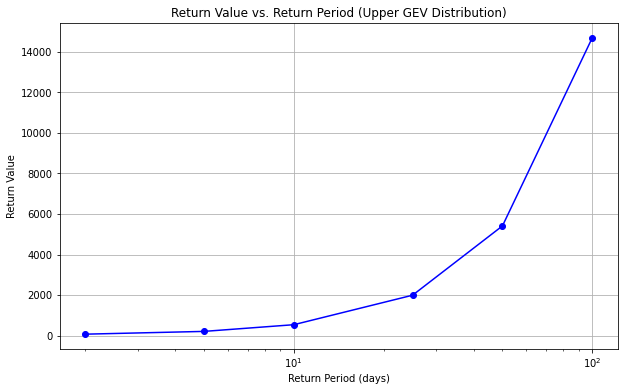

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


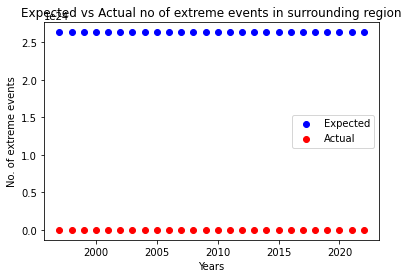

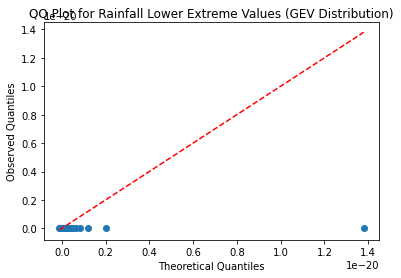

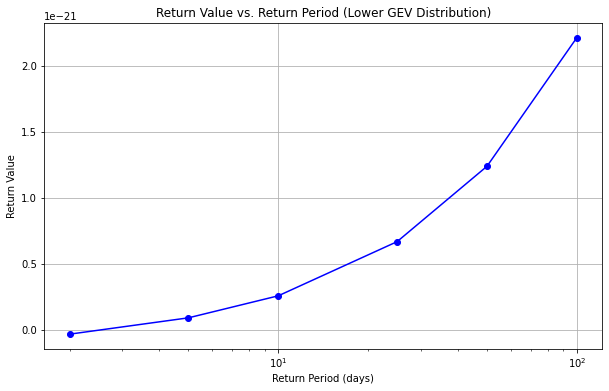

((20, 22), (88, 90))
31720


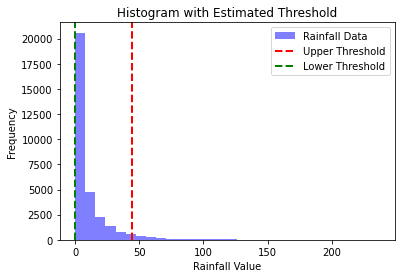

Estimated Upper Threshold: 44.20
Estimated Lower Threshold: 0.00


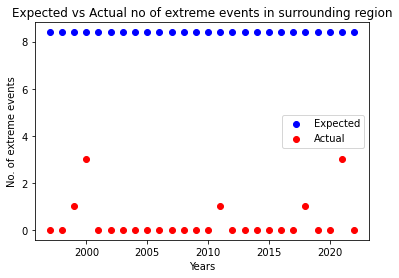

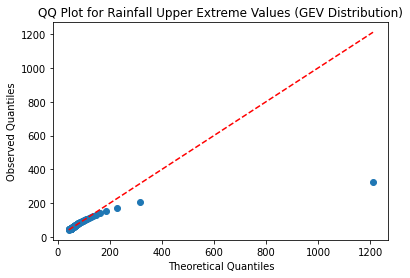

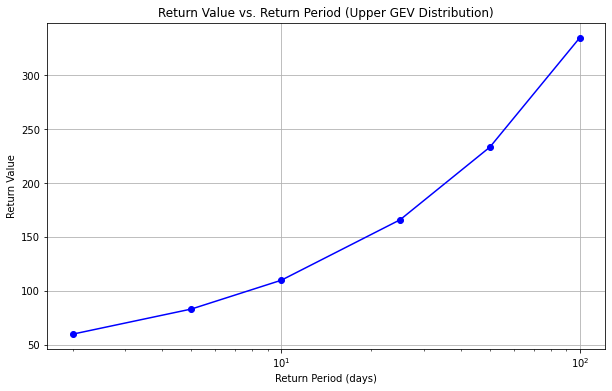

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


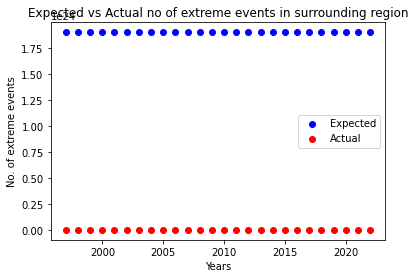

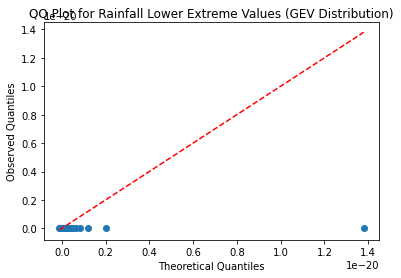

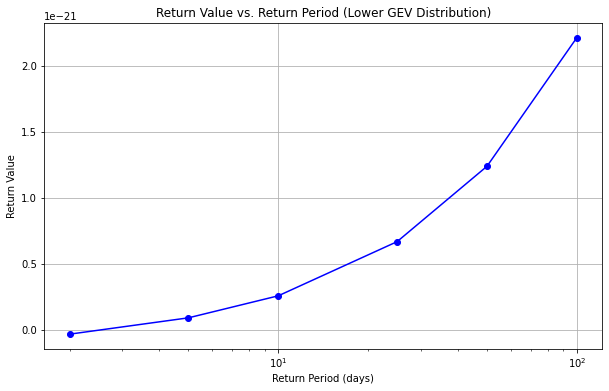

((20, 22), (90, 92))
((20, 22), (92, 94))
3172


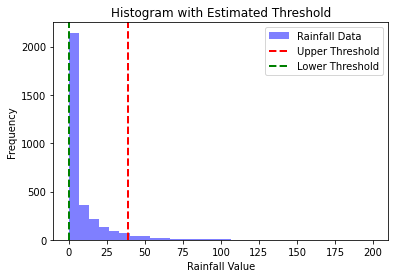

Estimated Upper Threshold: 39.01
Estimated Lower Threshold: 0.00


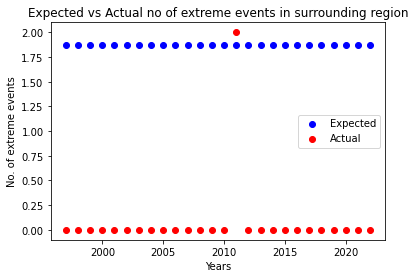

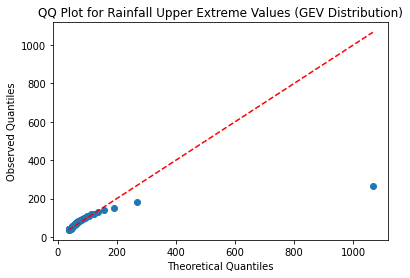

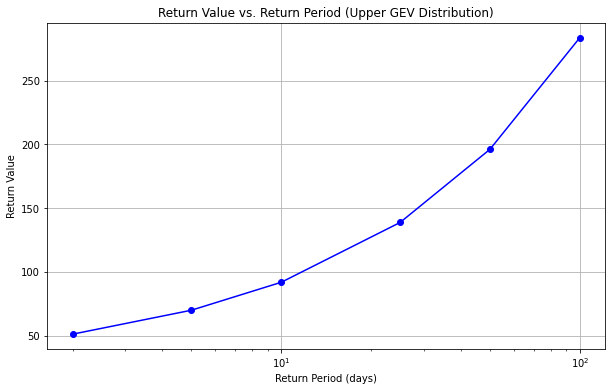

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


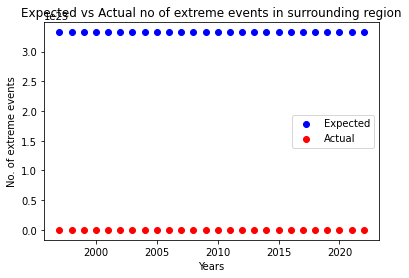

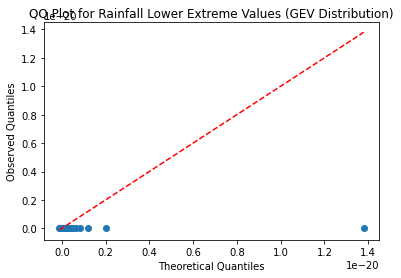

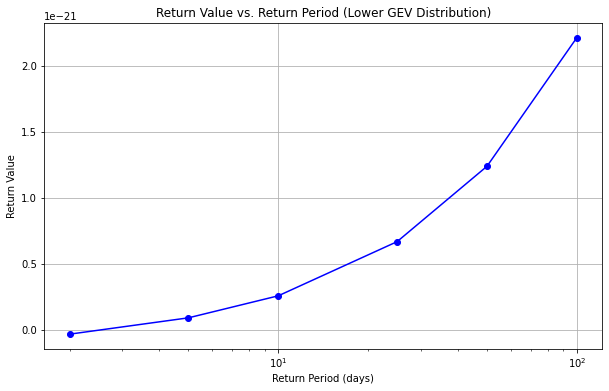

((20, 22), (94, 96))
((20, 22), (96, 98))
((20, 22), (98, 100))
((22, 24), (68, 70))
183976


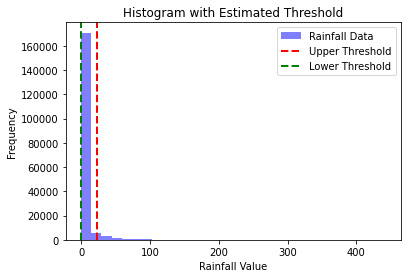

Estimated Upper Threshold: 23.29
Estimated Lower Threshold: 0.00


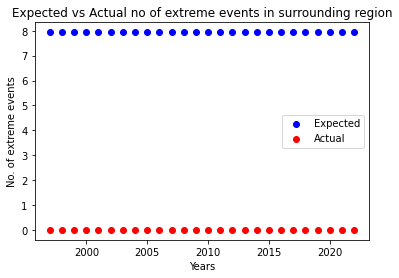

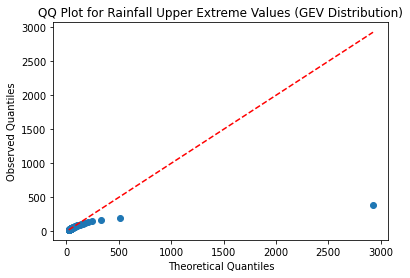

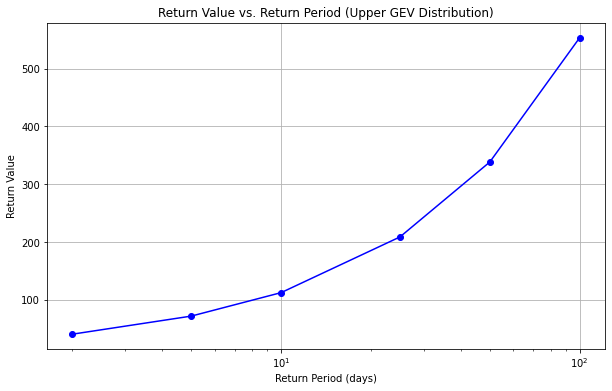

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


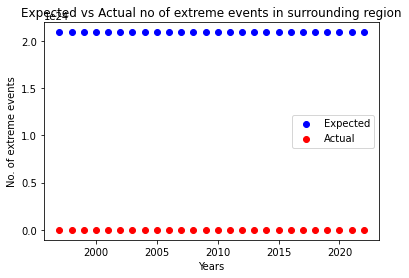

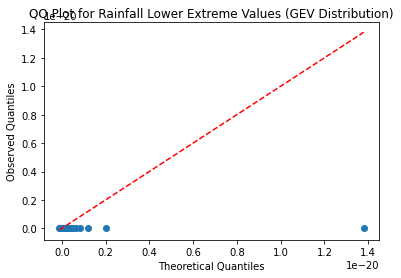

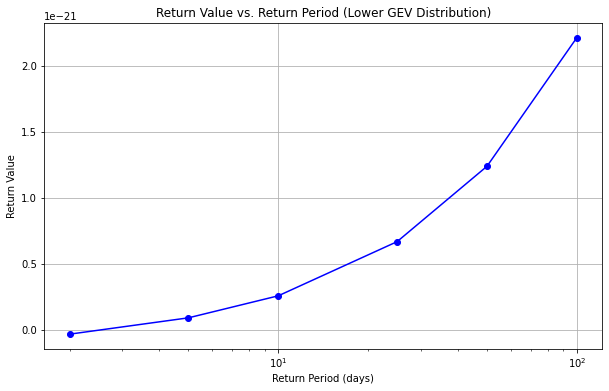

((22, 24), (70, 72))
256932


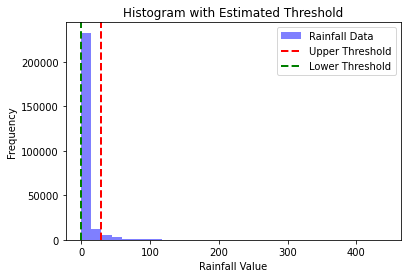

Estimated Upper Threshold: 28.46
Estimated Lower Threshold: 0.00


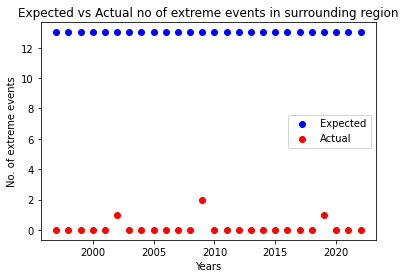

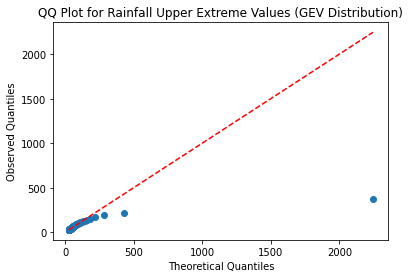

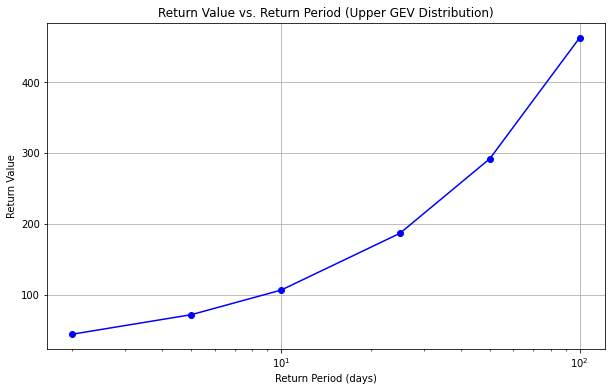

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


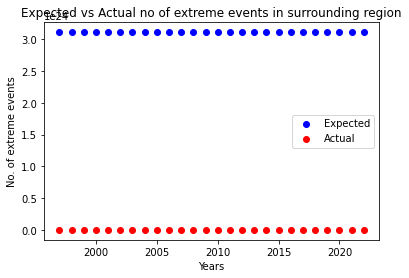

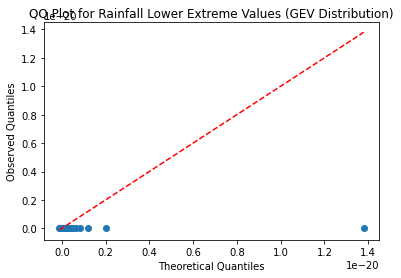

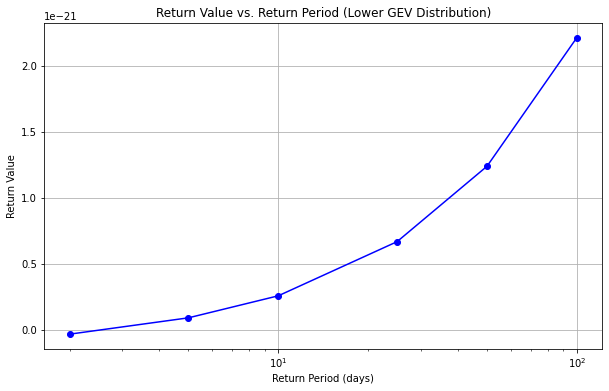

((22, 24), (72, 74))
256932


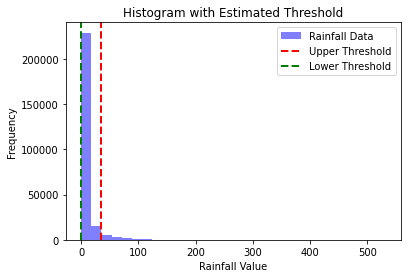

Estimated Upper Threshold: 34.48
Estimated Lower Threshold: 0.00


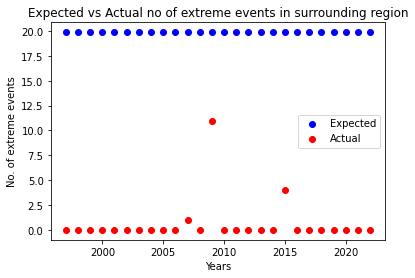

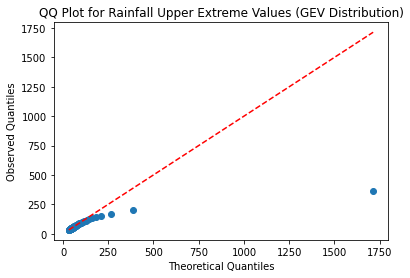

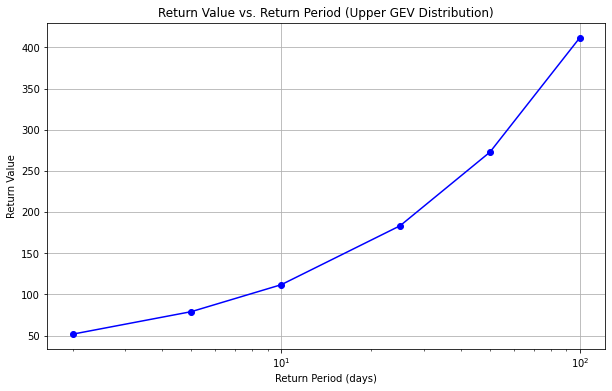

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


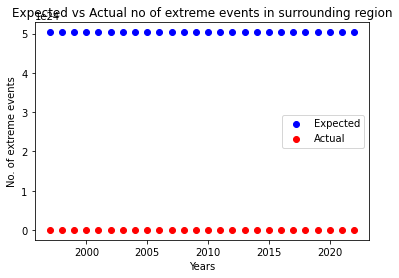

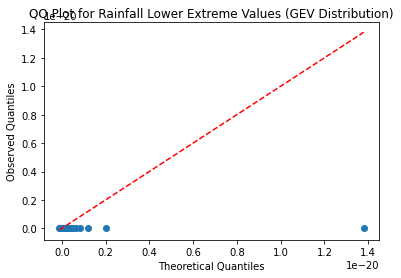

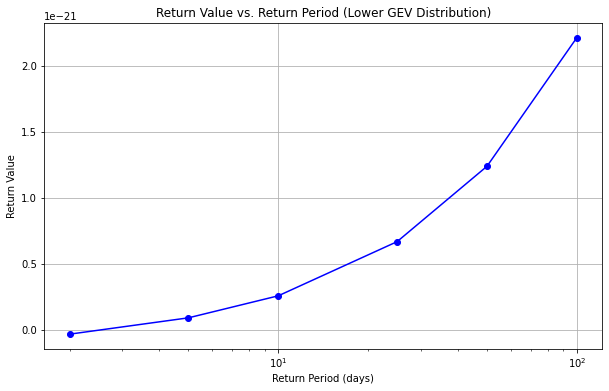

((22, 24), (74, 76))
256932


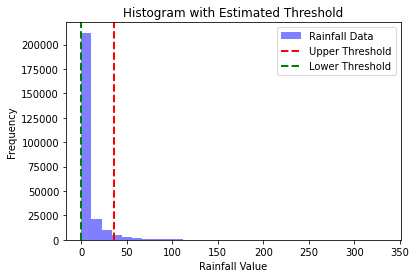

Estimated Upper Threshold: 35.59
Estimated Lower Threshold: 0.00


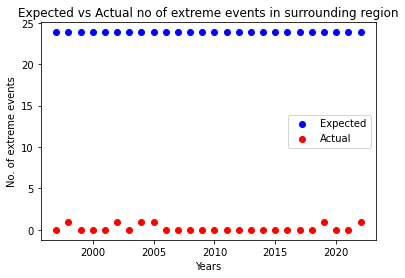

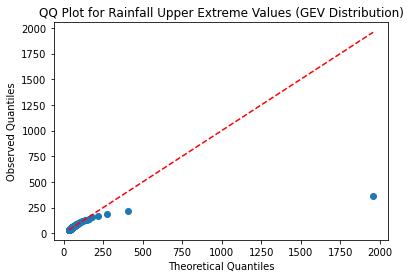

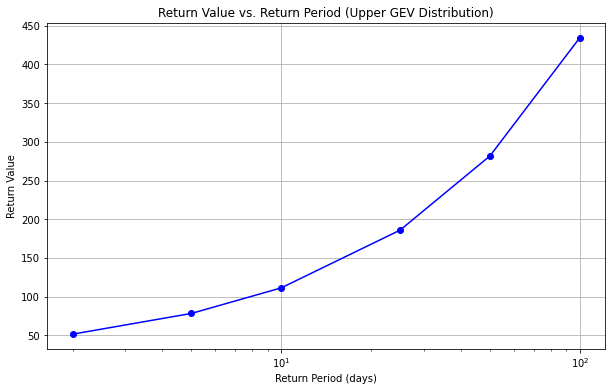

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


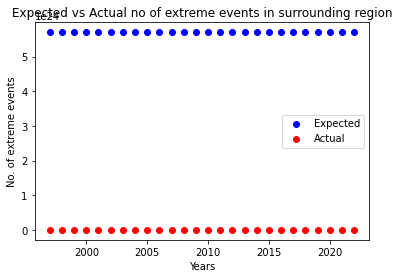

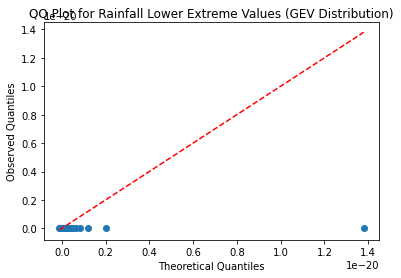

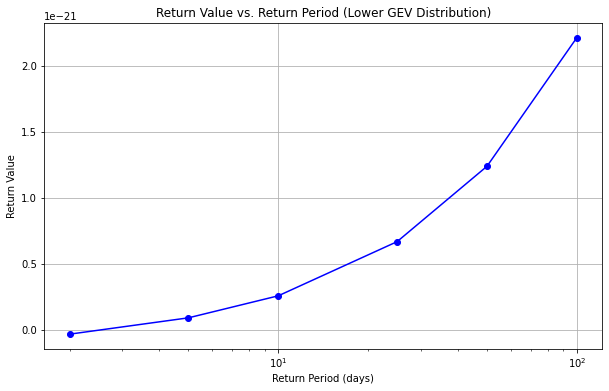

((22, 24), (76, 78))
256932


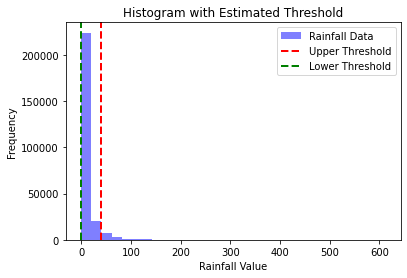

Estimated Upper Threshold: 40.71
Estimated Lower Threshold: 0.00


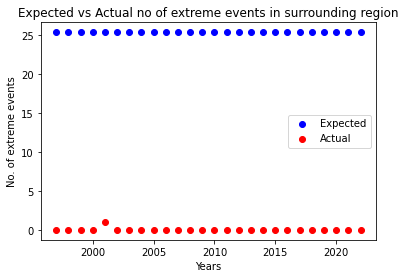

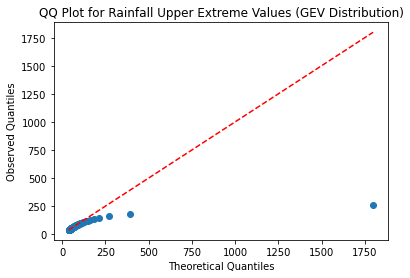

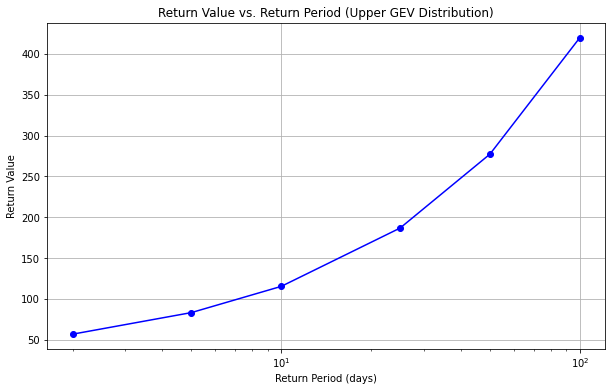

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


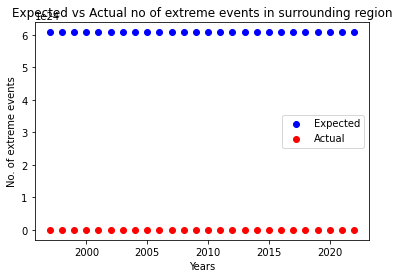

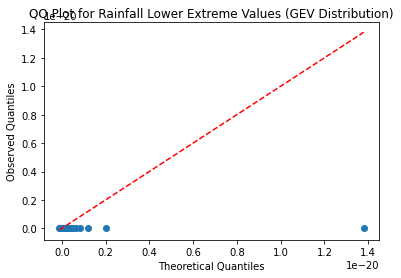

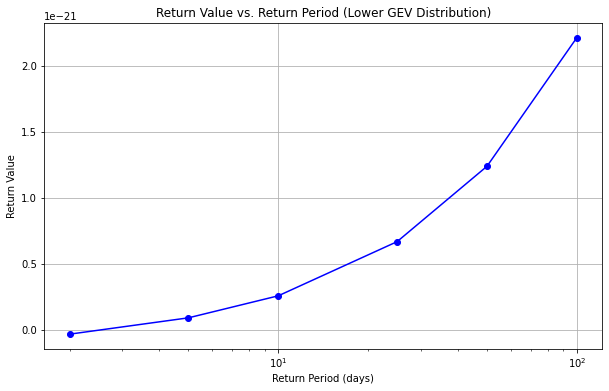

((22, 24), (78, 80))
256932


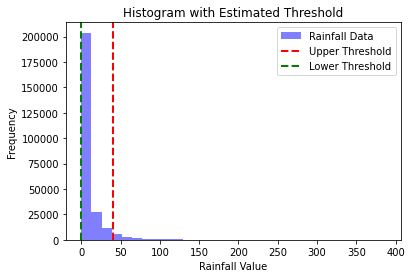

Estimated Upper Threshold: 40.78
Estimated Lower Threshold: 0.00


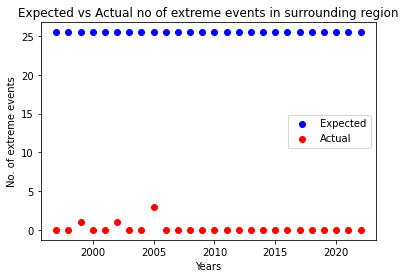

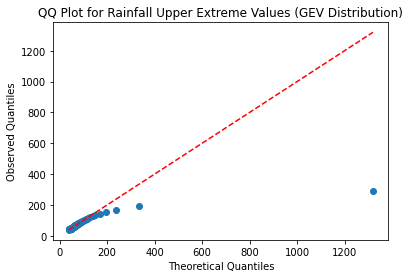

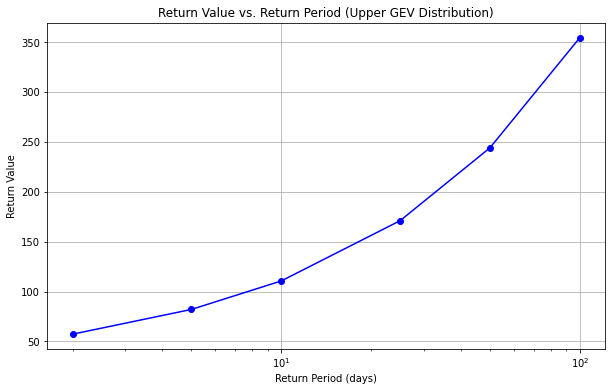

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


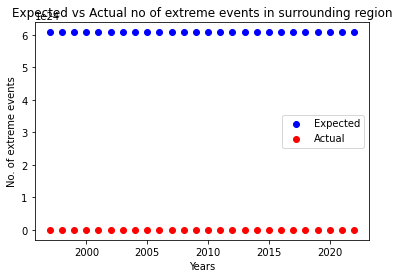

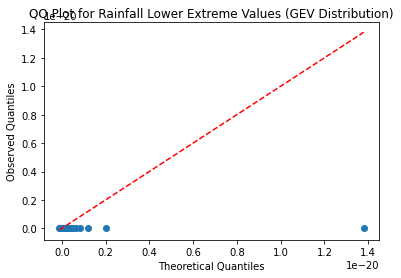

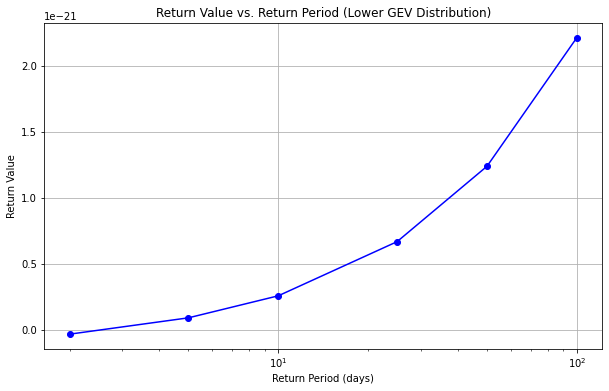

((22, 24), (80, 82))
256932


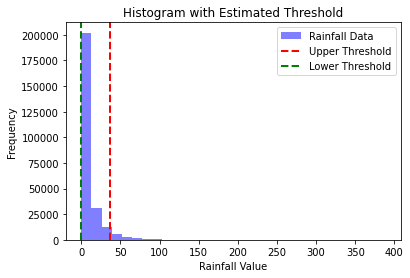

Estimated Upper Threshold: 37.14
Estimated Lower Threshold: 0.00


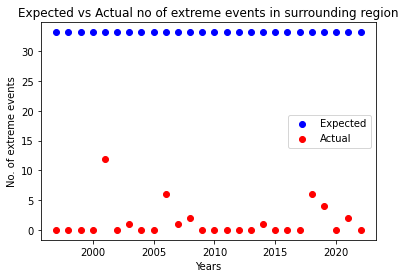

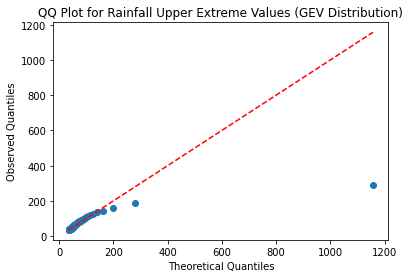

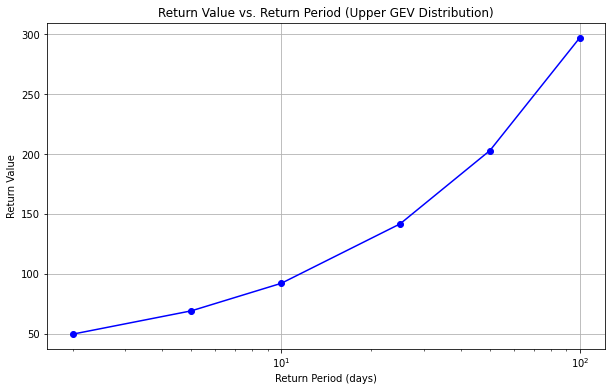

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


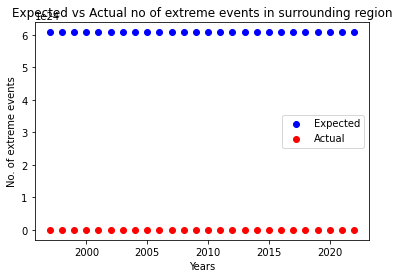

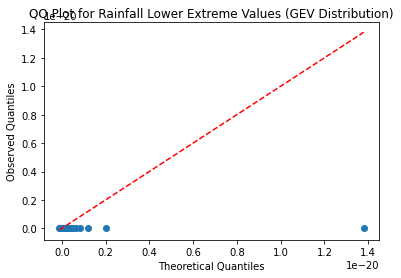

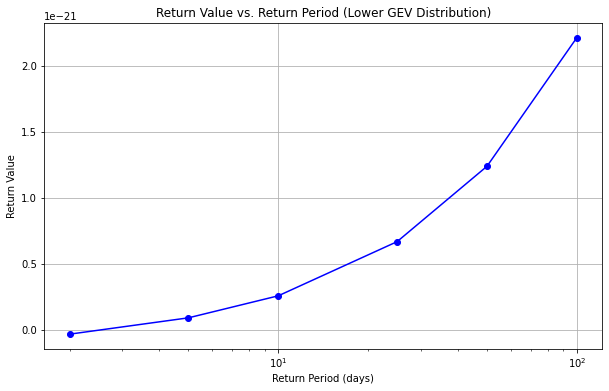

((22, 24), (82, 84))
256932


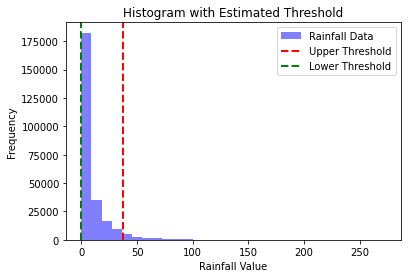

Estimated Upper Threshold: 37.12
Estimated Lower Threshold: 0.00


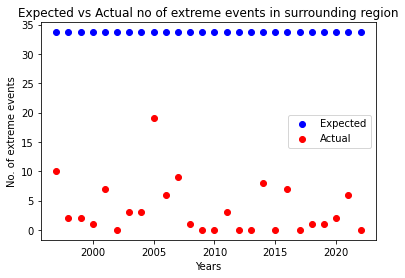

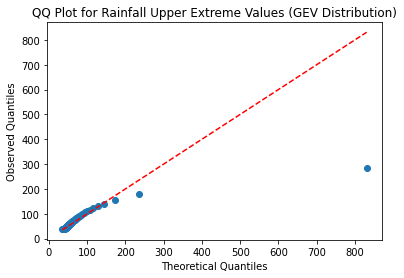

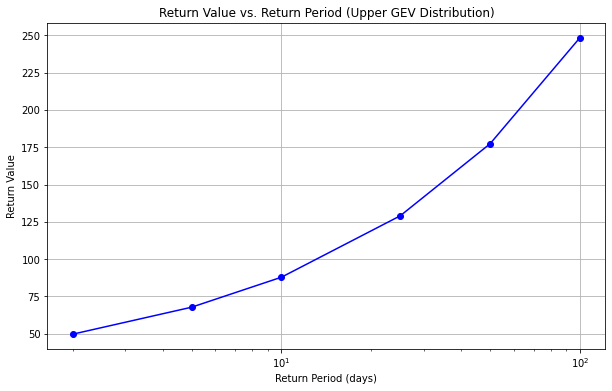

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


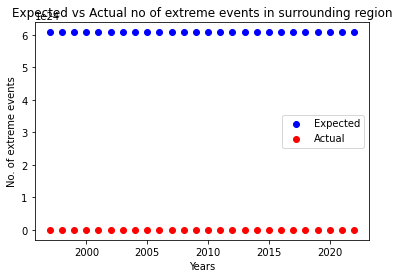

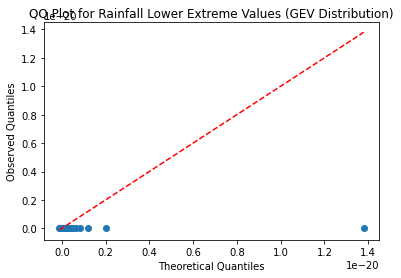

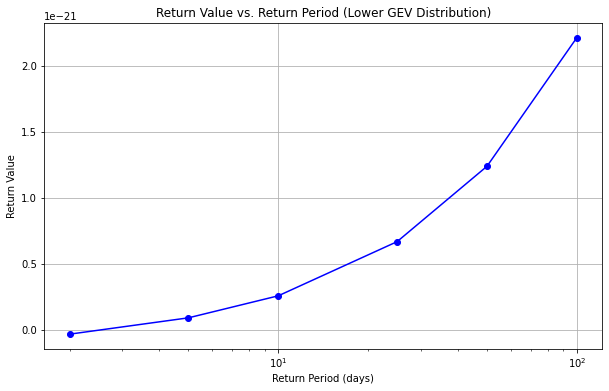

((22, 24), (84, 86))
256932


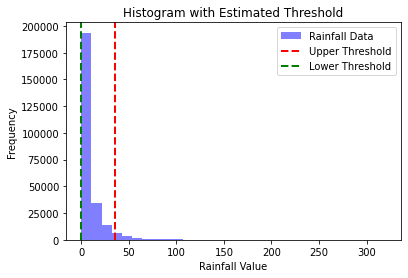

Estimated Upper Threshold: 35.09
Estimated Lower Threshold: 0.00


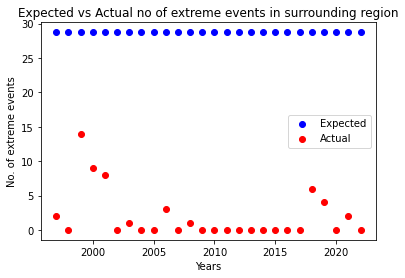

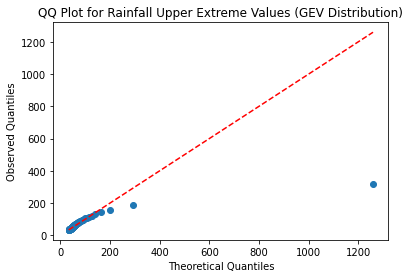

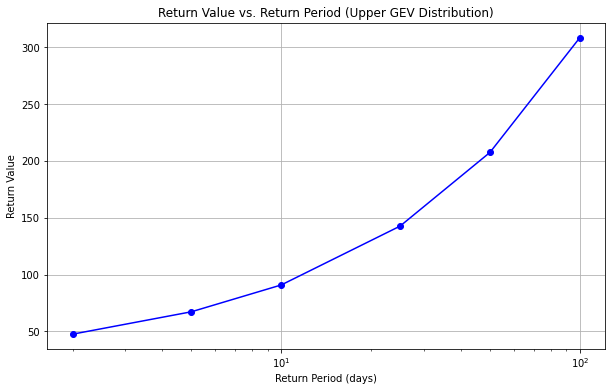

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


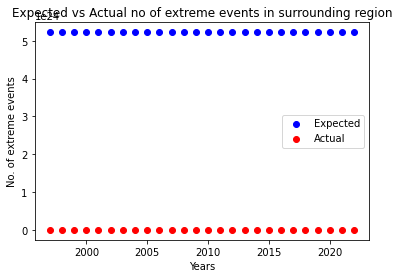

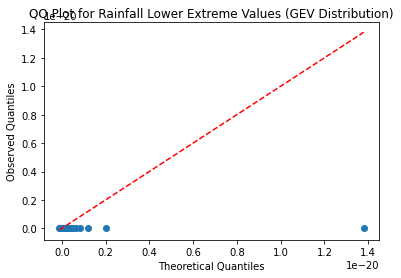

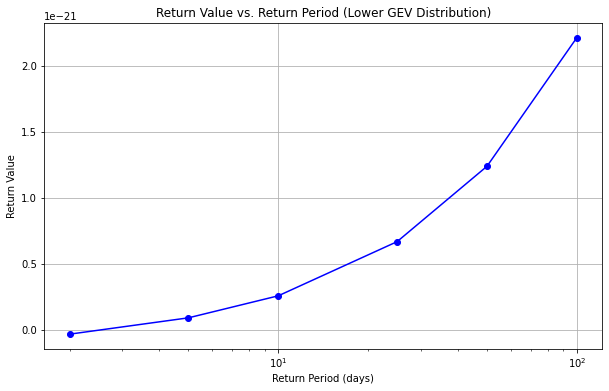

((22, 24), (86, 88))
256932


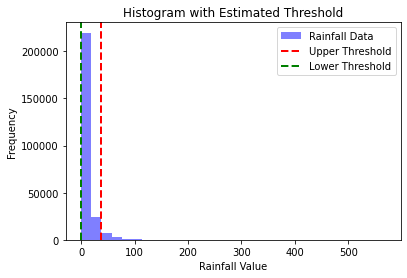

Estimated Upper Threshold: 37.37
Estimated Lower Threshold: 0.00


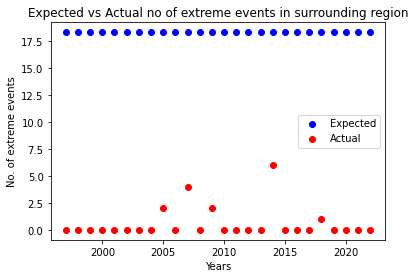

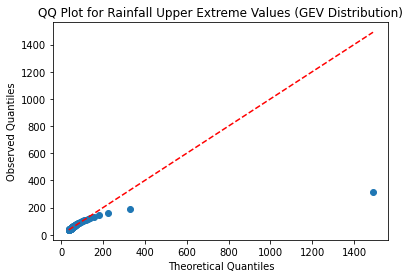

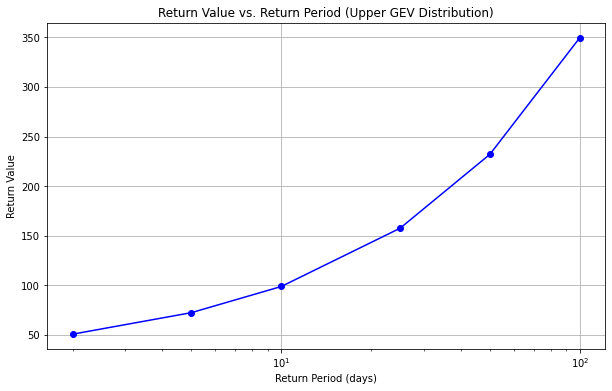

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


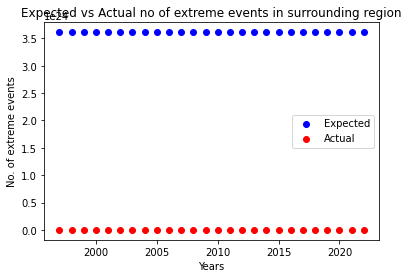

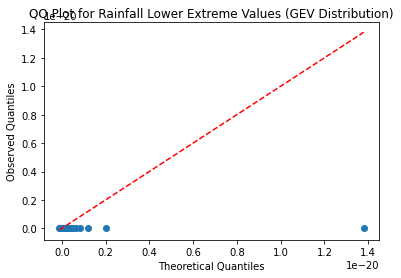

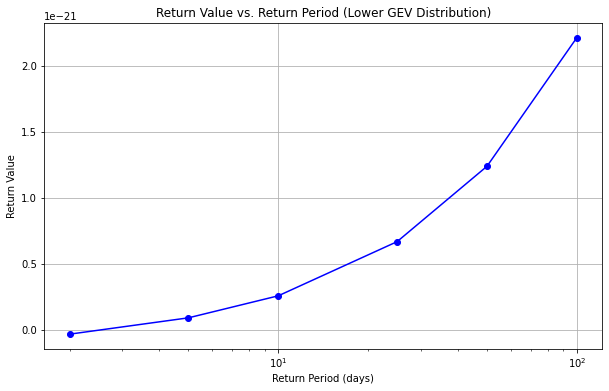

((22, 24), (88, 90))
120536


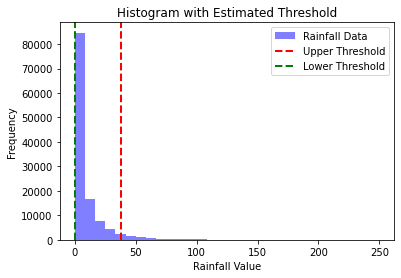

Estimated Upper Threshold: 37.53
Estimated Lower Threshold: 0.00


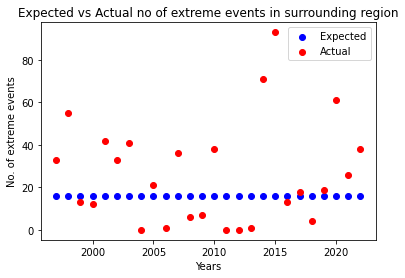

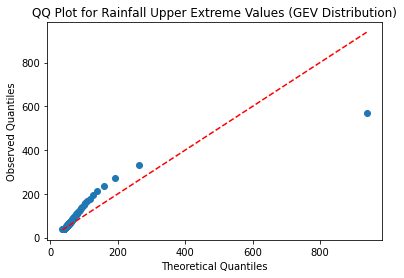

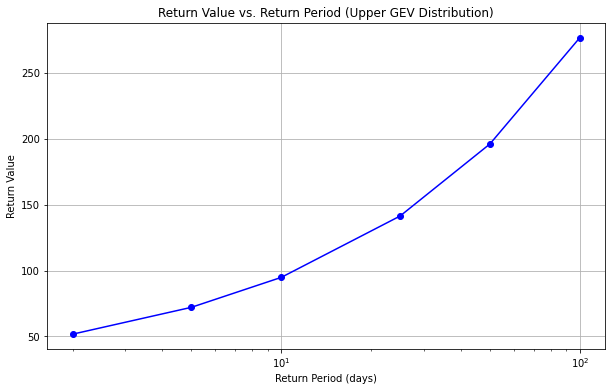

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


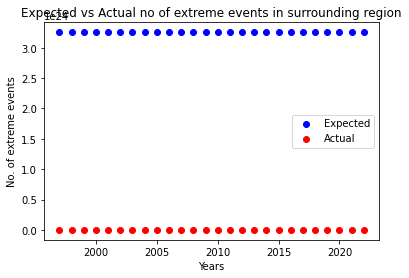

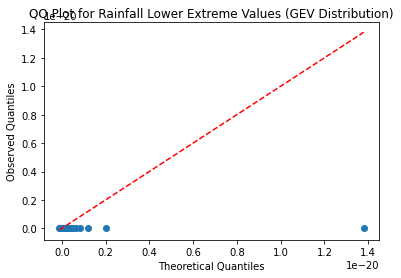

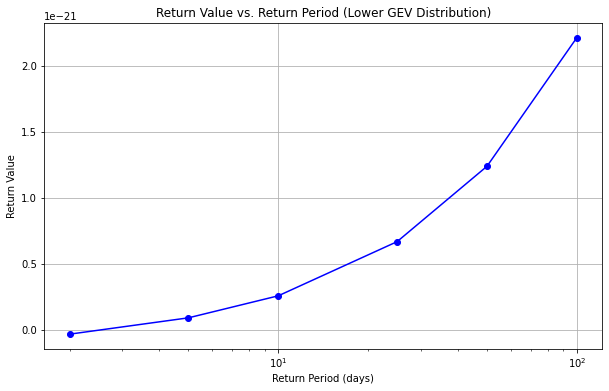

((22, 24), (90, 92))
50752


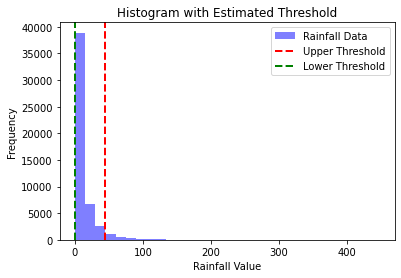

Estimated Upper Threshold: 44.51
Estimated Lower Threshold: 0.00


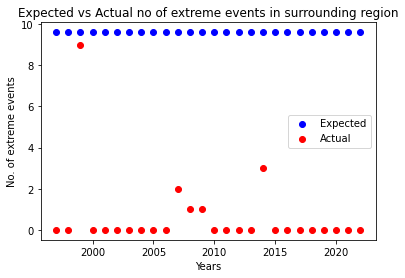

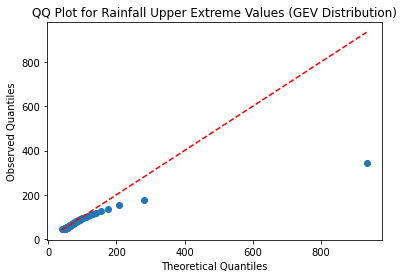

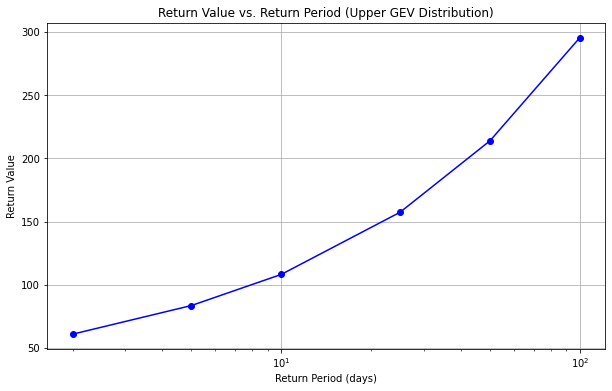

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


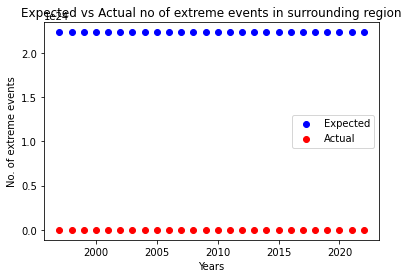

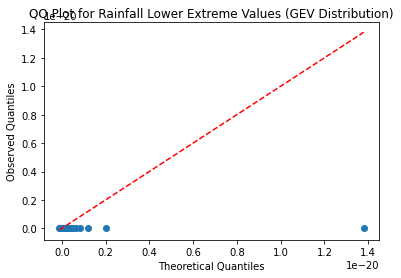

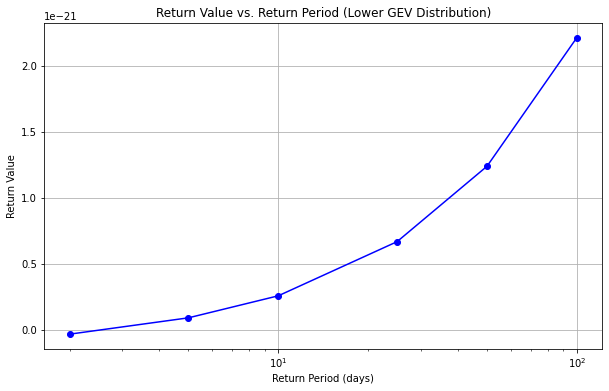

((22, 24), (92, 94))
120536


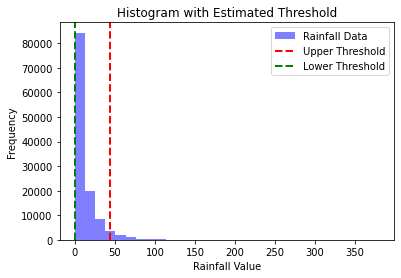

Estimated Upper Threshold: 43.53
Estimated Lower Threshold: 0.00


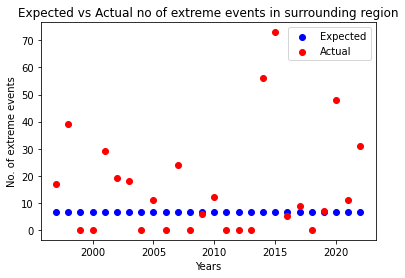

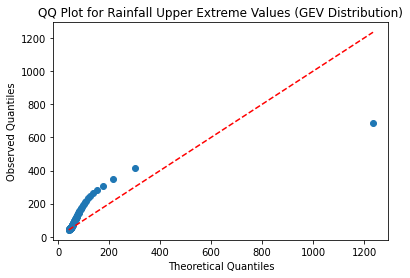

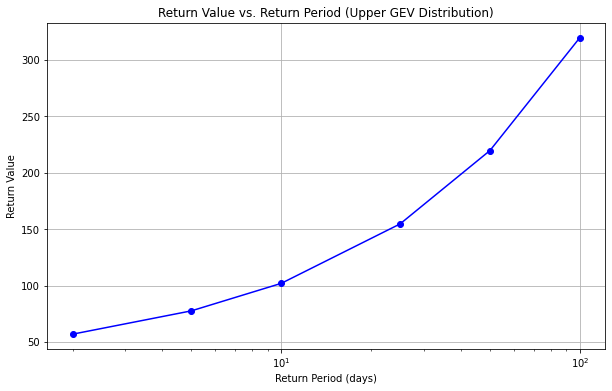

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


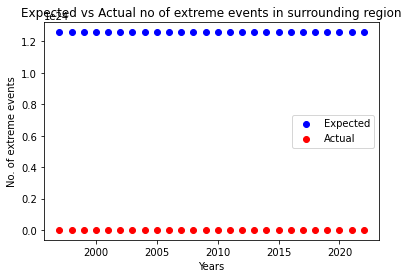

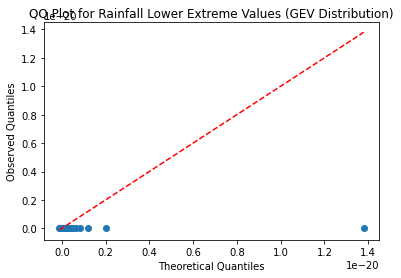

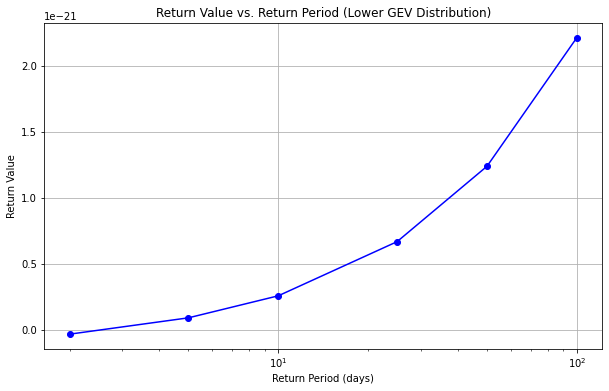

((22, 24), (94, 96))
3172


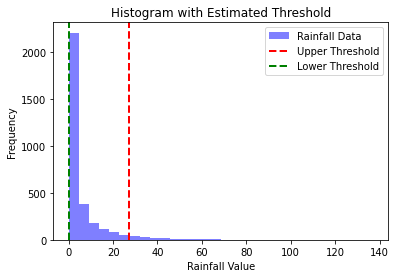

Estimated Upper Threshold: 27.18
Estimated Lower Threshold: 0.00


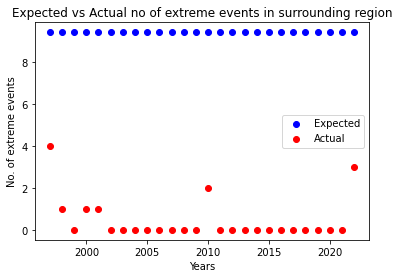

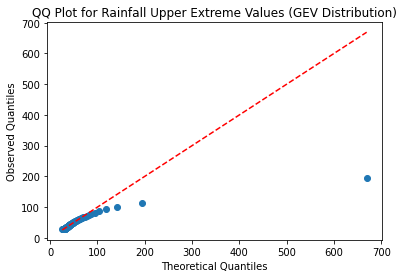

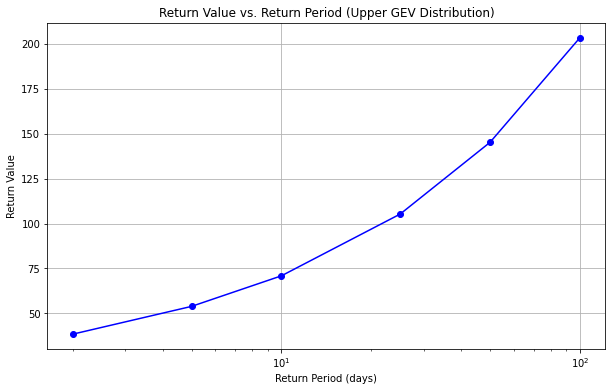

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


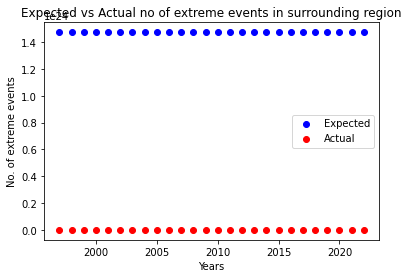

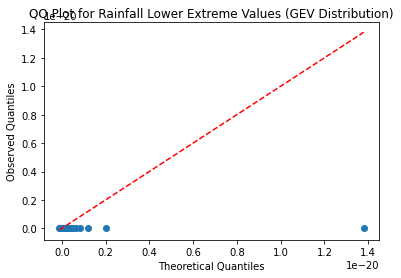

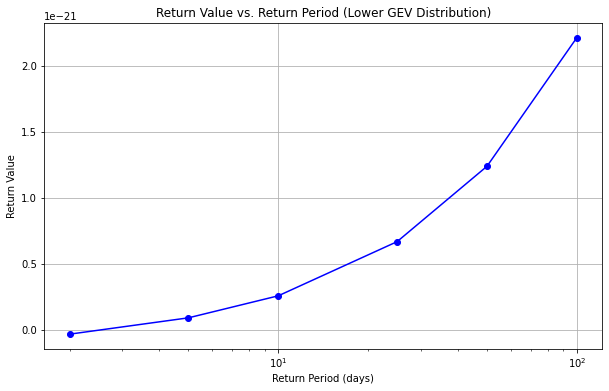

((22, 24), (96, 98))
((22, 24), (98, 100))
((24, 26), (68, 70))
63440


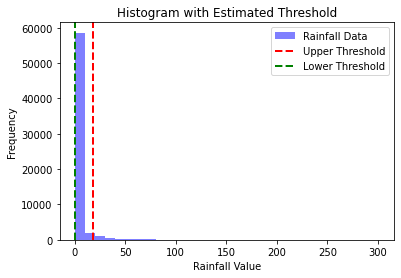

Estimated Upper Threshold: 17.93
Estimated Lower Threshold: 0.00


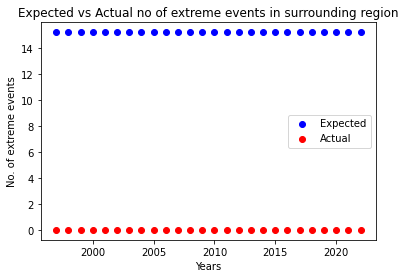

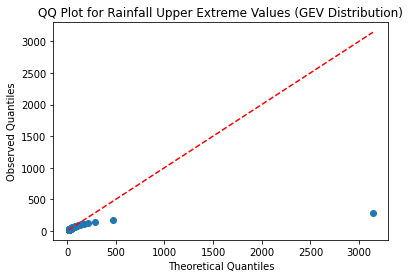

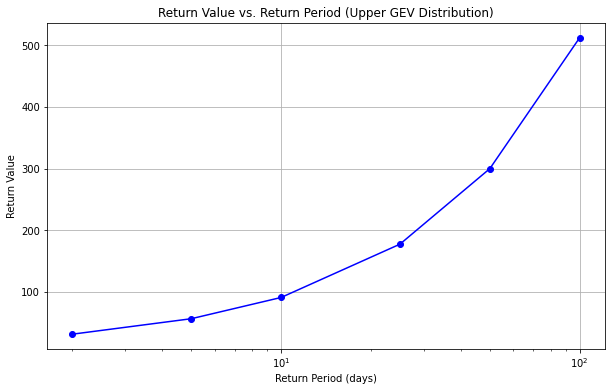

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


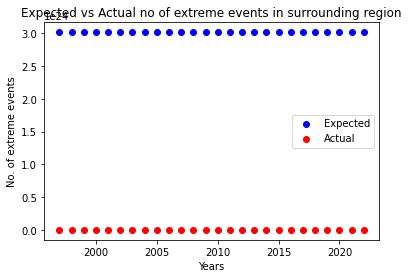

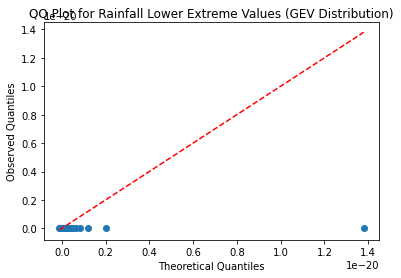

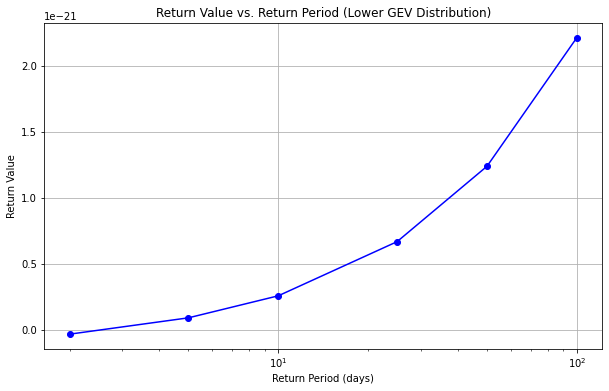

((24, 26), (70, 72))
215696


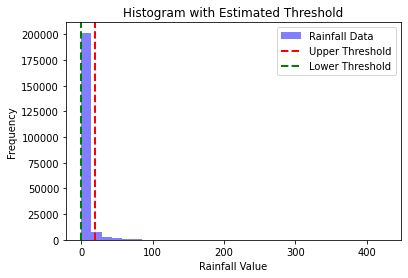

Estimated Upper Threshold: 19.25
Estimated Lower Threshold: 0.00


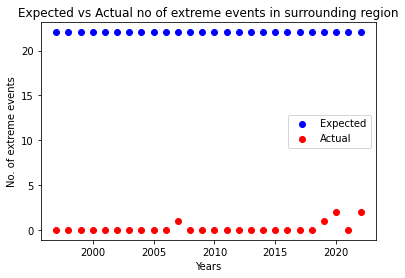

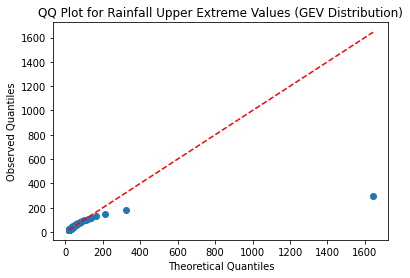

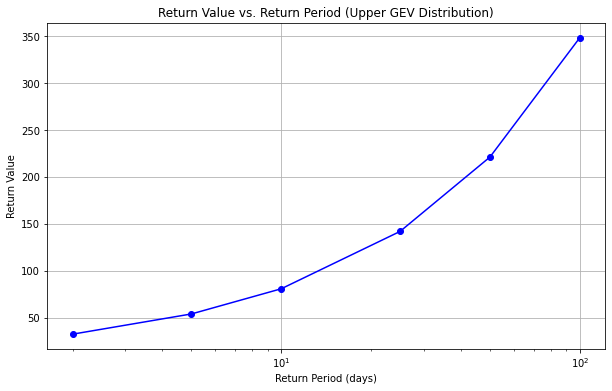

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


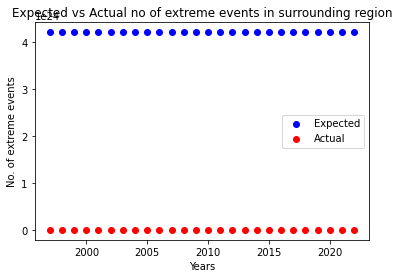

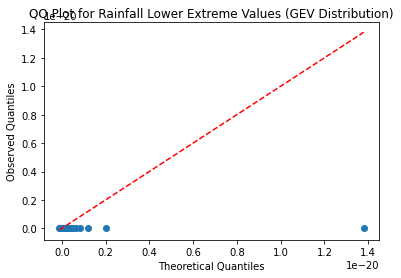

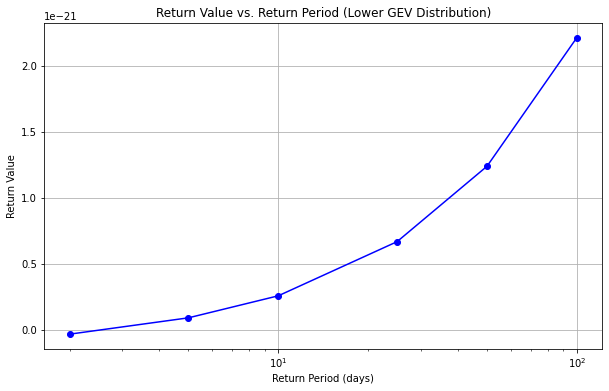

((24, 26), (72, 74))
256932


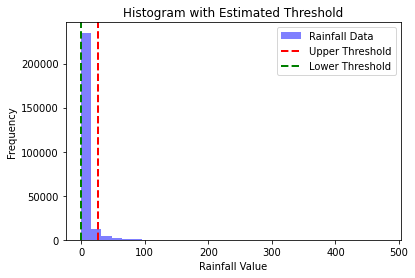

Estimated Upper Threshold: 25.75
Estimated Lower Threshold: 0.00


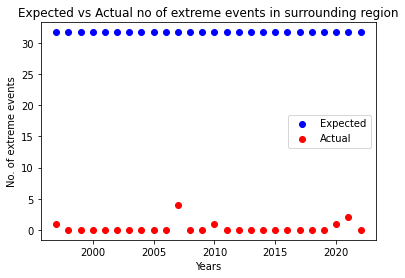

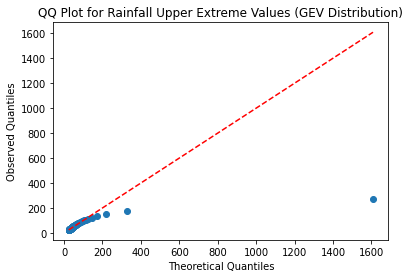

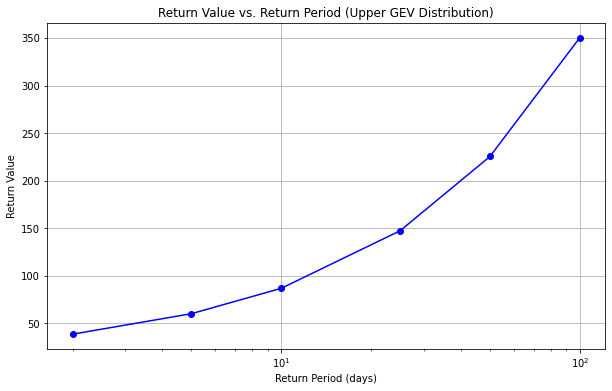

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


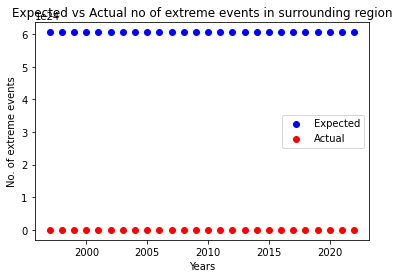

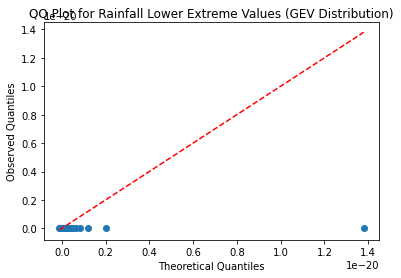

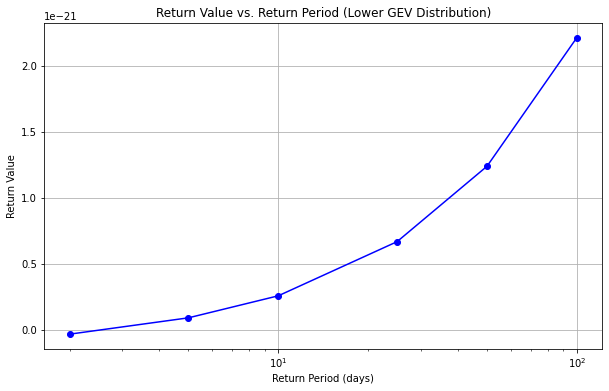

((24, 26), (74, 76))
256932


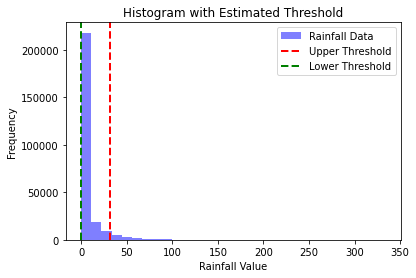

Estimated Upper Threshold: 31.28
Estimated Lower Threshold: 0.00


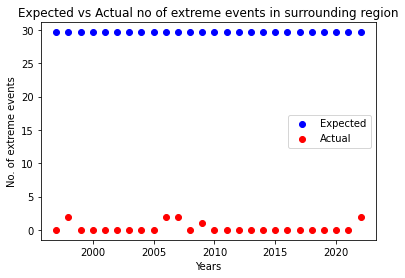

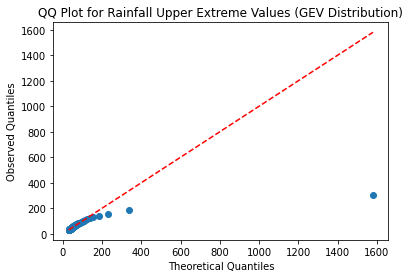

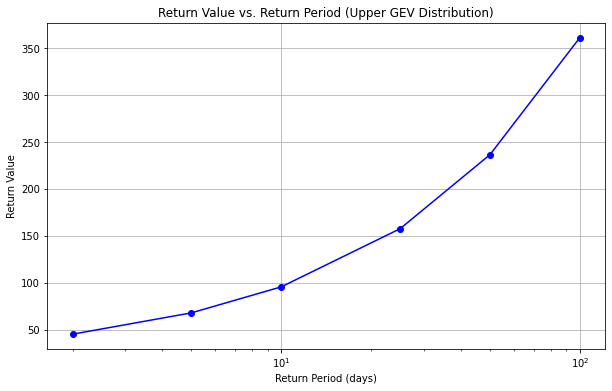

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


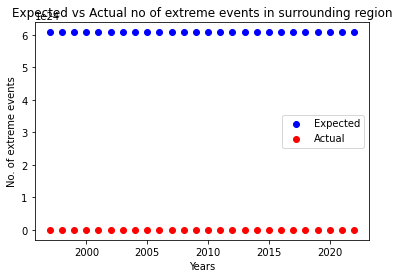

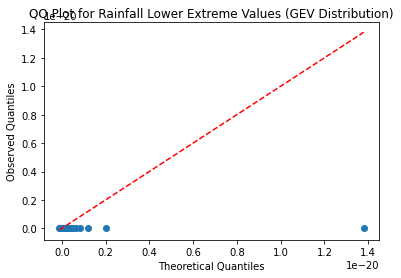

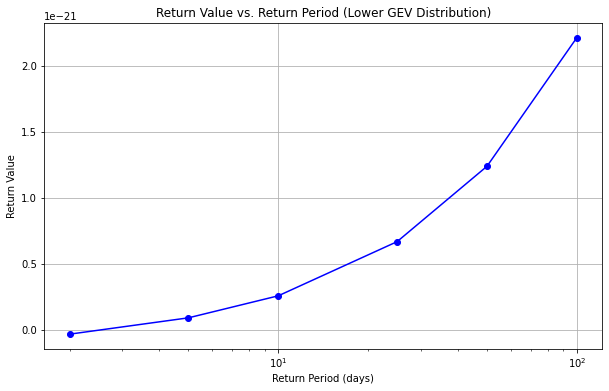

((24, 26), (76, 78))
256932


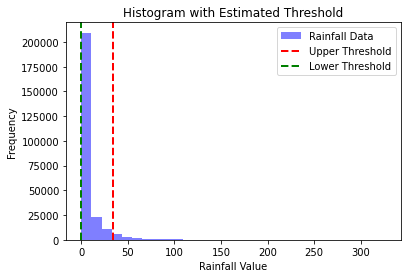

Estimated Upper Threshold: 34.18
Estimated Lower Threshold: 0.00


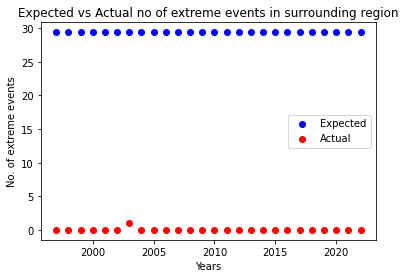

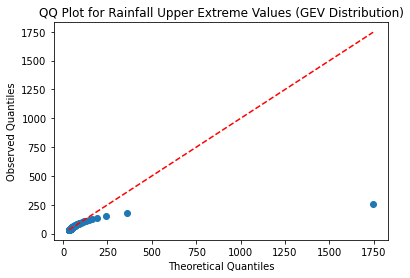

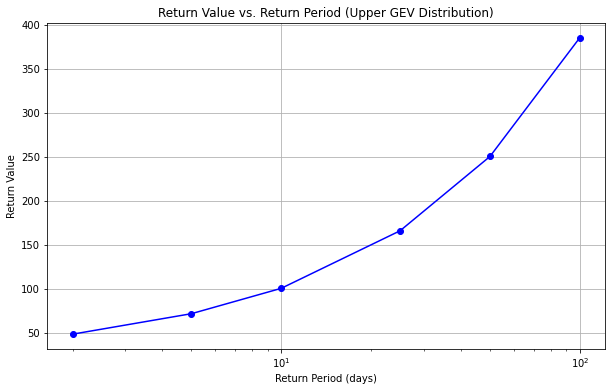

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


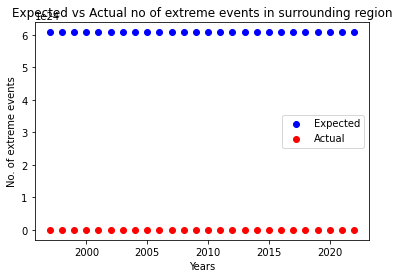

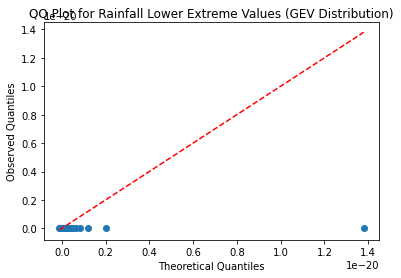

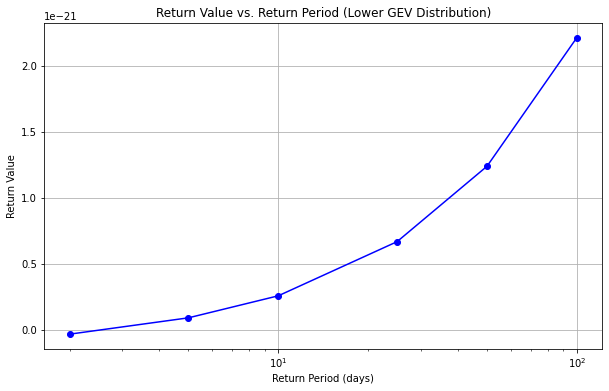

((24, 26), (78, 80))
256932


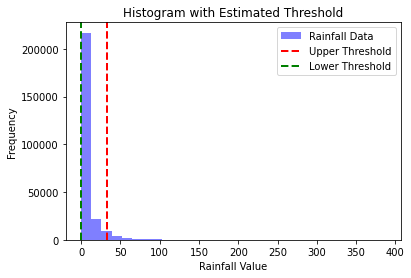

Estimated Upper Threshold: 32.61
Estimated Lower Threshold: 0.00


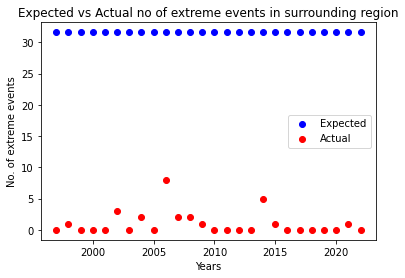

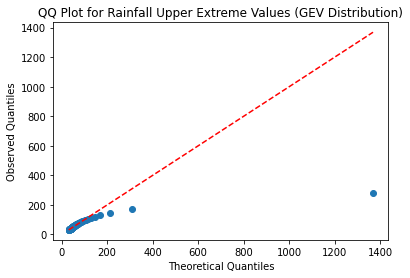

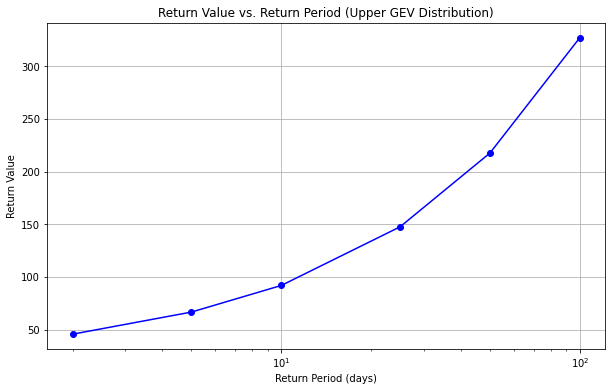

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


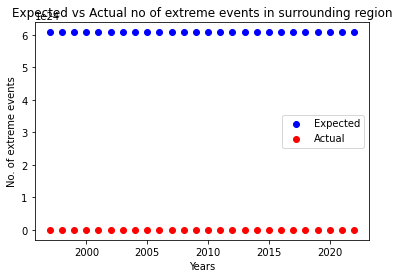

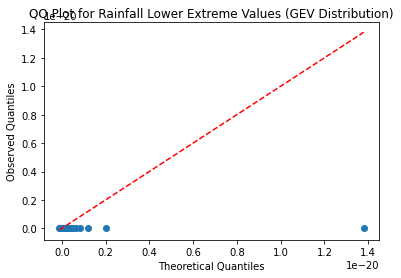

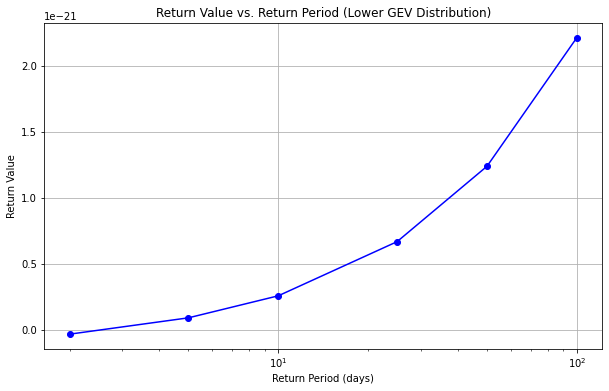

((24, 26), (80, 82))
256932


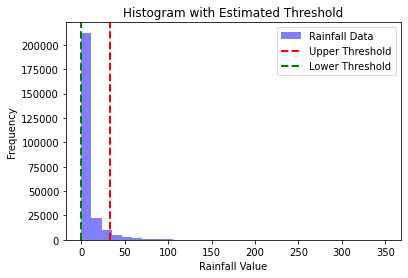

Estimated Upper Threshold: 33.31
Estimated Lower Threshold: 0.00


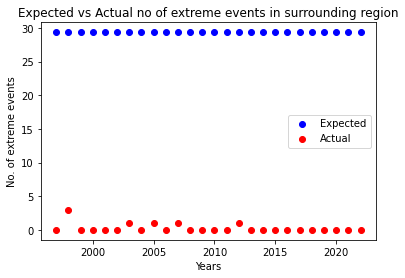

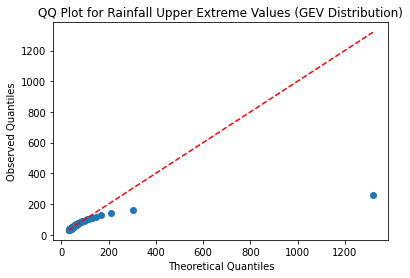

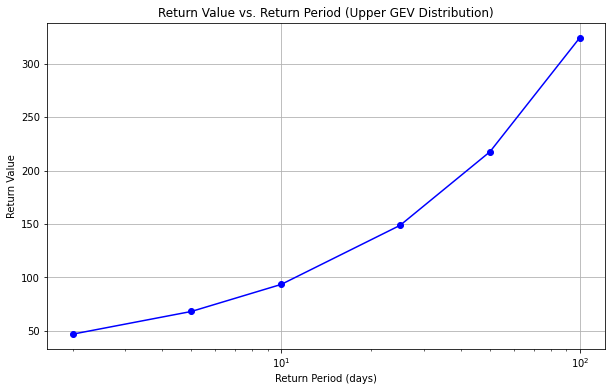

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


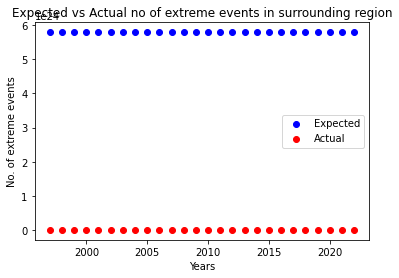

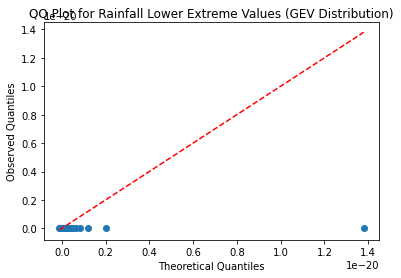

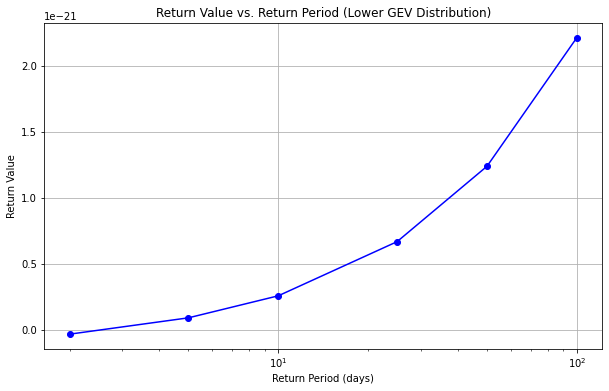

((24, 26), (82, 84))
256932


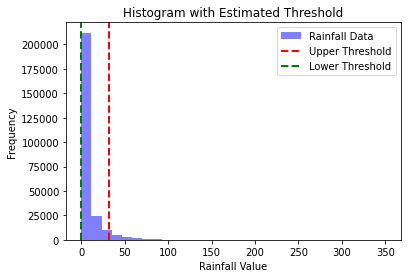

Estimated Upper Threshold: 31.82
Estimated Lower Threshold: 0.00


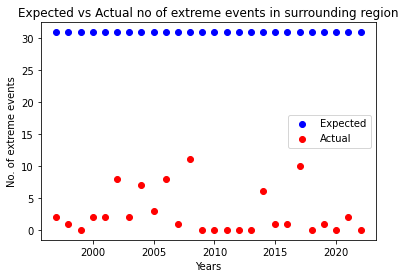

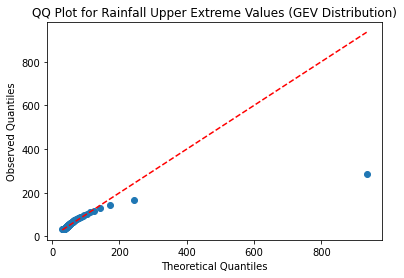

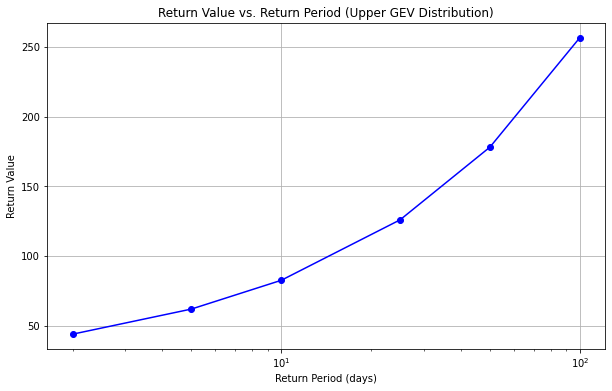

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


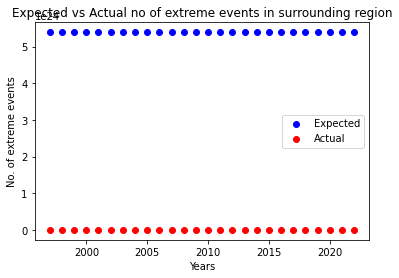

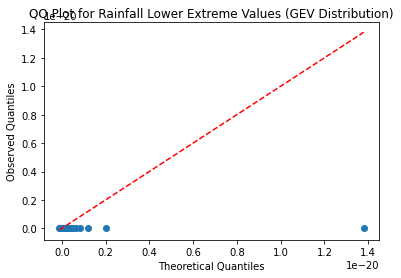

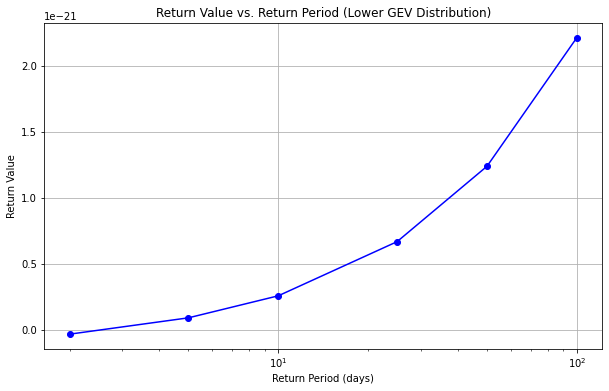

((24, 26), (84, 86))
256932


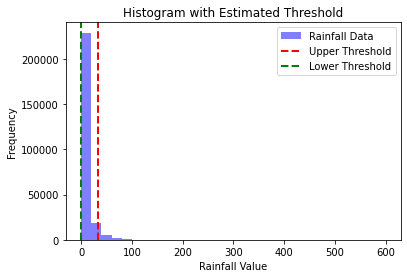

Estimated Upper Threshold: 33.59
Estimated Lower Threshold: 0.00


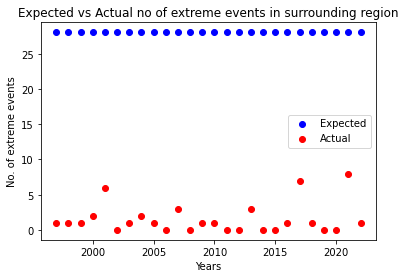

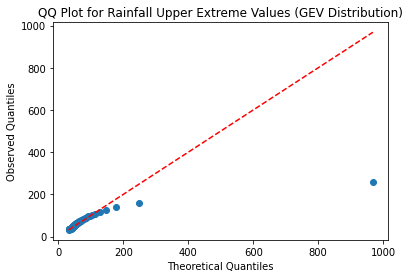

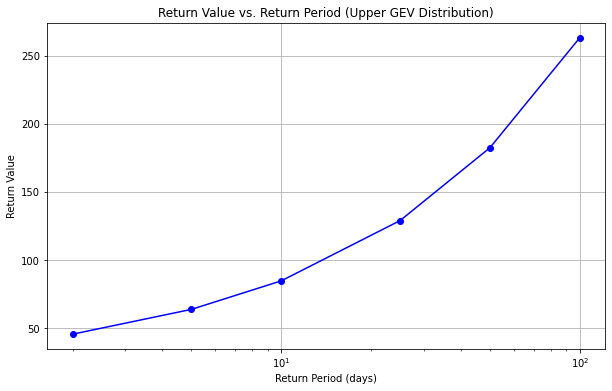

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


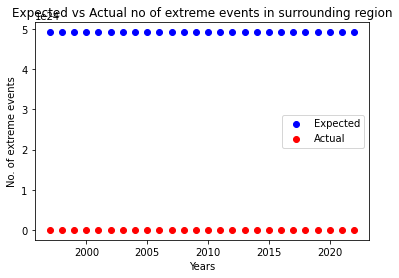

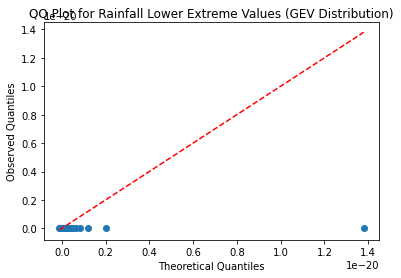

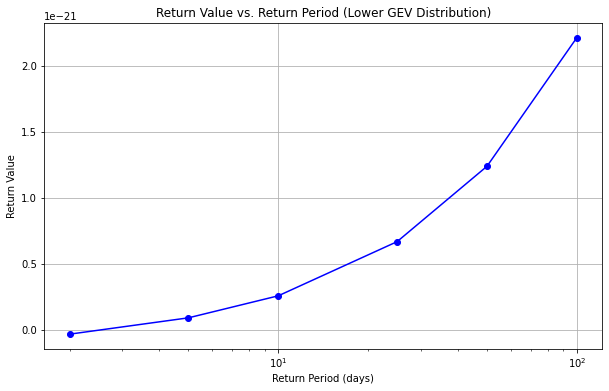

((24, 26), (86, 88))
256932


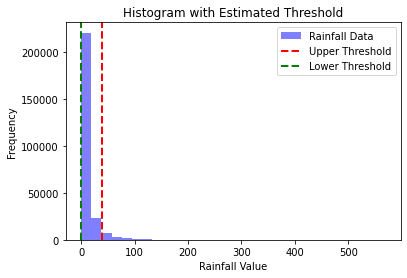

Estimated Upper Threshold: 38.73
Estimated Lower Threshold: 0.00


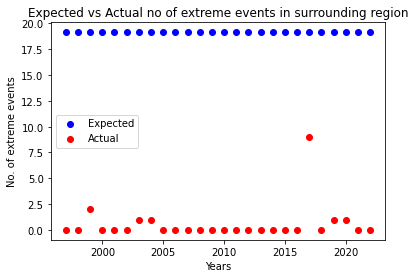

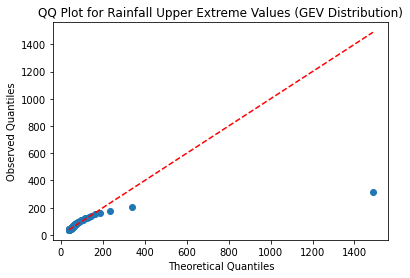

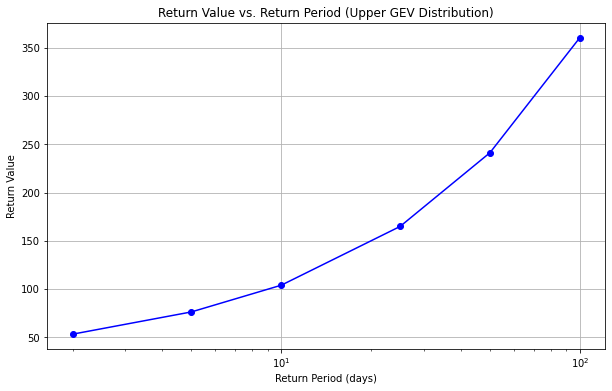

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


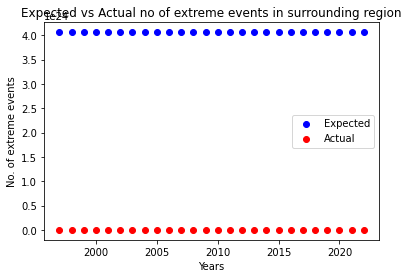

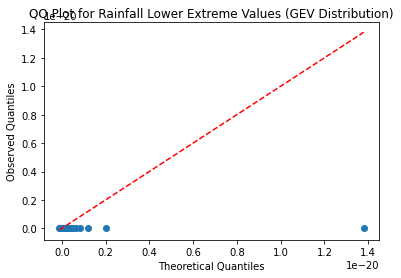

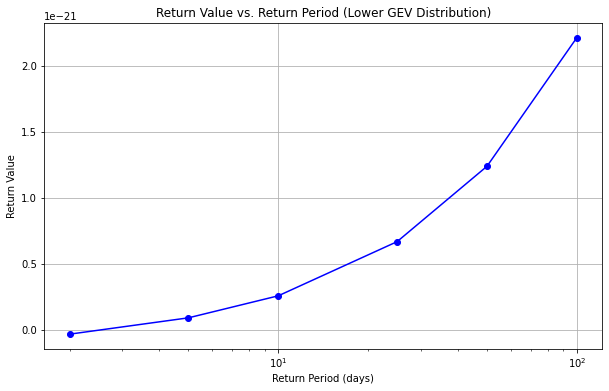

((24, 26), (88, 90))
98332


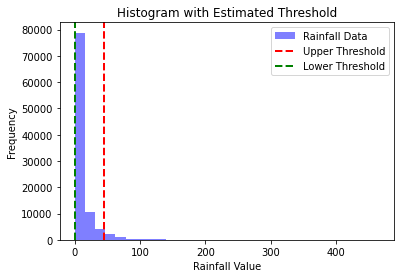

Estimated Upper Threshold: 44.63
Estimated Lower Threshold: 0.00


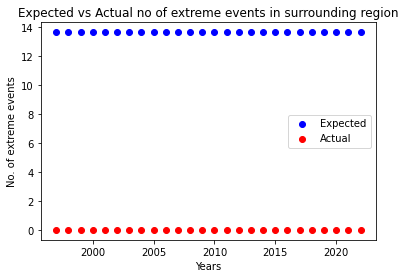

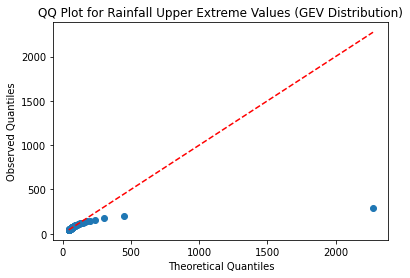

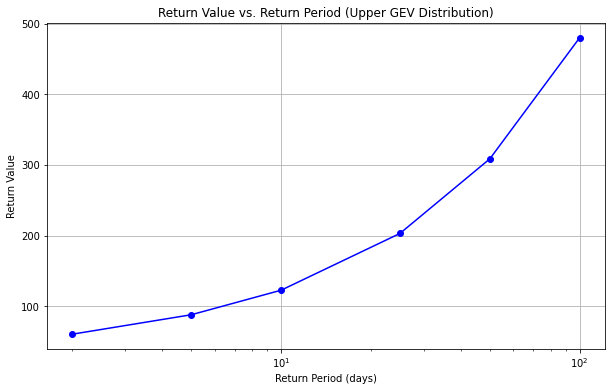

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


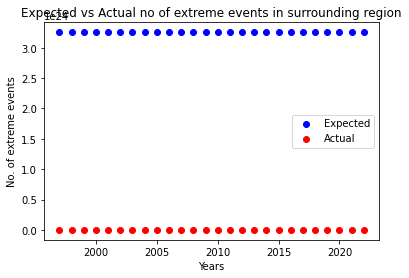

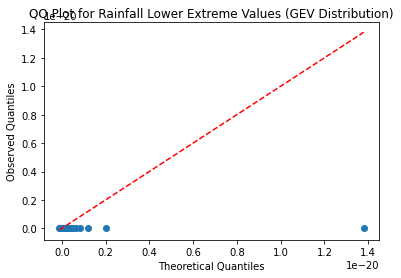

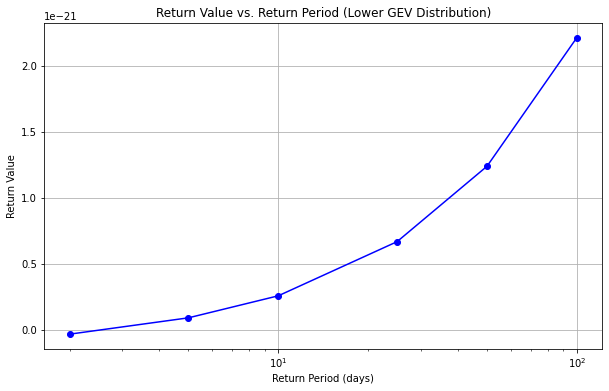

((24, 26), (90, 92))
142740


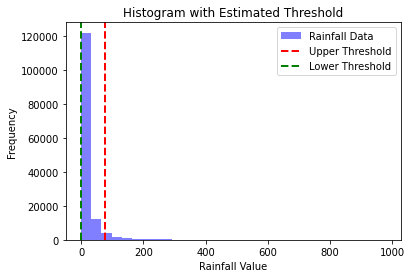

Estimated Upper Threshold: 76.39
Estimated Lower Threshold: 0.00


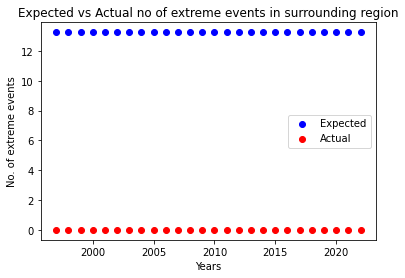

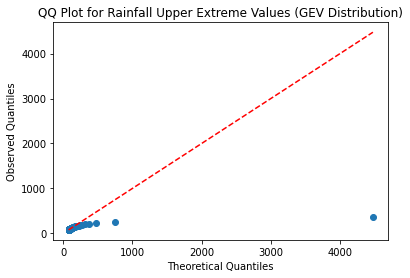

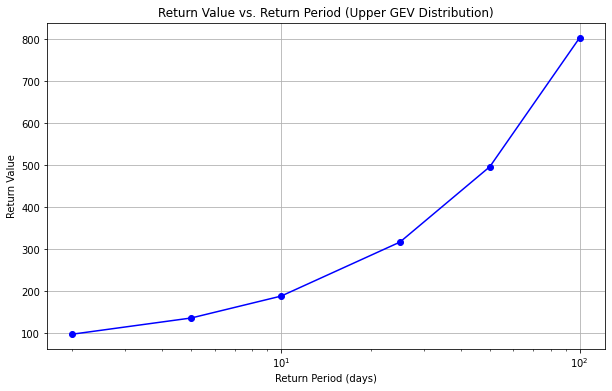

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


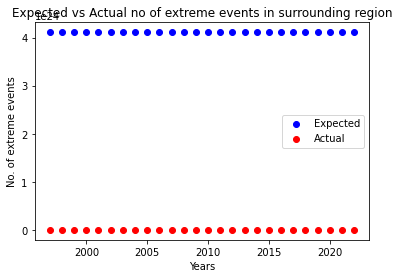

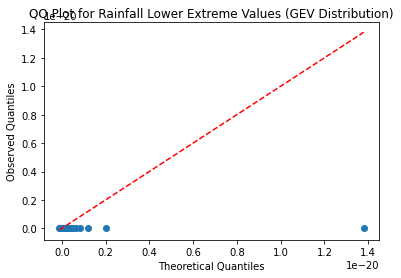

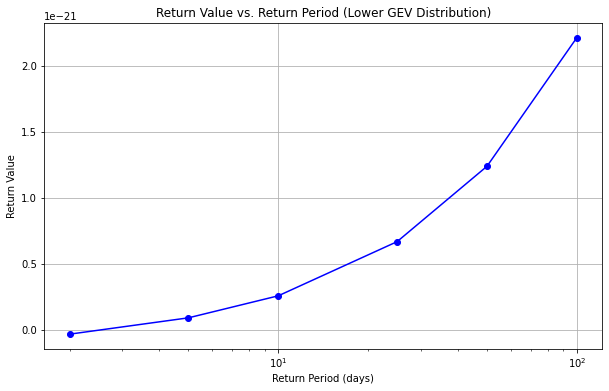

((24, 26), (92, 94))
250588


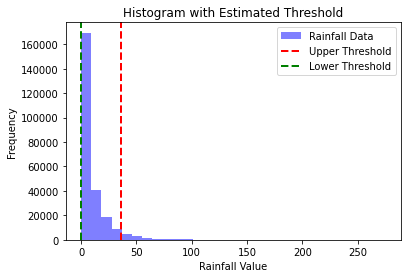

Estimated Upper Threshold: 36.16
Estimated Lower Threshold: 0.00


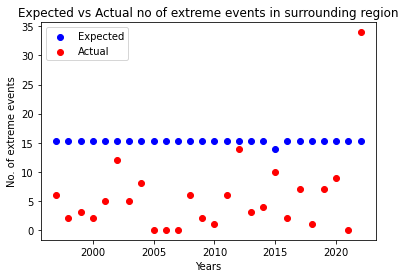

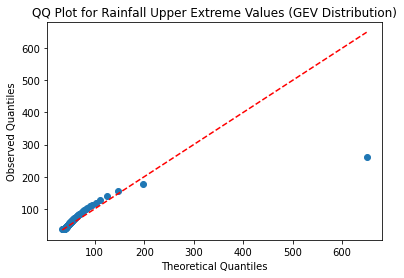

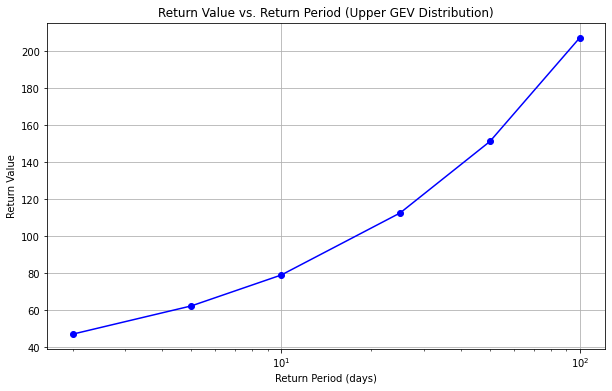

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


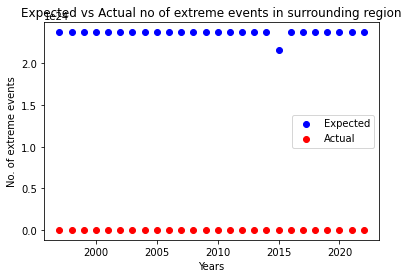

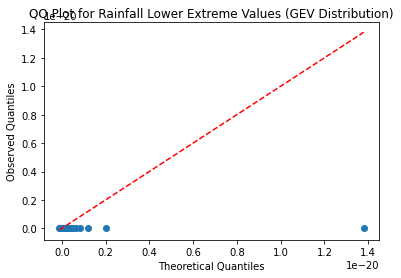

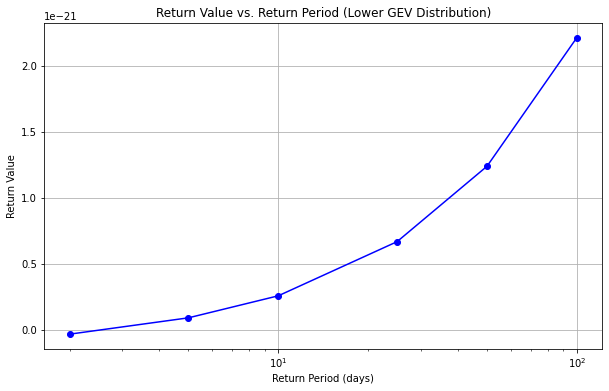

((24, 26), (94, 96))
85644


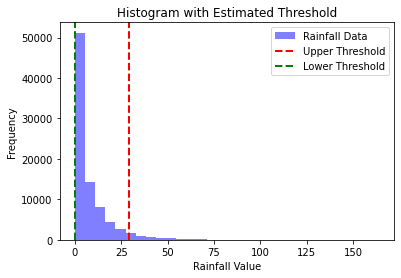

Estimated Upper Threshold: 29.29
Estimated Lower Threshold: 0.00


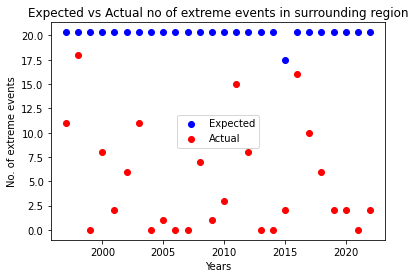

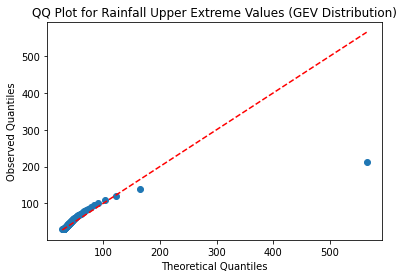

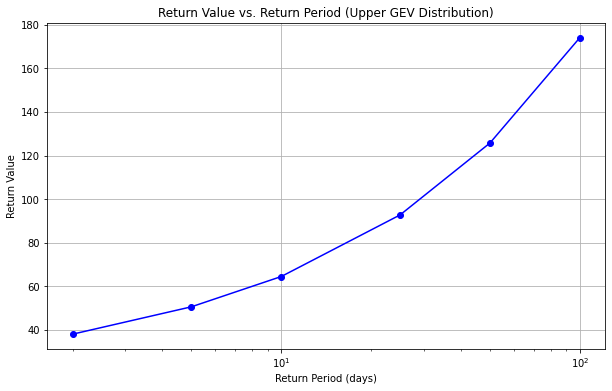

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


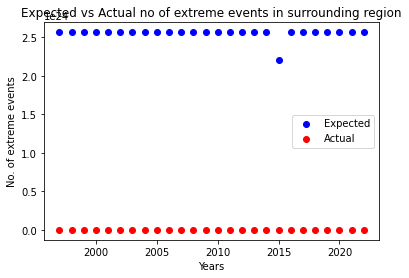

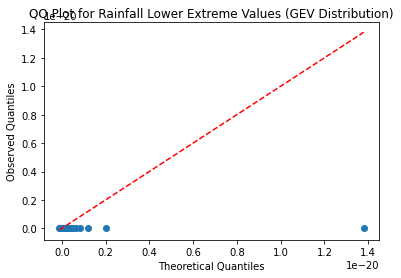

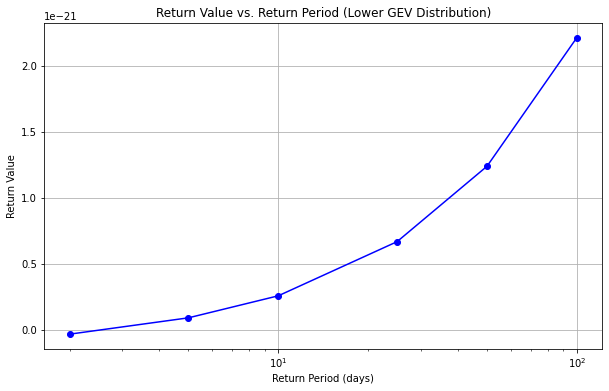

((24, 26), (96, 98))
((24, 26), (98, 100))
((26, 28), (68, 70))
53924


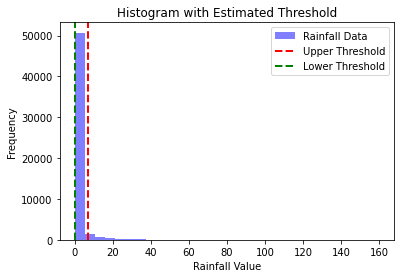

Estimated Upper Threshold: 7.10
Estimated Lower Threshold: 0.00


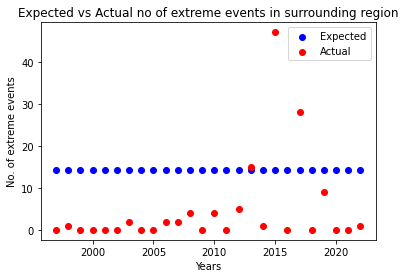

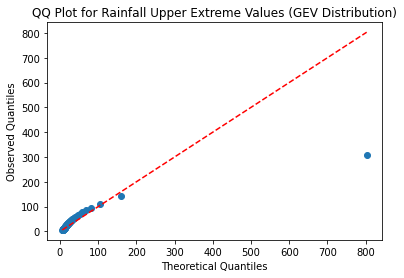

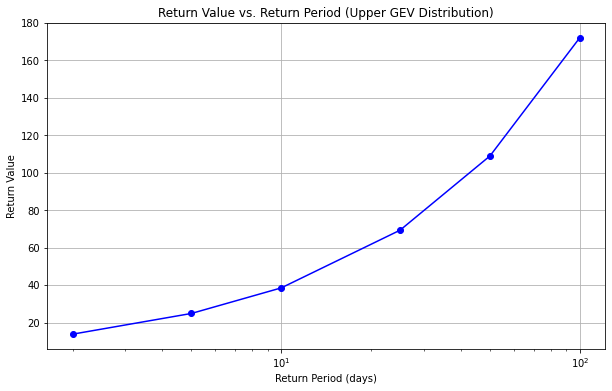

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


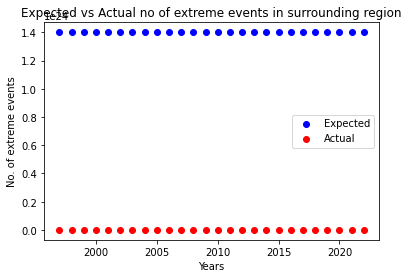

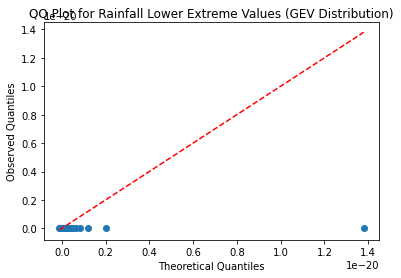

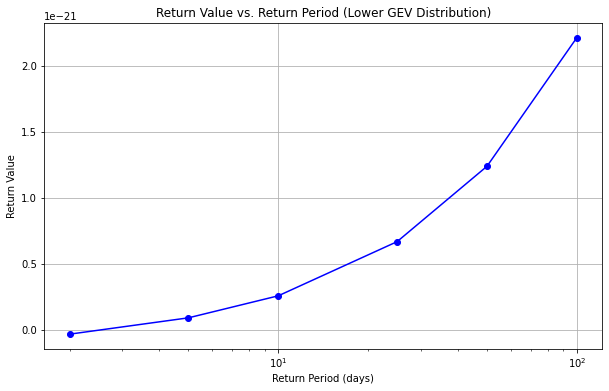

((26, 28), (70, 72))
253760


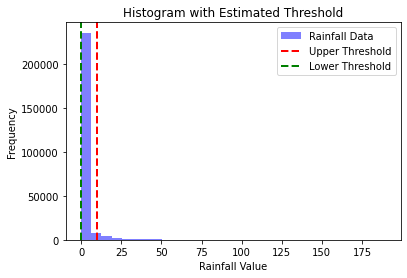

Estimated Upper Threshold: 10.13
Estimated Lower Threshold: 0.00


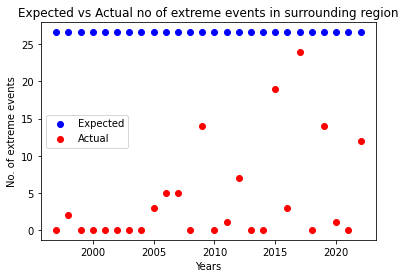

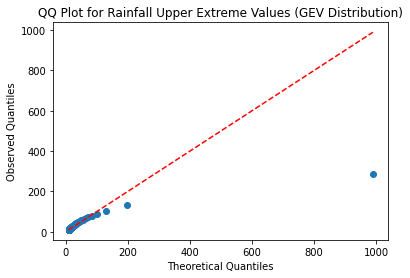

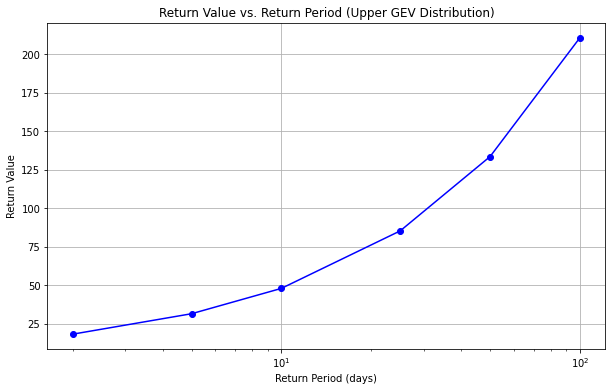

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


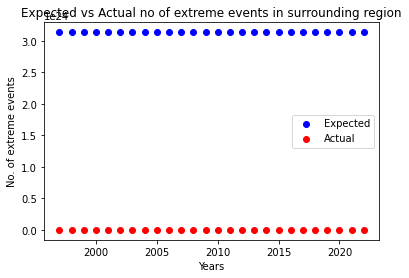

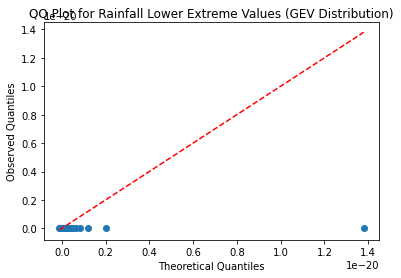

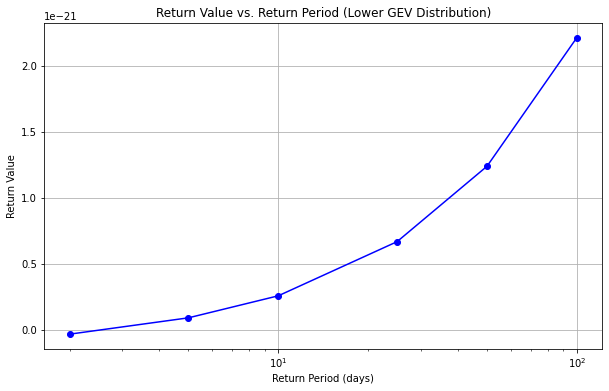

((26, 28), (72, 74))
256932


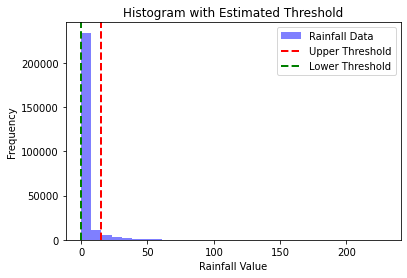

Estimated Upper Threshold: 14.78
Estimated Lower Threshold: 0.00


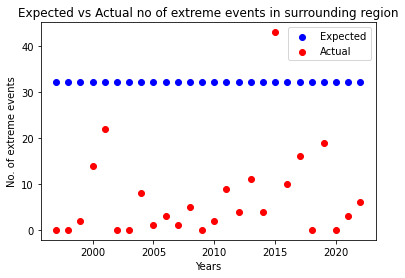

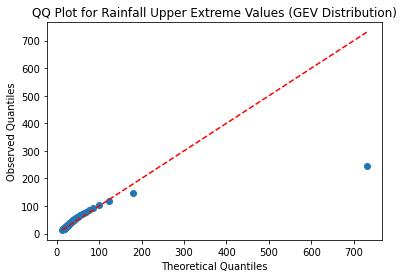

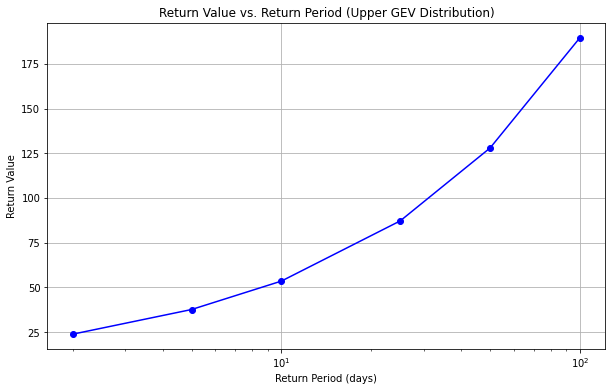

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


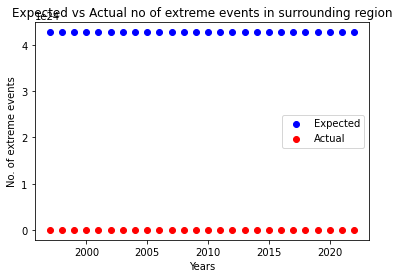

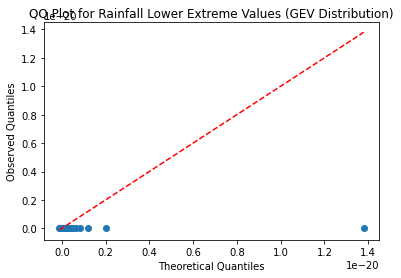

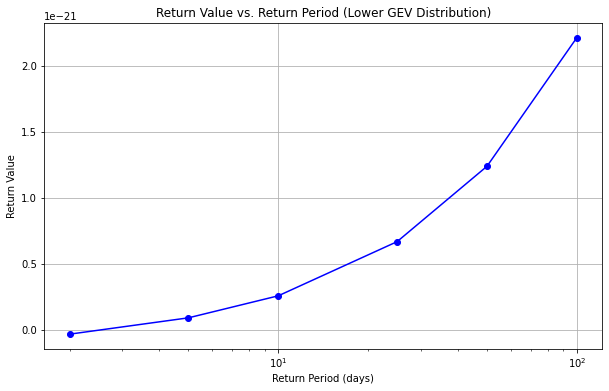

((26, 28), (74, 76))
256932


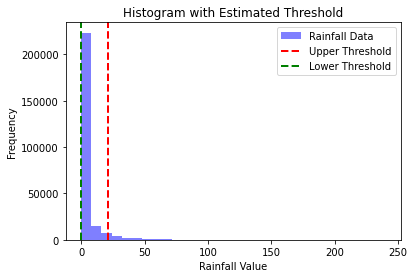

Estimated Upper Threshold: 20.99
Estimated Lower Threshold: 0.00


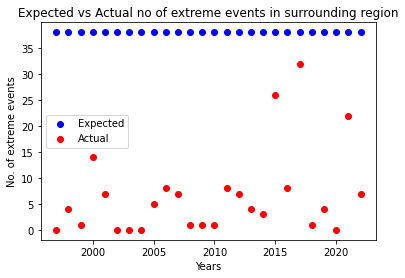

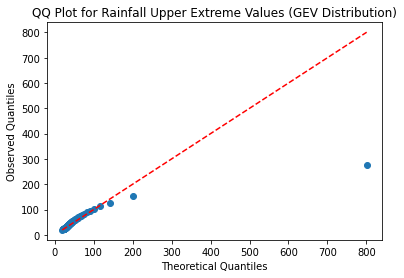

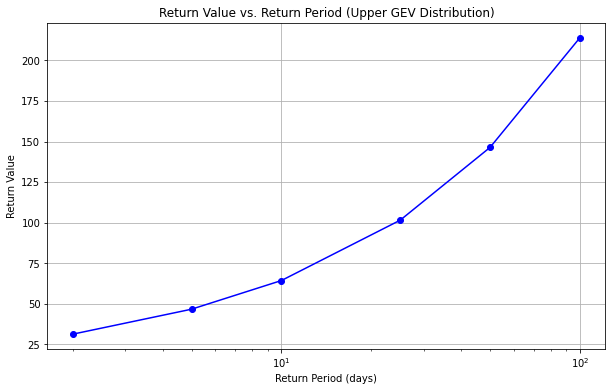

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


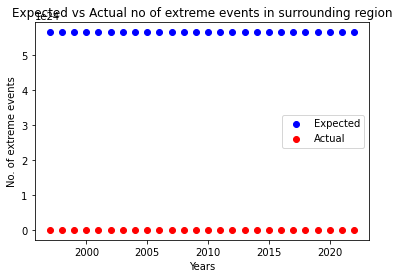

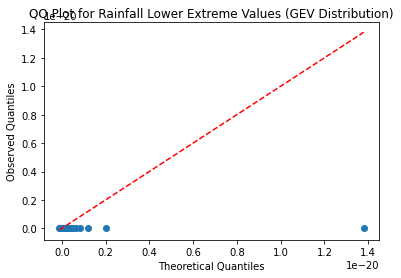

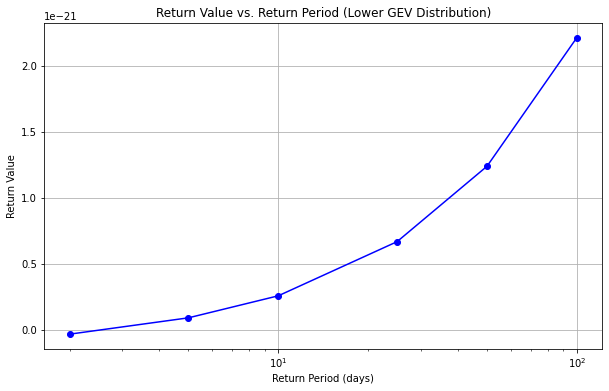

((26, 28), (76, 78))
256932


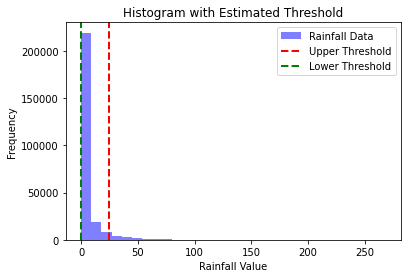

Estimated Upper Threshold: 24.37
Estimated Lower Threshold: 0.00


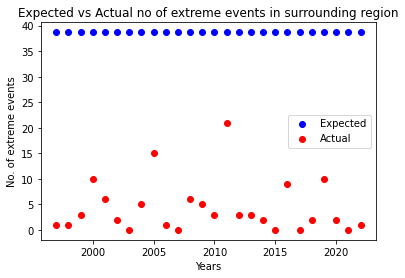

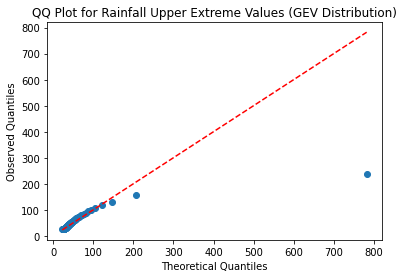

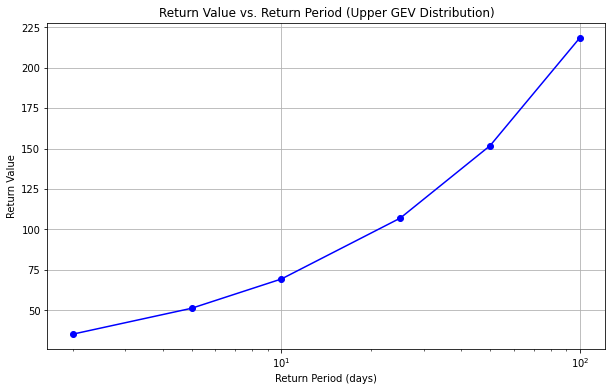

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


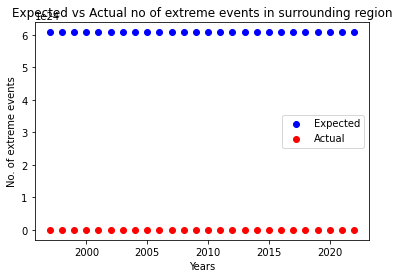

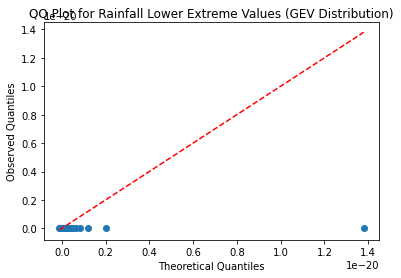

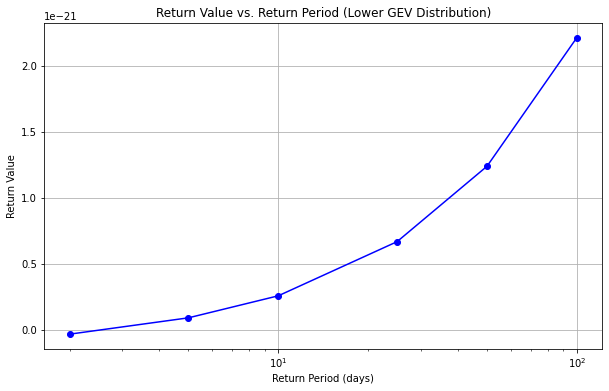

((26, 28), (78, 80))
256932


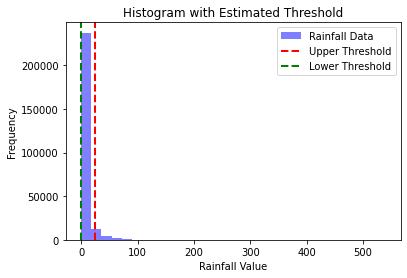

Estimated Upper Threshold: 24.82
Estimated Lower Threshold: 0.00


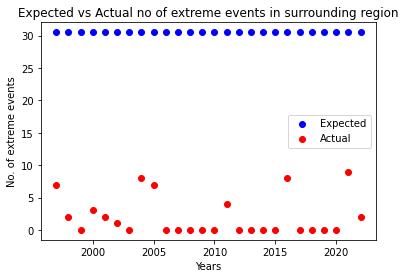

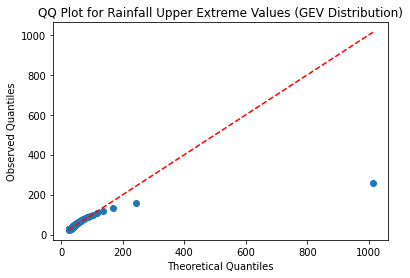

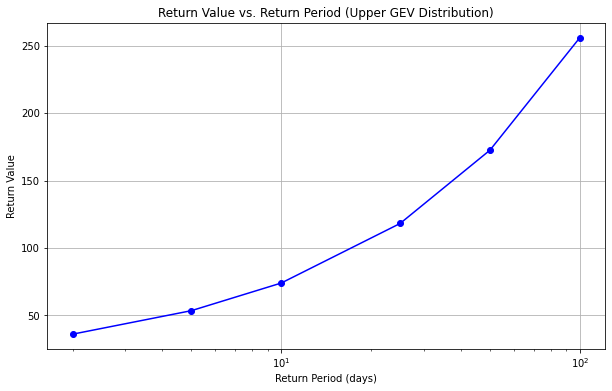

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


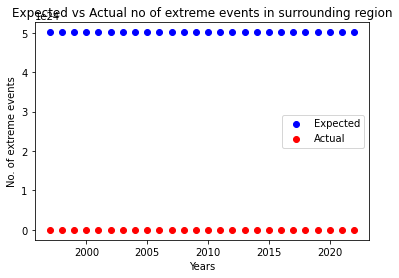

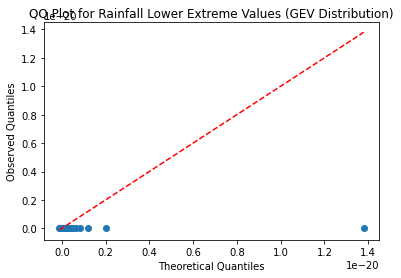

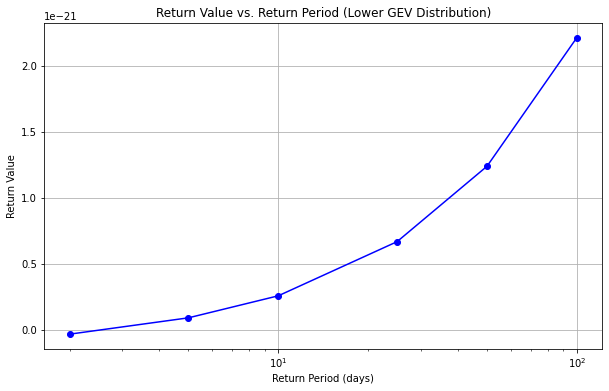

((26, 28), (80, 82))
256932


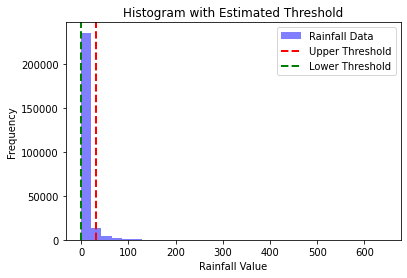

Estimated Upper Threshold: 31.90
Estimated Lower Threshold: 0.00


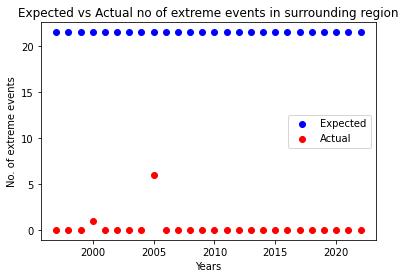

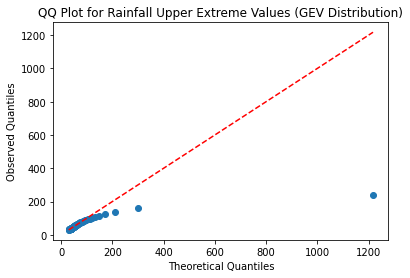

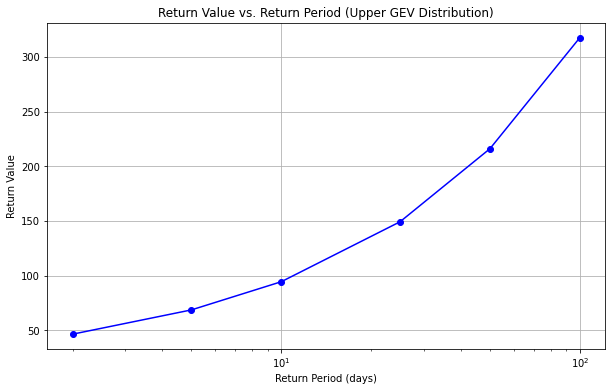

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


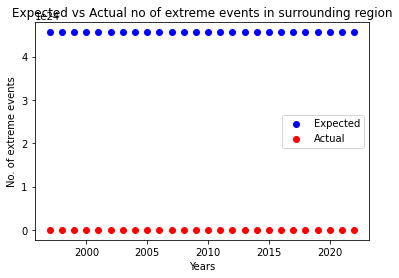

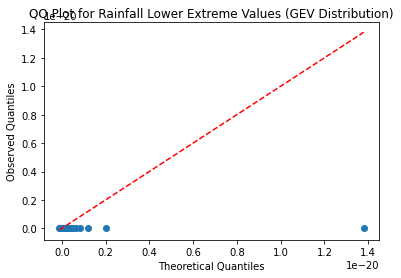

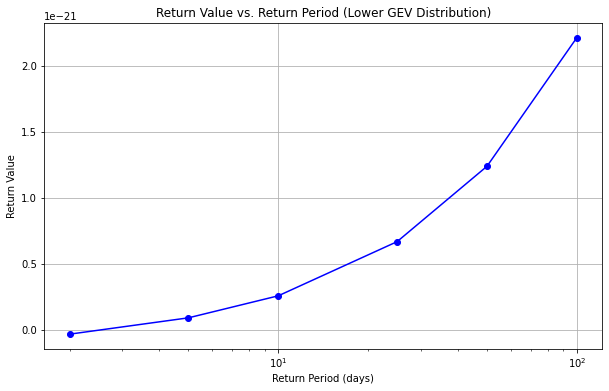

((26, 28), (82, 84))
218868


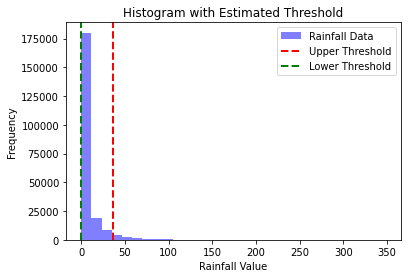

Estimated Upper Threshold: 35.94
Estimated Lower Threshold: 0.00


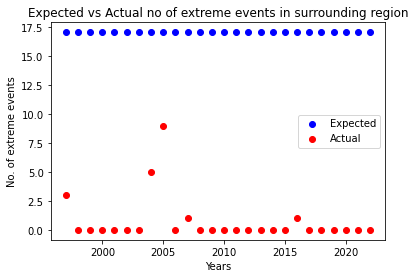

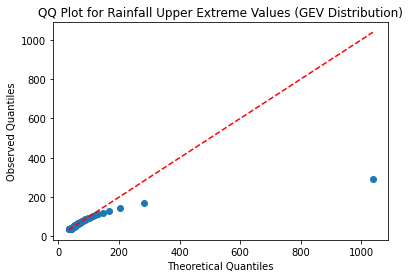

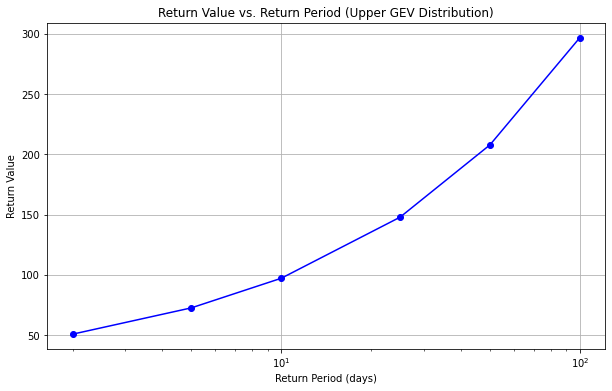

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


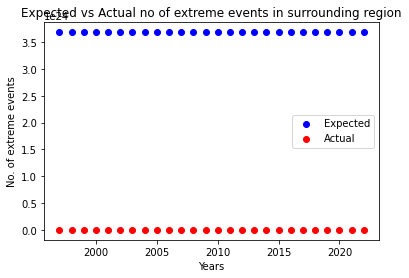

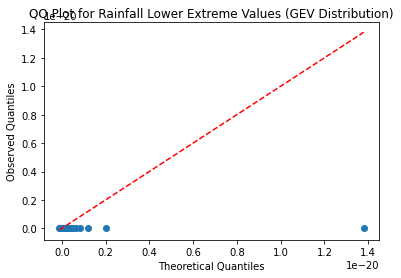

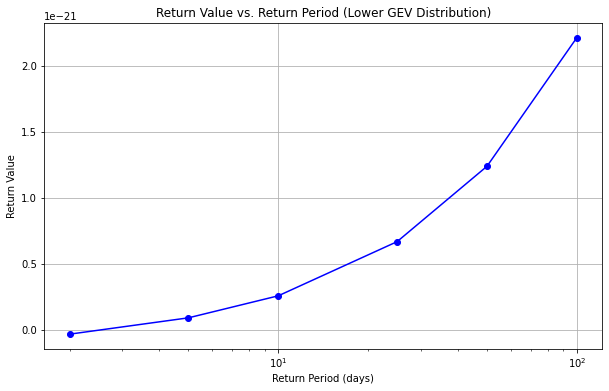

((26, 28), (84, 86))
158600


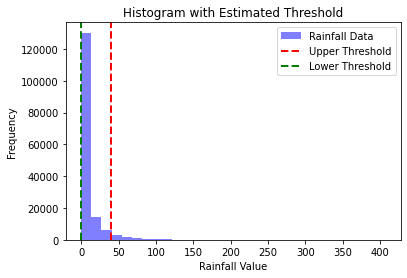

Estimated Upper Threshold: 40.20
Estimated Lower Threshold: 0.00


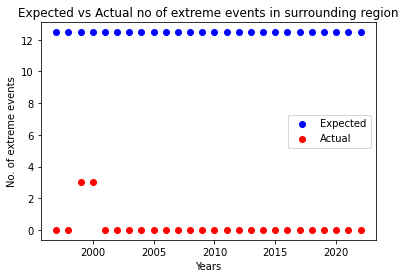

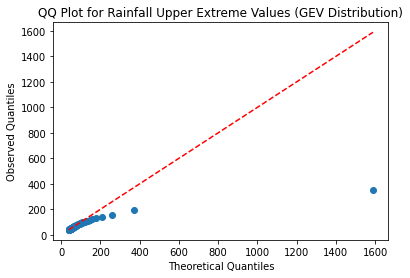

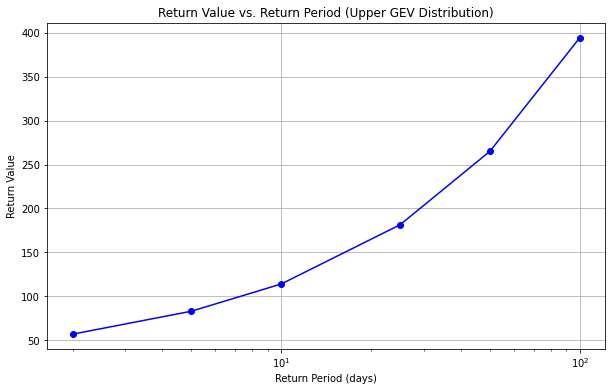

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


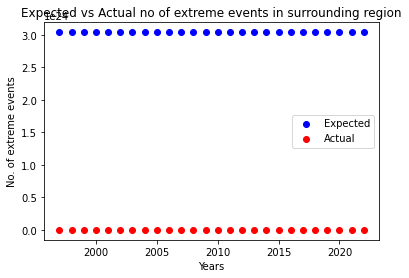

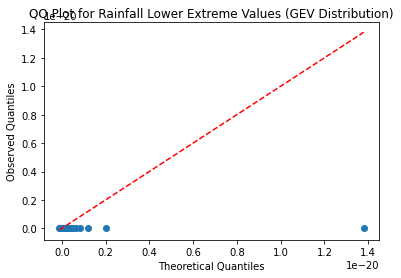

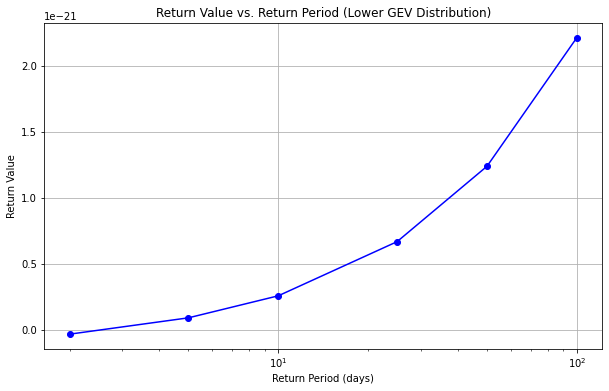

((26, 28), (86, 88))
117364


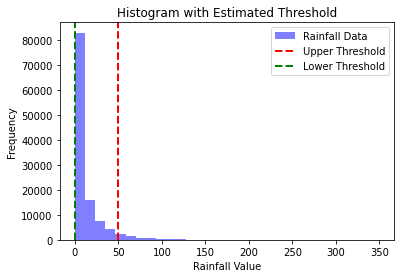

Estimated Upper Threshold: 49.54
Estimated Lower Threshold: 0.00


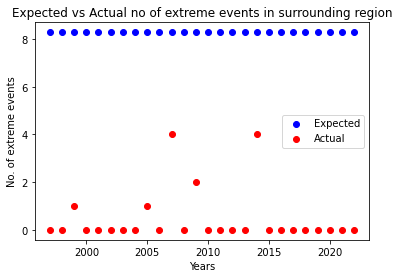

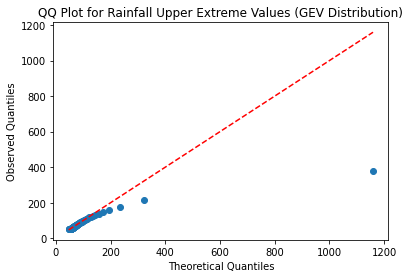

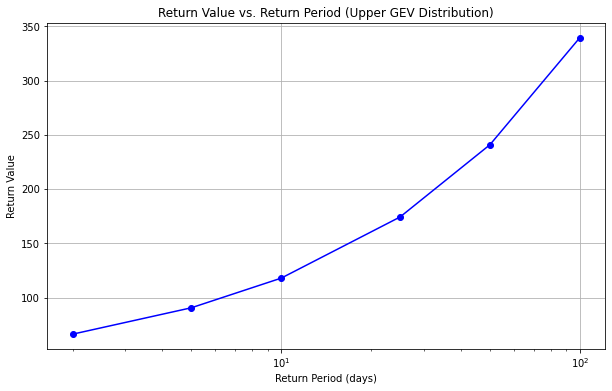

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


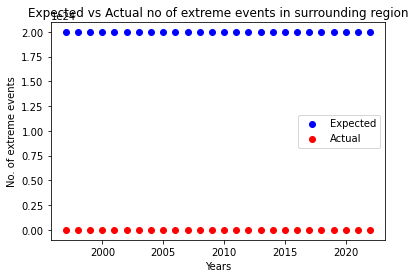

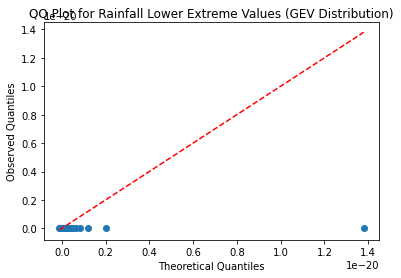

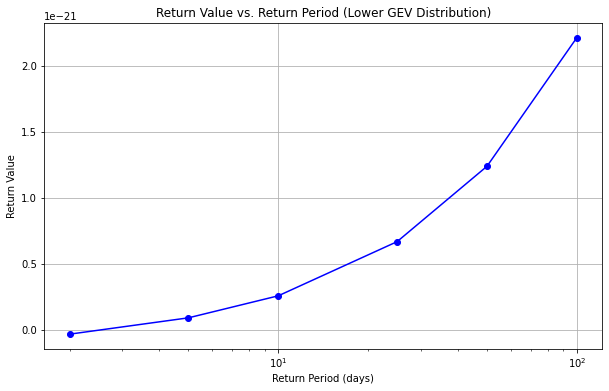

((26, 28), (88, 90))
174460


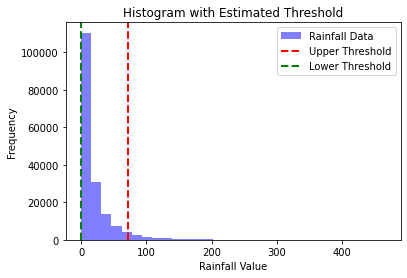

Estimated Upper Threshold: 72.09
Estimated Lower Threshold: 0.00


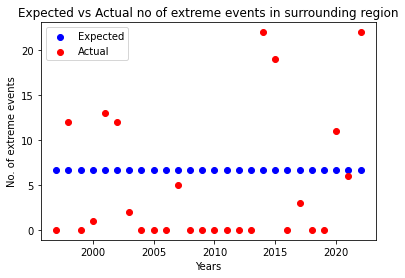

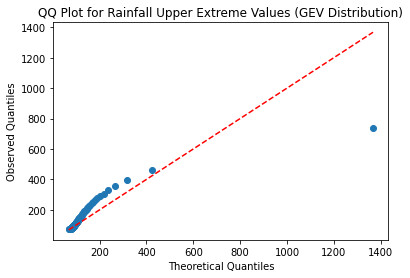

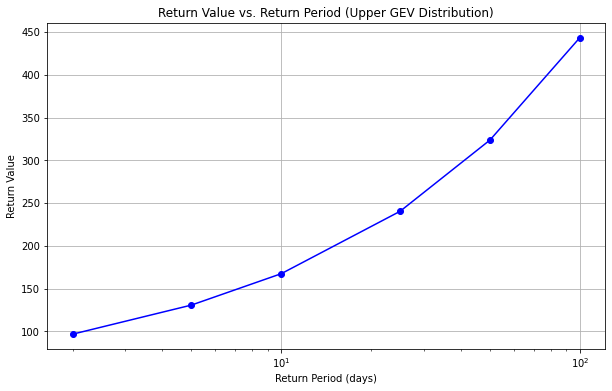

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


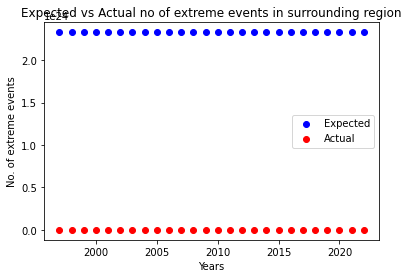

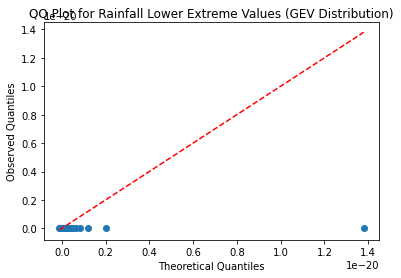

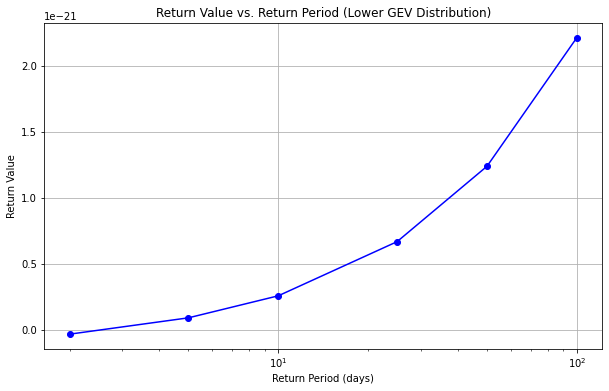

((26, 28), (90, 92))
171288


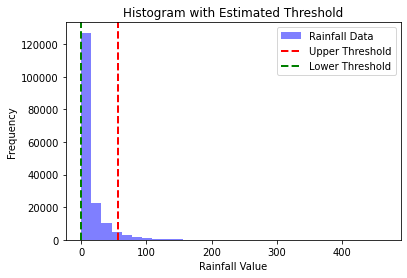

Estimated Upper Threshold: 55.81
Estimated Lower Threshold: 0.00


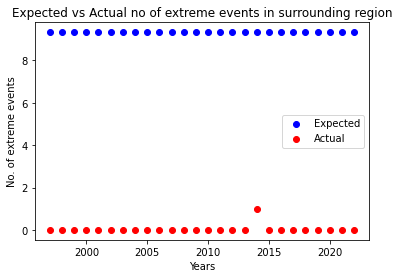

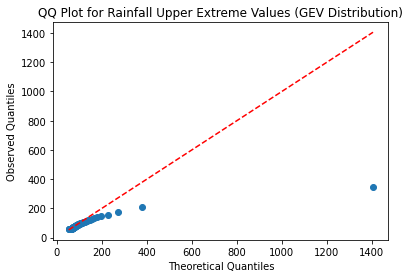

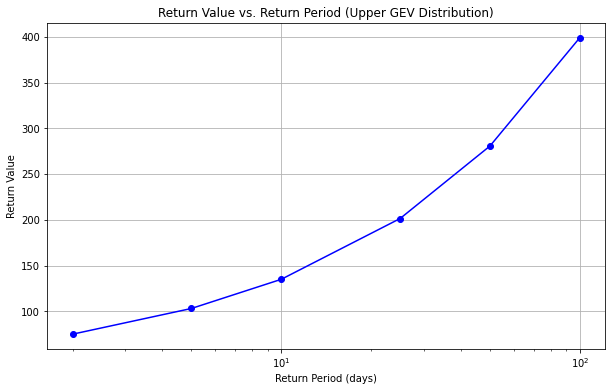

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


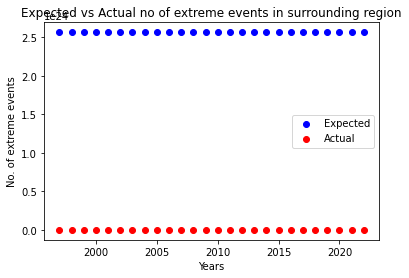

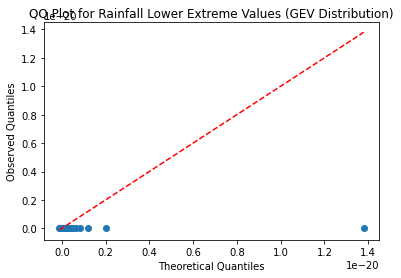

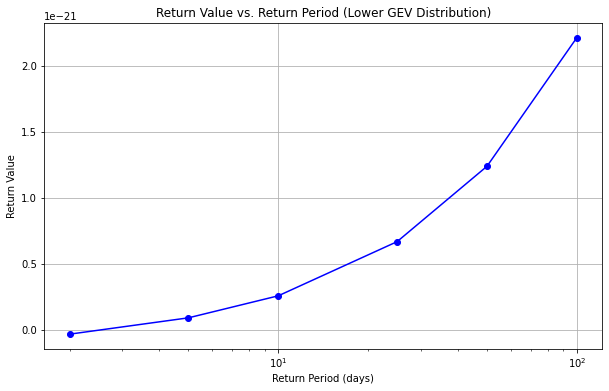

((26, 28), (92, 94))
256932


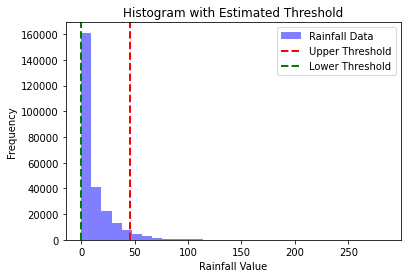

Estimated Upper Threshold: 45.28
Estimated Lower Threshold: 0.00


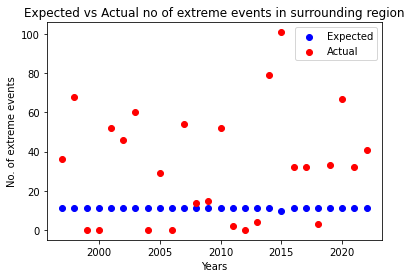

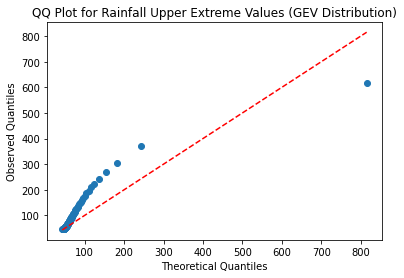

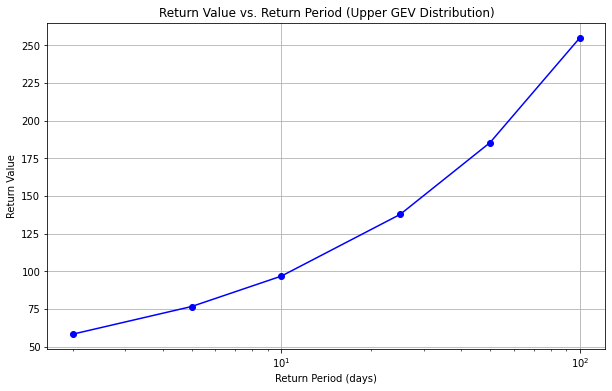

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


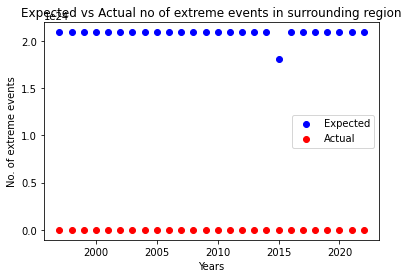

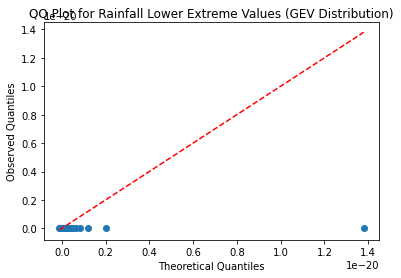

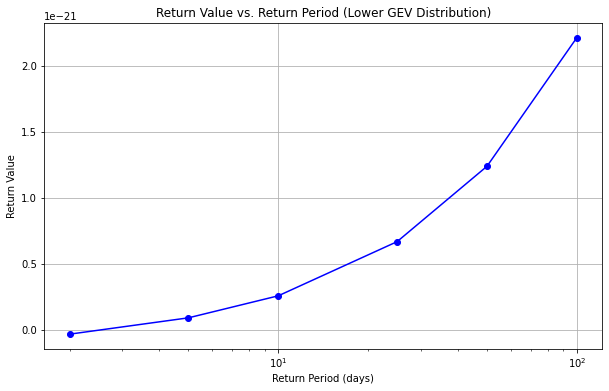

((26, 28), (94, 96))
205082


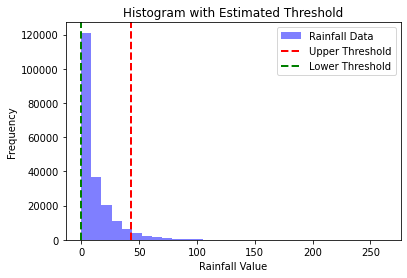

Estimated Upper Threshold: 42.85
Estimated Lower Threshold: 0.00


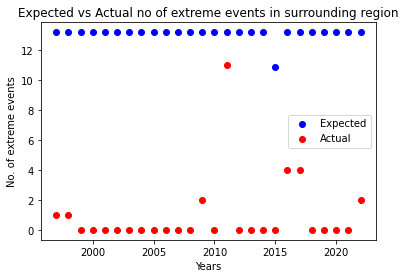

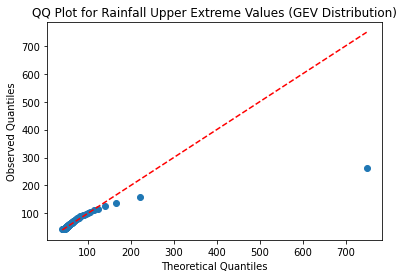

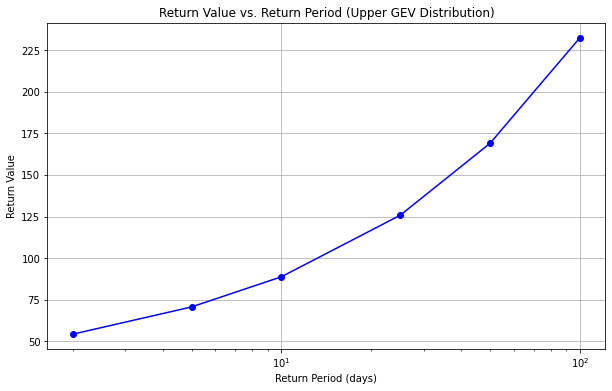

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


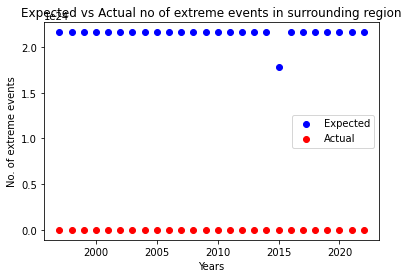

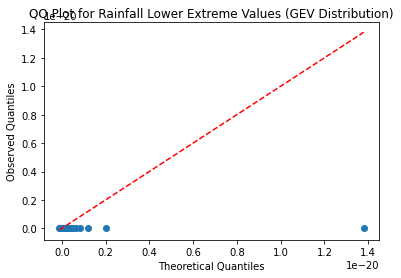

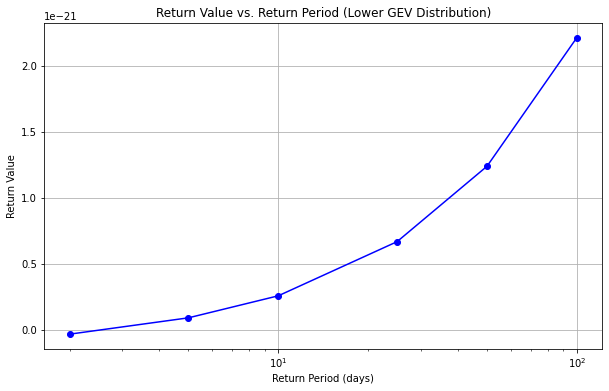

((26, 28), (96, 98))
57950


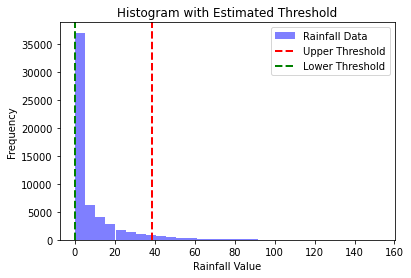

Estimated Upper Threshold: 38.48
Estimated Lower Threshold: 0.00


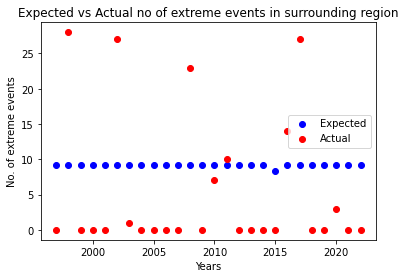

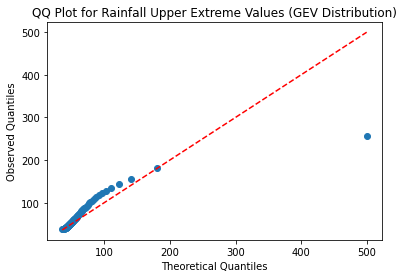

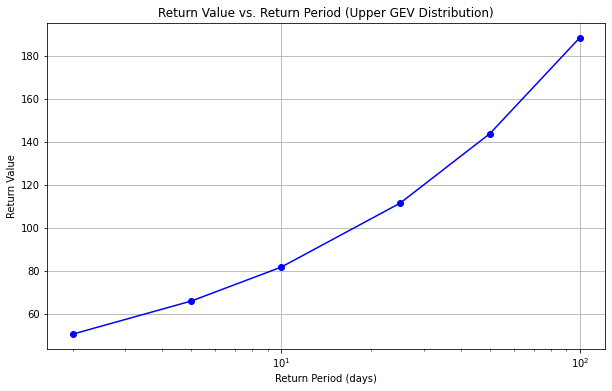

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


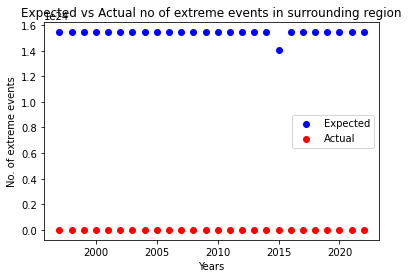

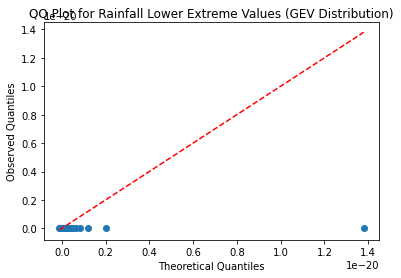

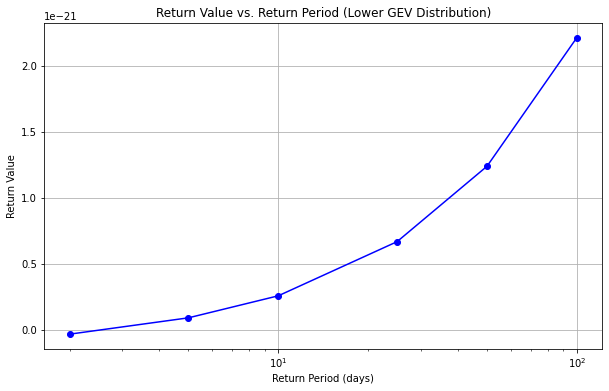

((26, 28), (98, 100))
((28, 30), (68, 70))
3172


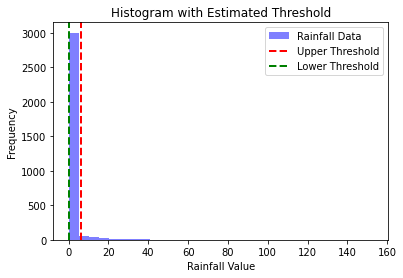

Estimated Upper Threshold: 5.95
Estimated Lower Threshold: 0.00


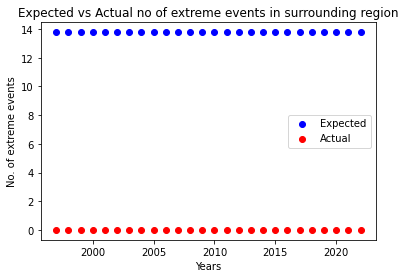

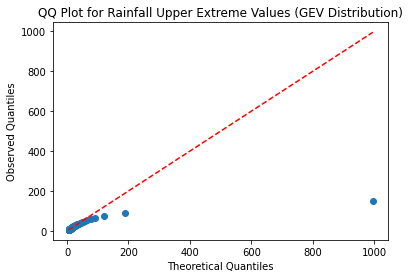

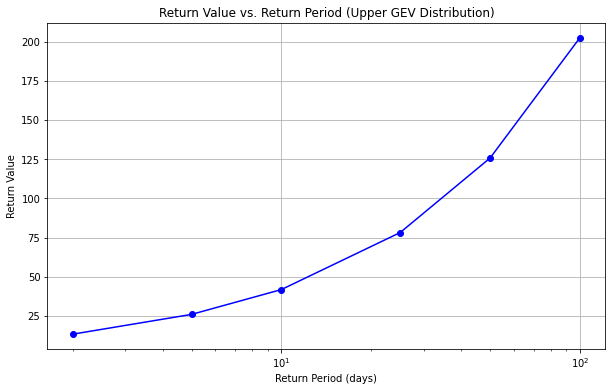

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


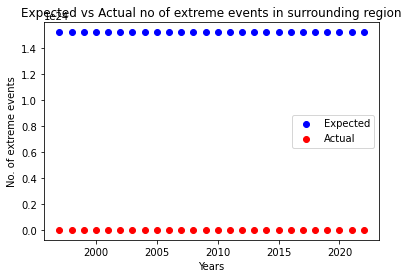

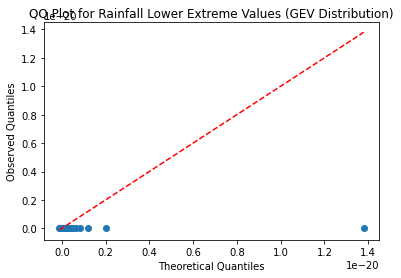

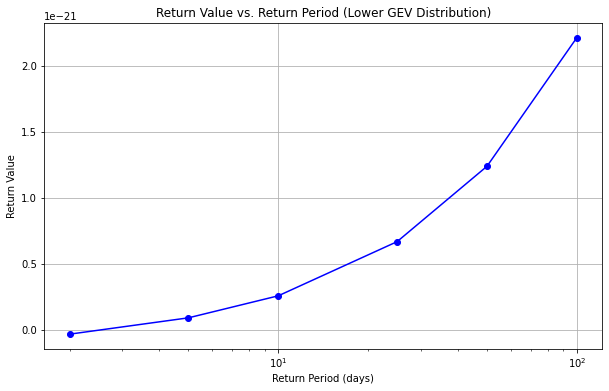

((28, 30), (70, 72))
34892


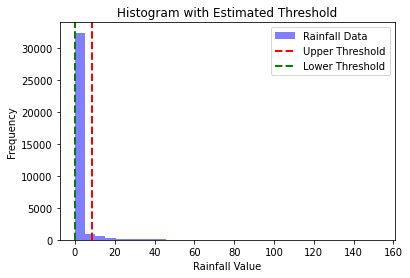

Estimated Upper Threshold: 8.79
Estimated Lower Threshold: 0.00


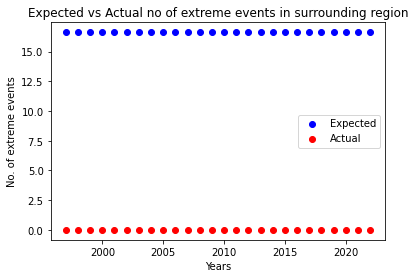

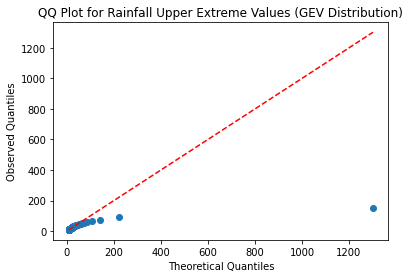

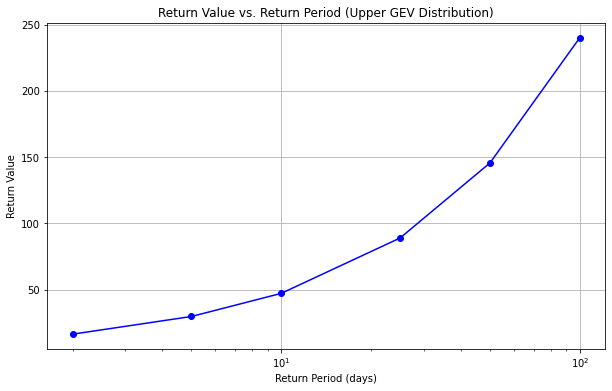

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


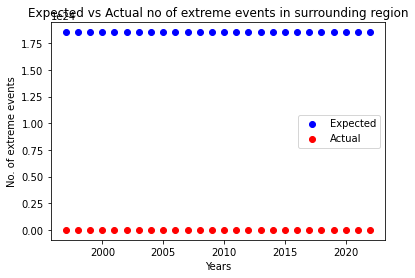

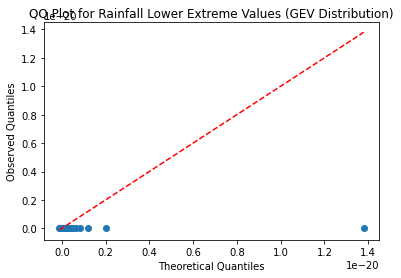

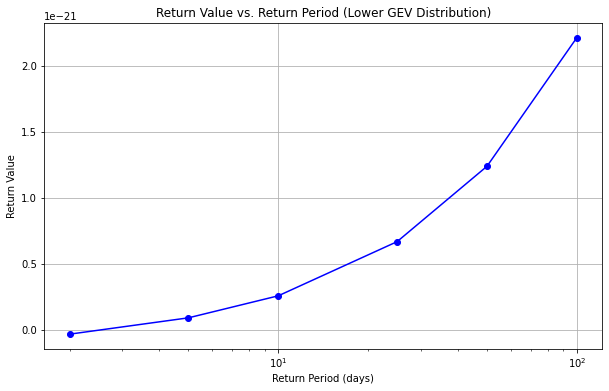

((28, 30), (72, 74))
199836


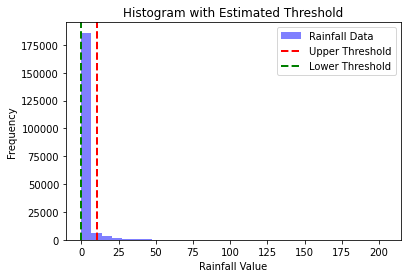

Estimated Upper Threshold: 10.32
Estimated Lower Threshold: 0.00


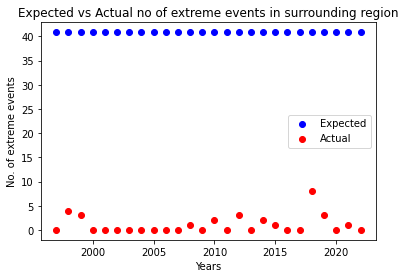

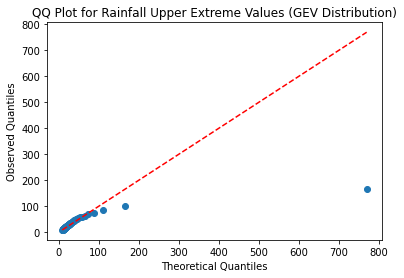

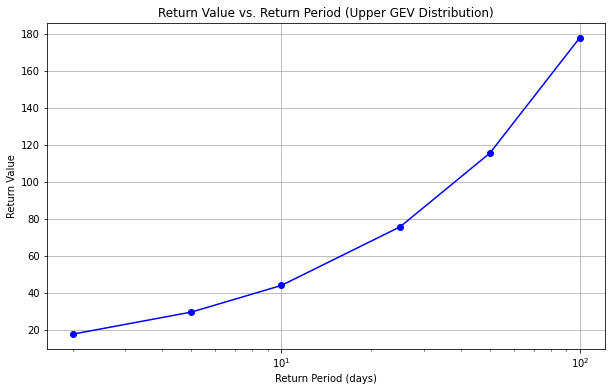

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


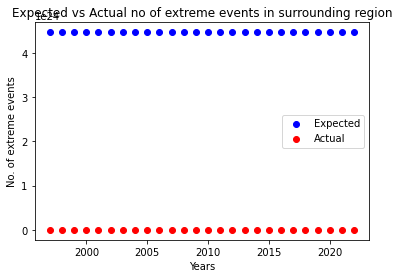

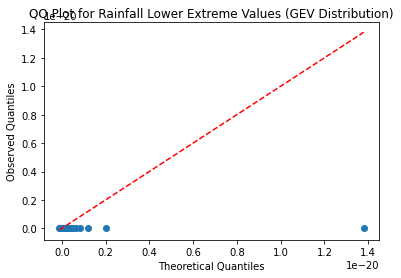

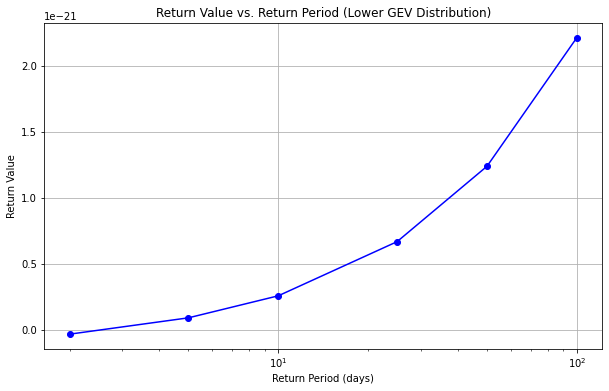

((28, 30), (74, 76))
256932


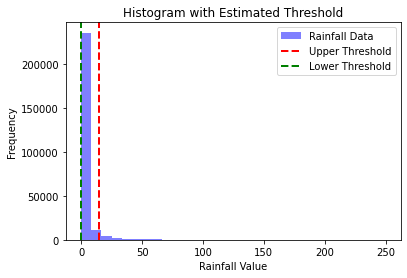

Estimated Upper Threshold: 14.59
Estimated Lower Threshold: 0.00


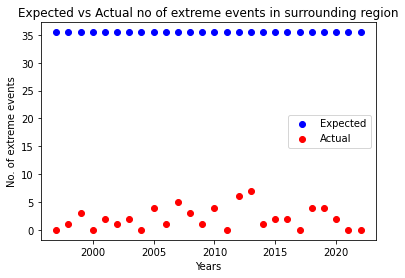

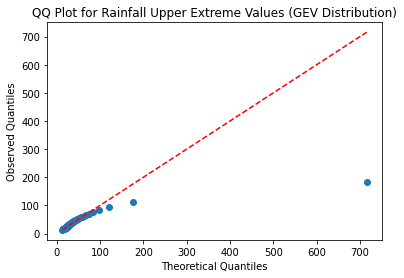

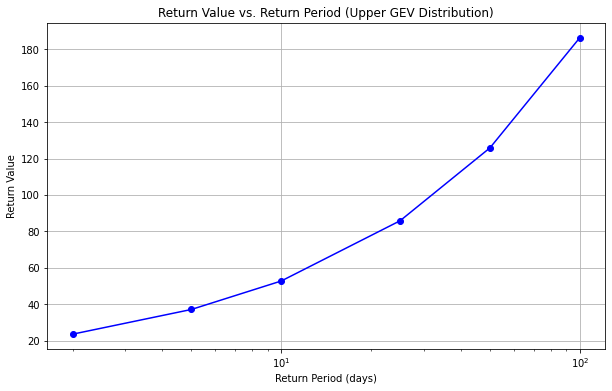

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


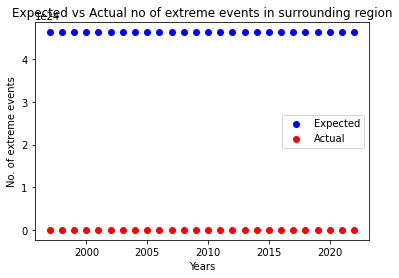

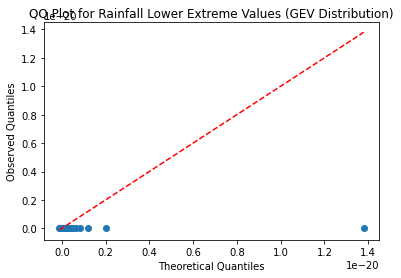

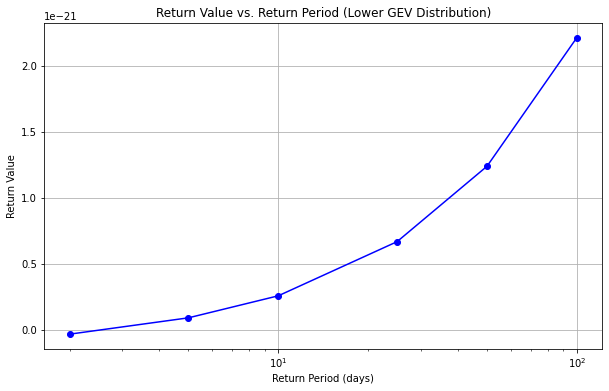

((28, 30), (76, 78))
256932


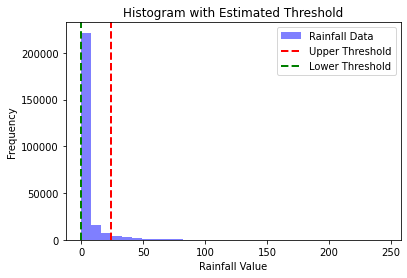

Estimated Upper Threshold: 23.81
Estimated Lower Threshold: 0.00


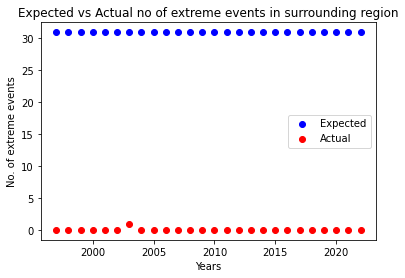

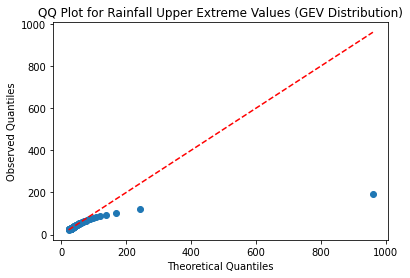

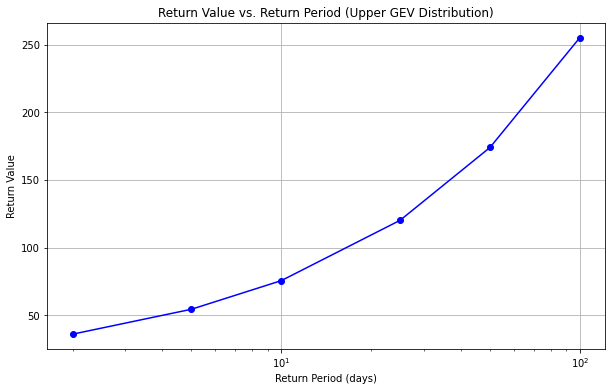

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


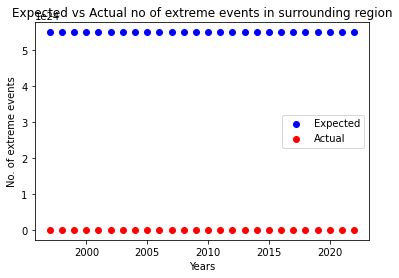

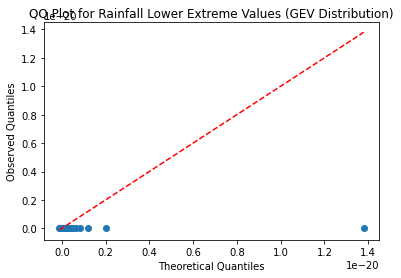

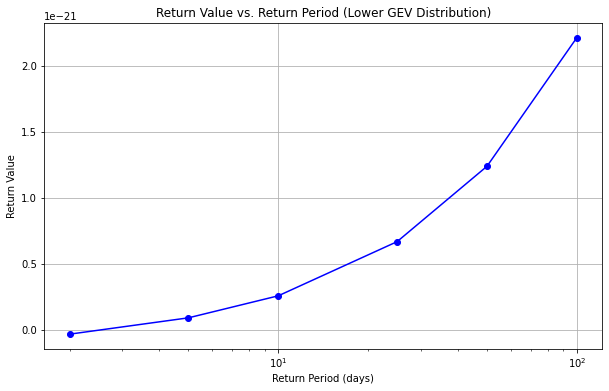

((28, 30), (78, 80))
256932


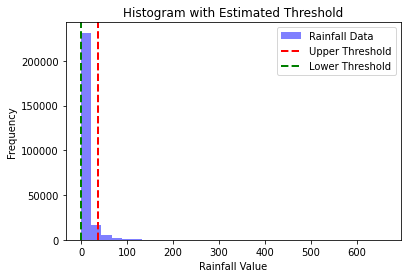

Estimated Upper Threshold: 36.08
Estimated Lower Threshold: 0.00


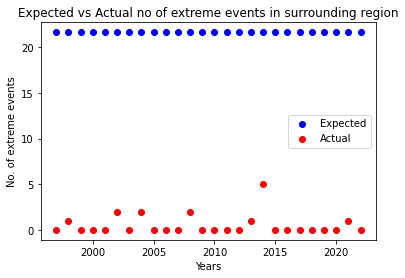

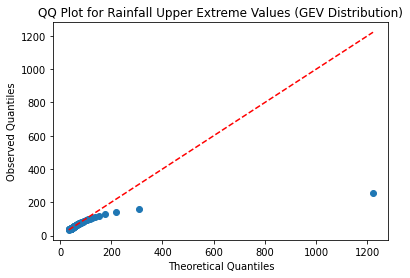

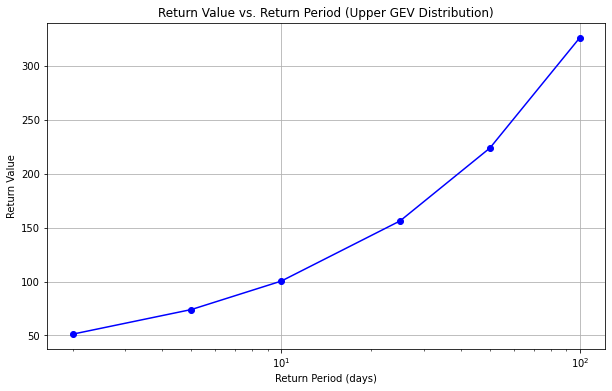

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


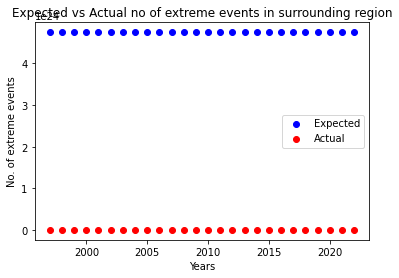

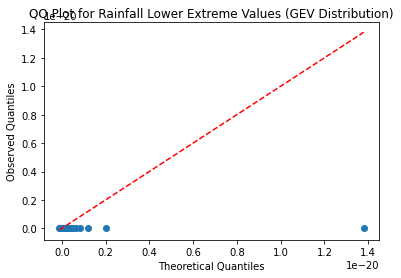

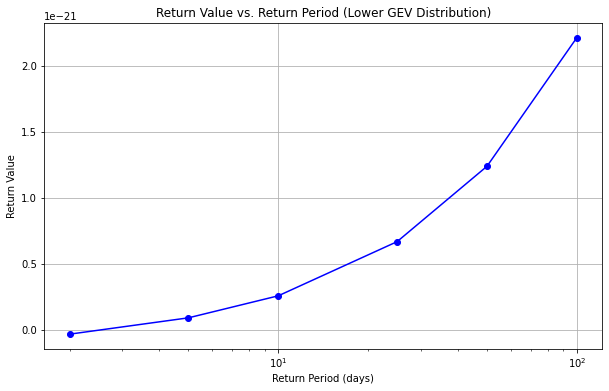

((28, 30), (80, 82))
114192


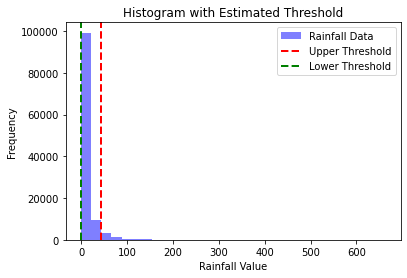

Estimated Upper Threshold: 43.88
Estimated Lower Threshold: 0.00


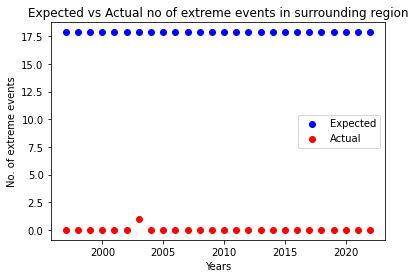

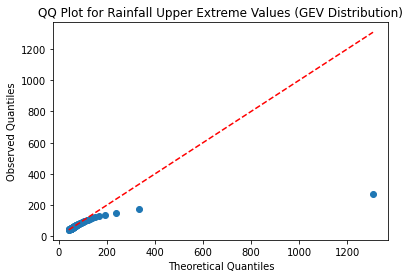

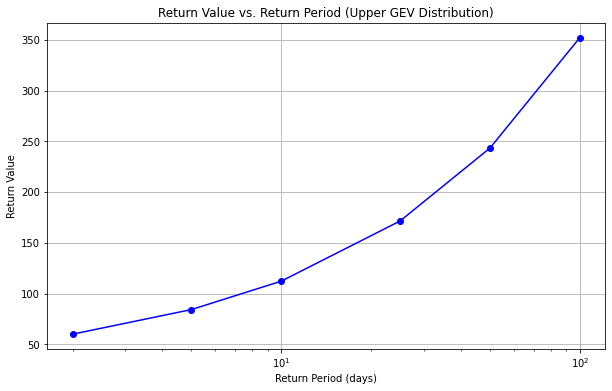

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


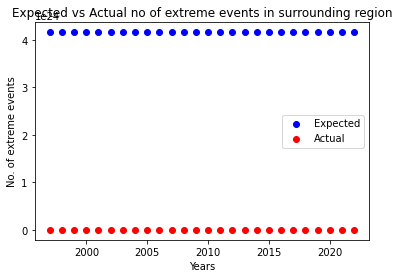

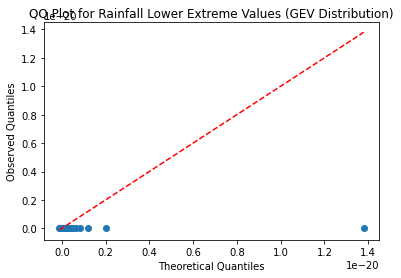

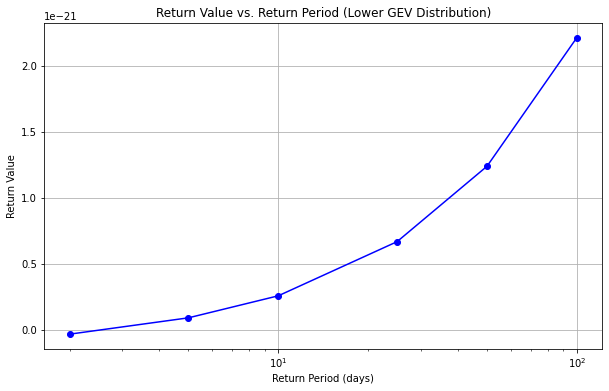

((28, 30), (82, 84))
6344


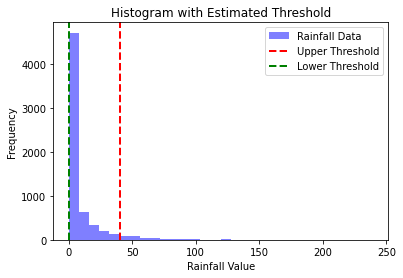

Estimated Upper Threshold: 40.24
Estimated Lower Threshold: 0.00


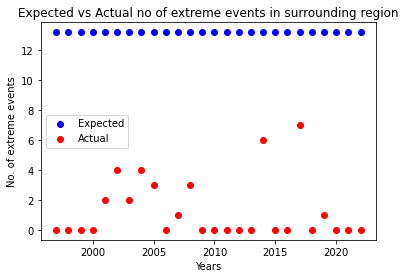

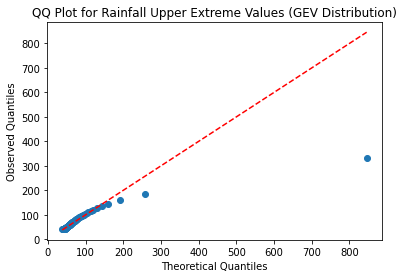

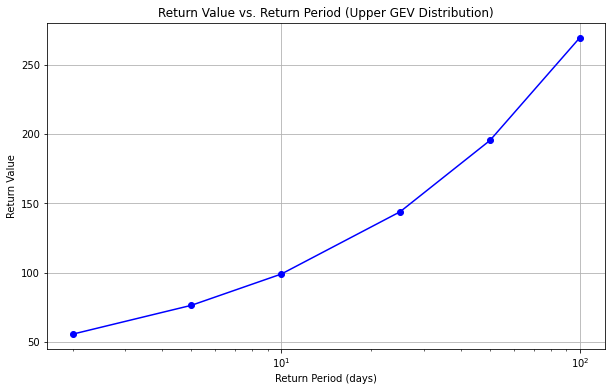

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


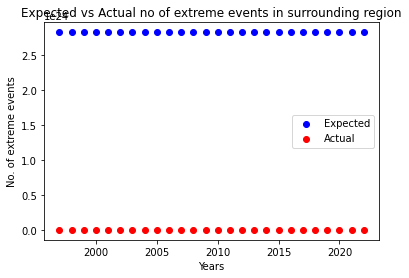

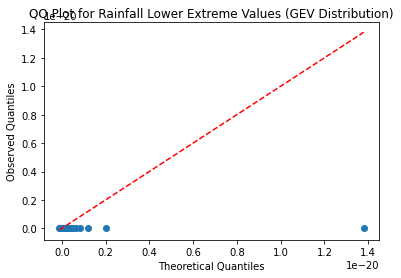

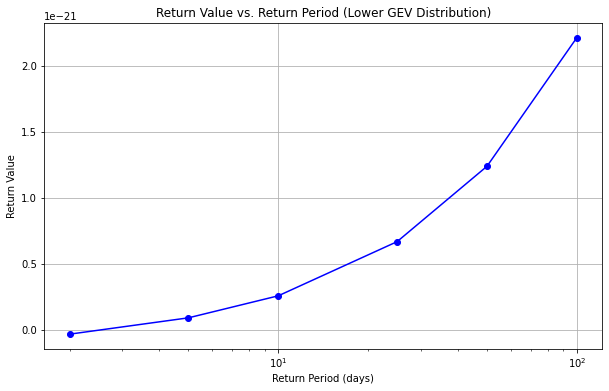

((28, 30), (84, 86))
((28, 30), (86, 88))
3172


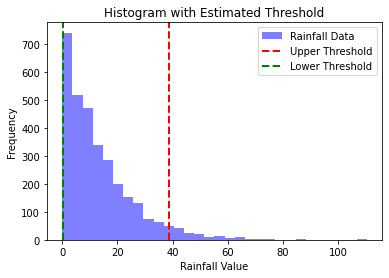

Estimated Upper Threshold: 38.86
Estimated Lower Threshold: 0.36


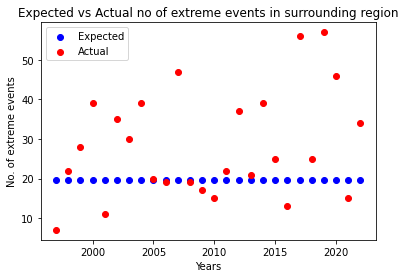

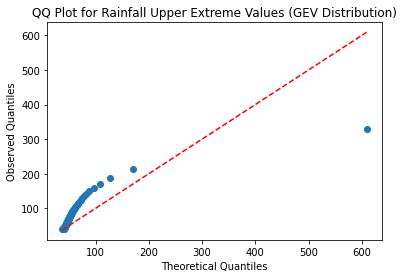

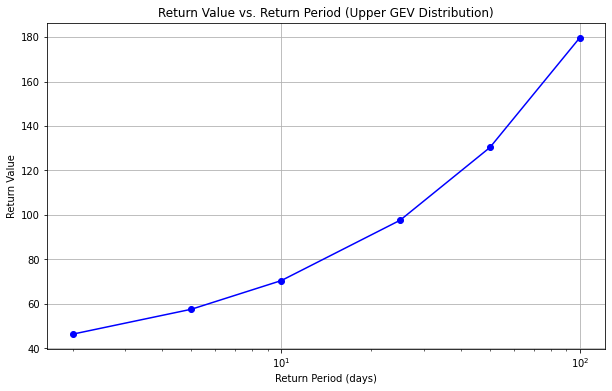

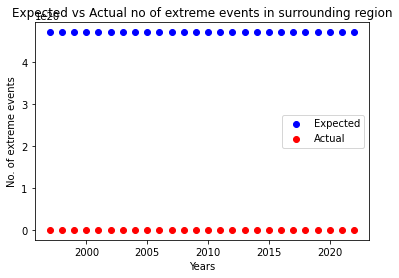

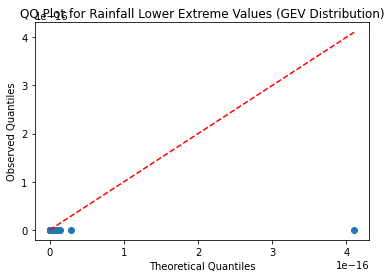

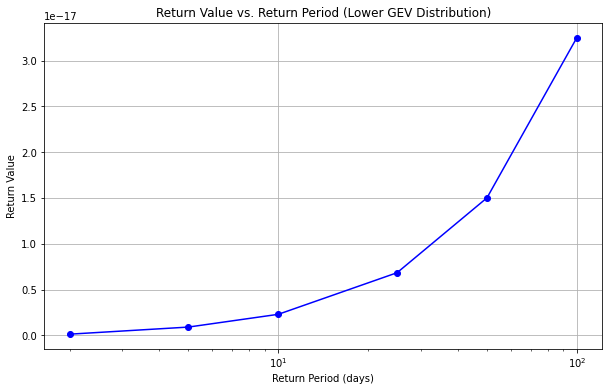

((28, 30), (88, 90))
19032


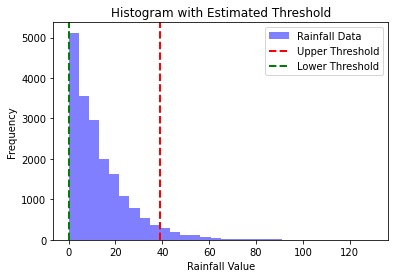

Estimated Upper Threshold: 38.92
Estimated Lower Threshold: 0.26


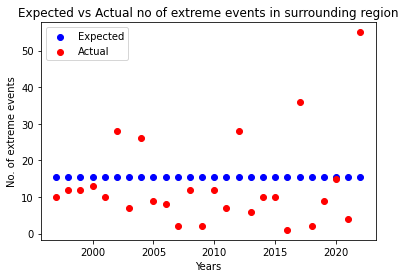

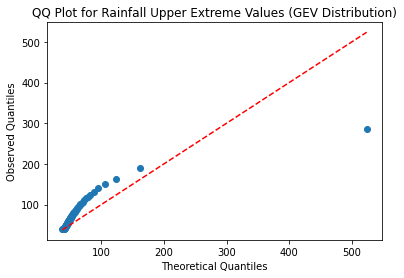

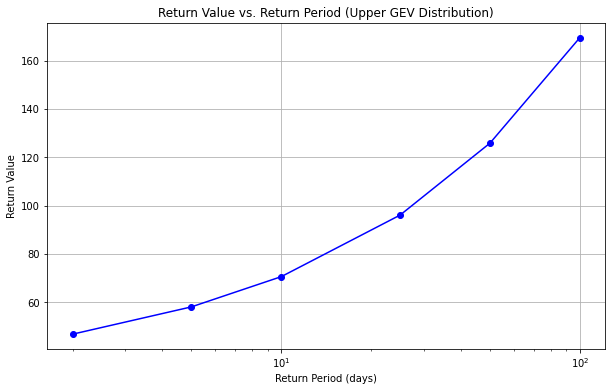

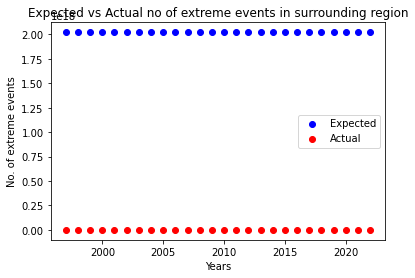

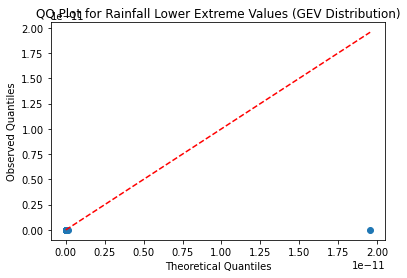

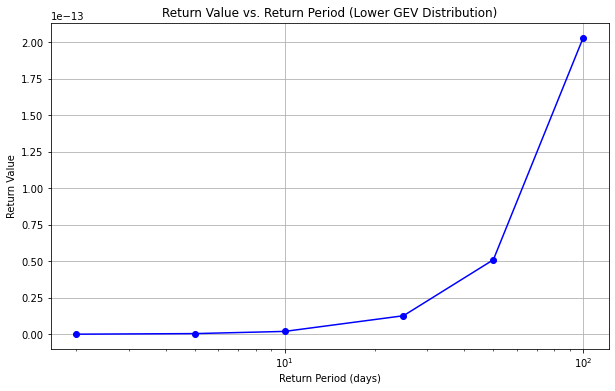

((28, 30), (90, 92))
9516


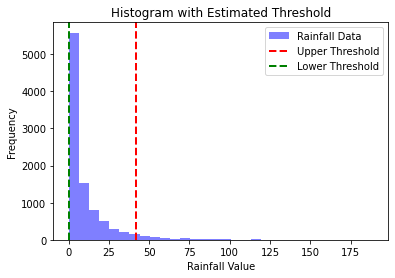

Estimated Upper Threshold: 41.65
Estimated Lower Threshold: 0.00


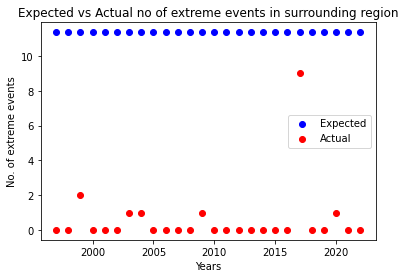

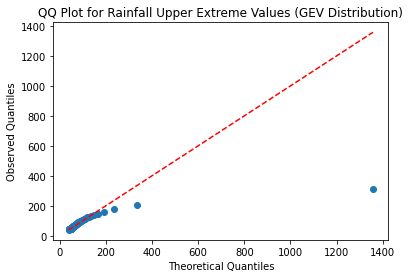

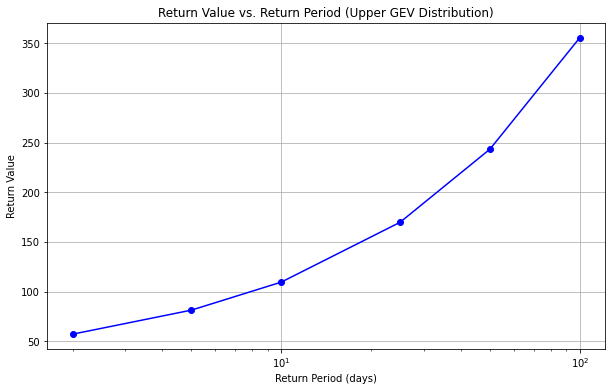

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


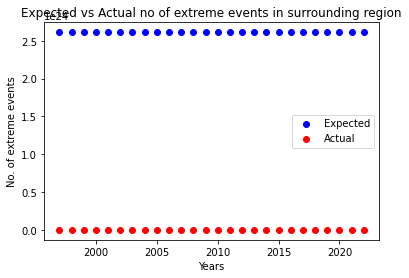

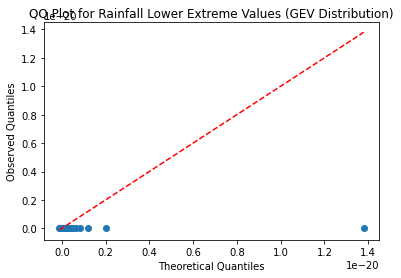

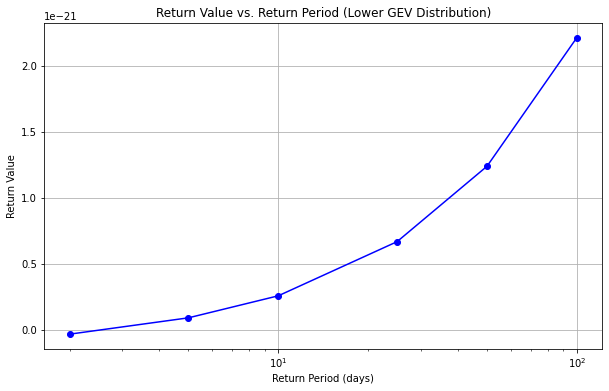

((28, 30), (92, 94))
85644


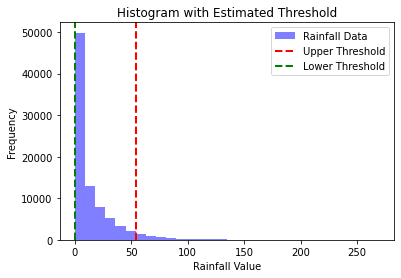

Estimated Upper Threshold: 54.48
Estimated Lower Threshold: 0.00


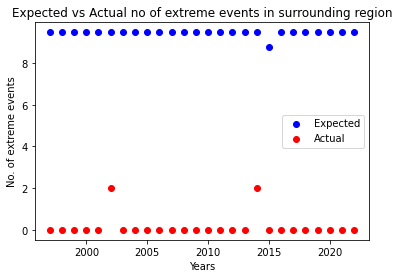

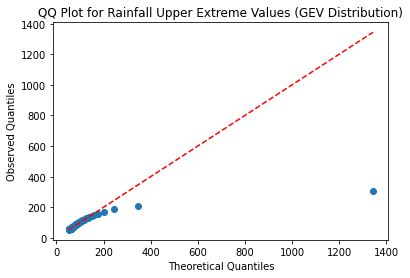

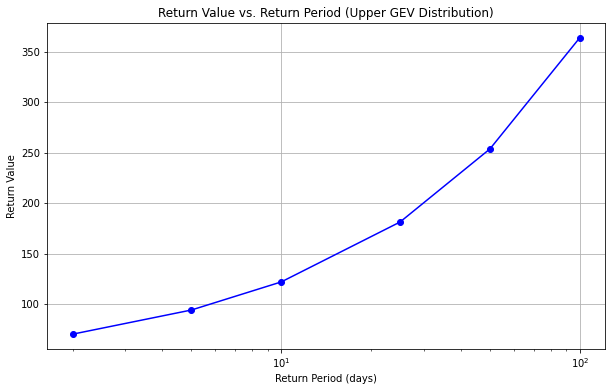

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


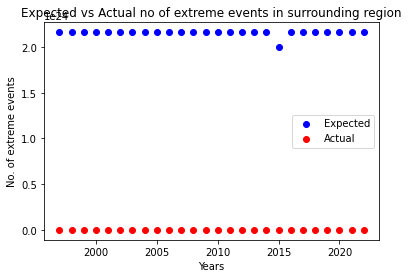

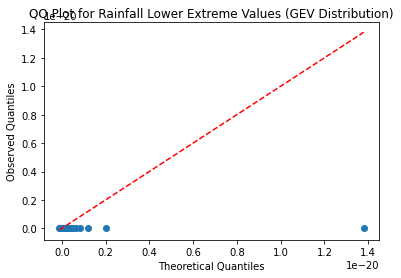

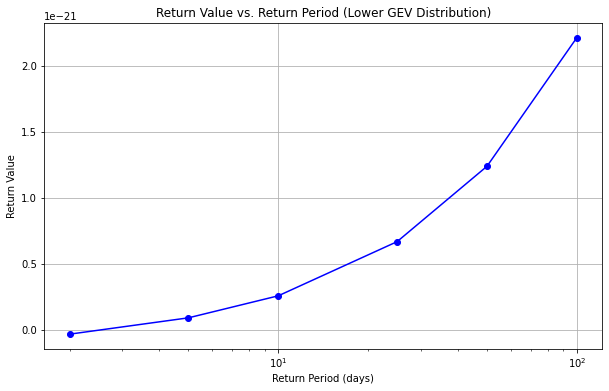

((28, 30), (94, 96))
182268


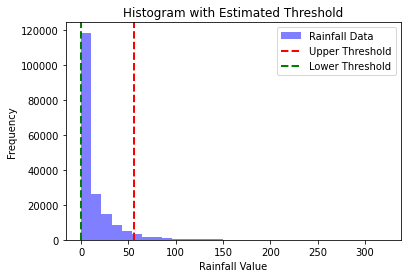

Estimated Upper Threshold: 55.47
Estimated Lower Threshold: 0.00


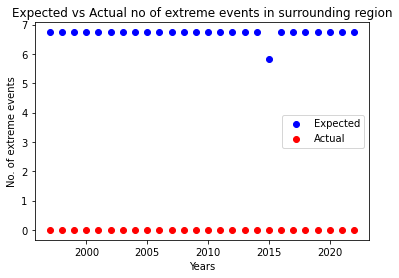

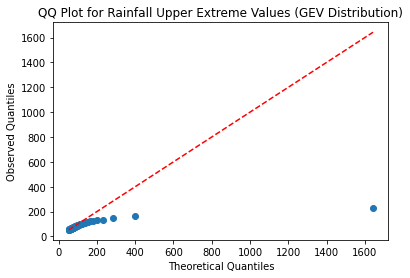

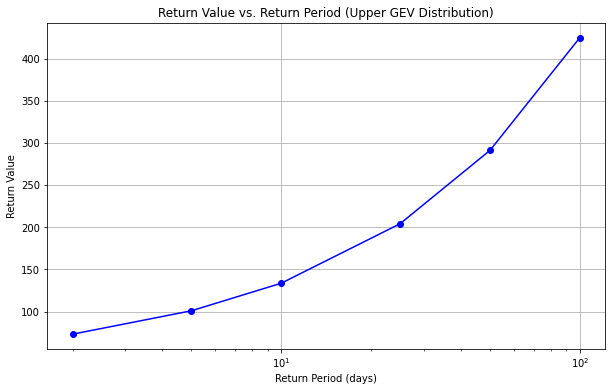

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


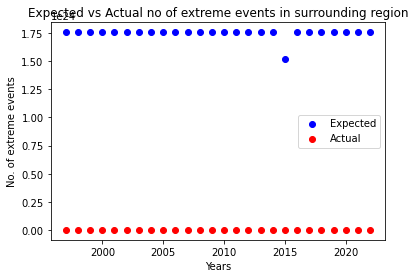

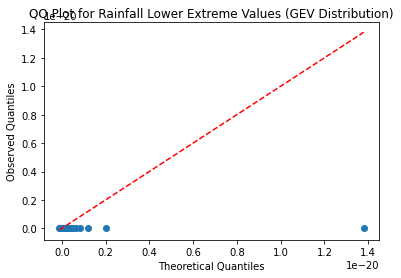

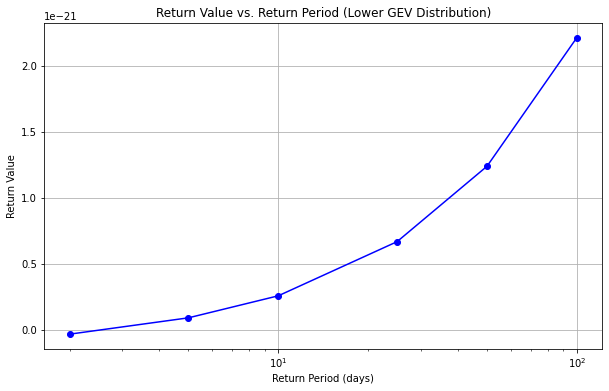

((28, 30), (96, 98))
85400


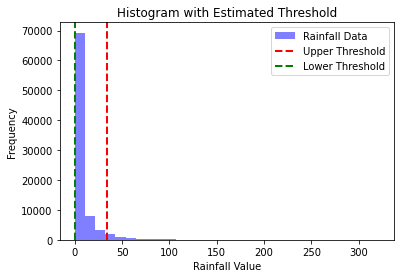

Estimated Upper Threshold: 34.00
Estimated Lower Threshold: 0.00


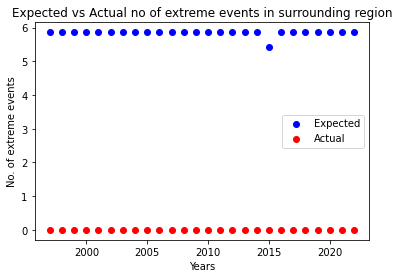

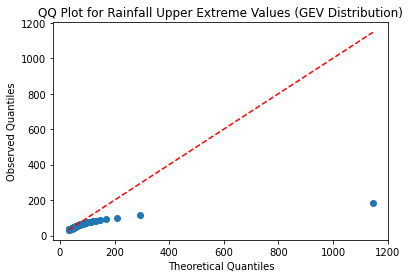

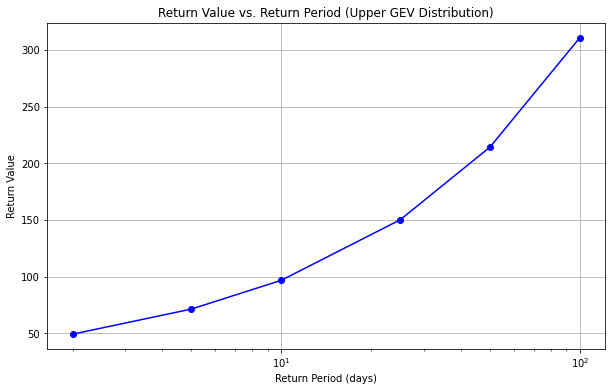

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


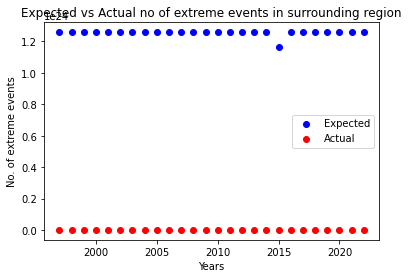

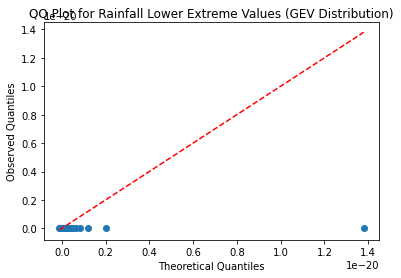

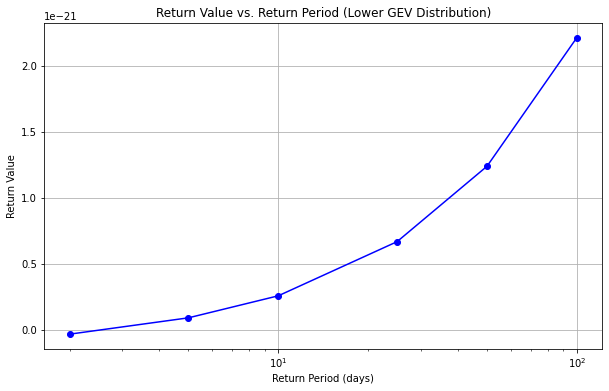

((28, 30), (98, 100))
((30, 32), (68, 70))
((30, 32), (70, 72))
((30, 32), (72, 74))
31720


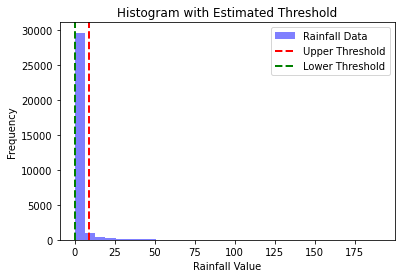

Estimated Upper Threshold: 8.81
Estimated Lower Threshold: 0.00


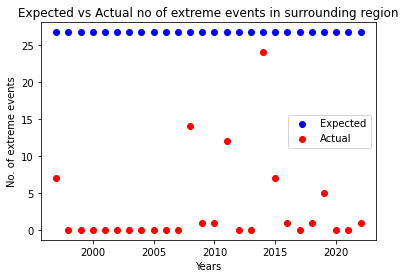

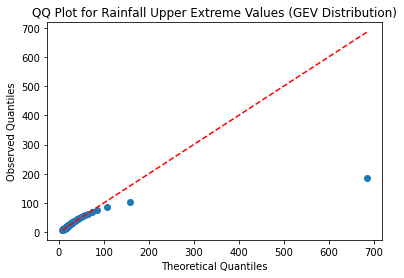

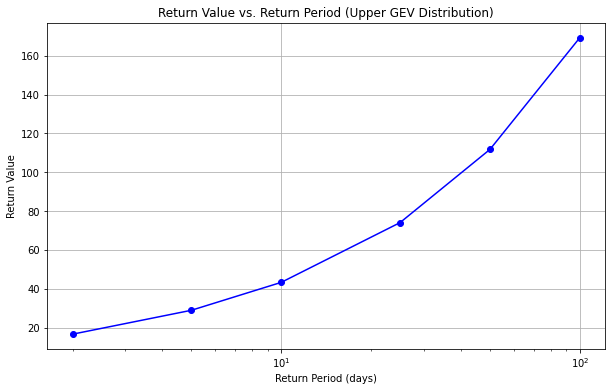

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


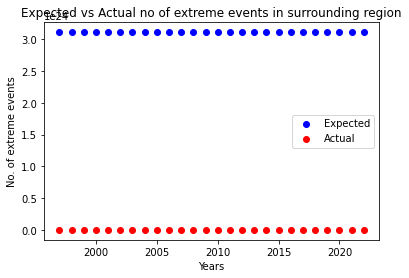

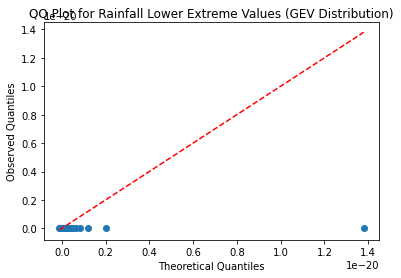

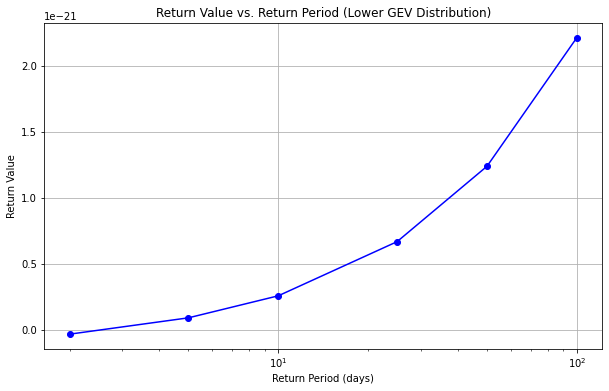

((30, 32), (74, 76))
228384


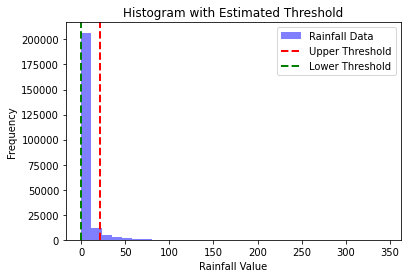

Estimated Upper Threshold: 21.30
Estimated Lower Threshold: 0.00


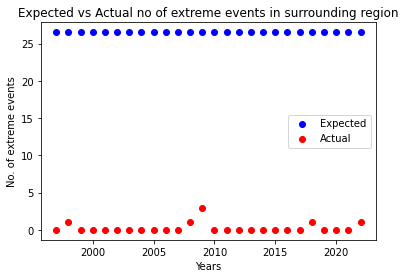

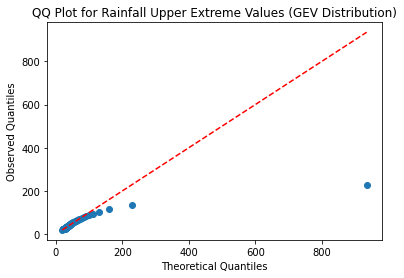

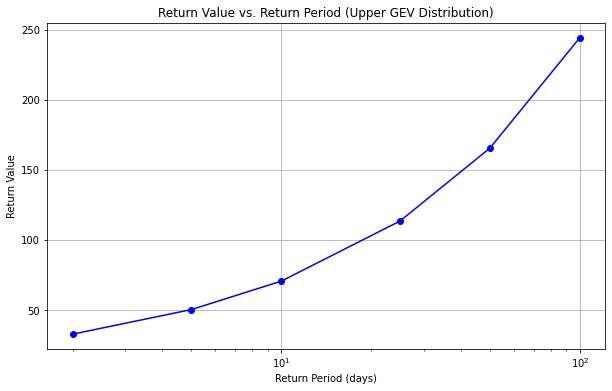

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


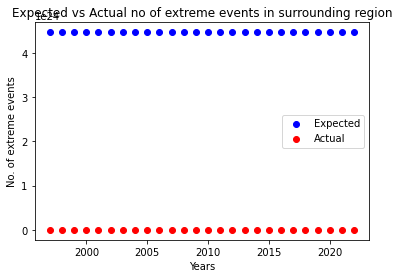

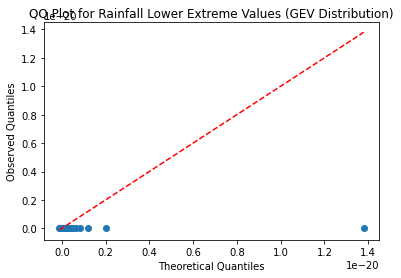

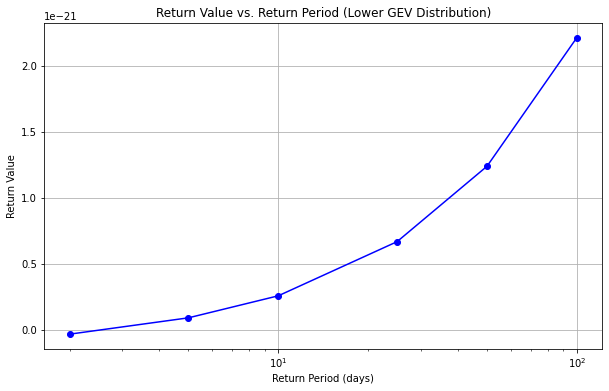

((30, 32), (76, 78))
256932


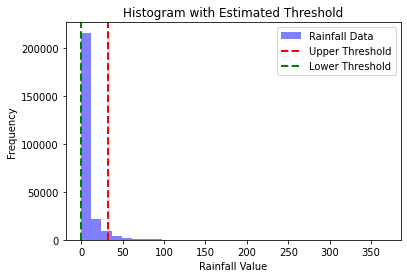

Estimated Upper Threshold: 31.83
Estimated Lower Threshold: 0.00


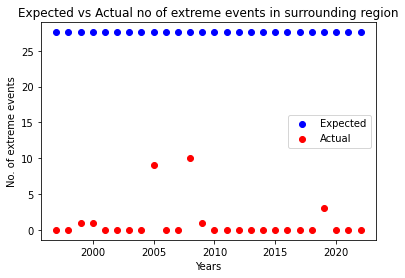

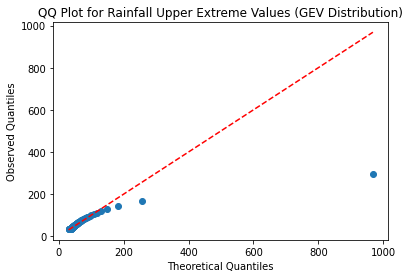

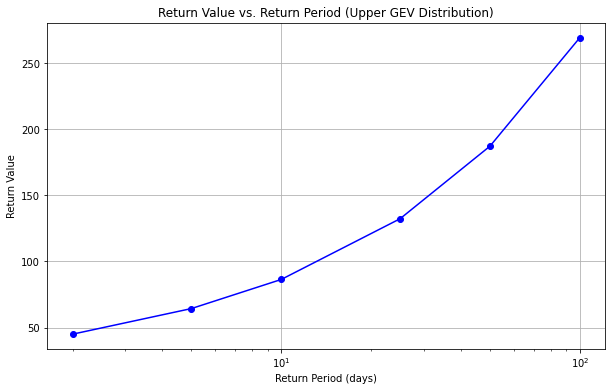

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


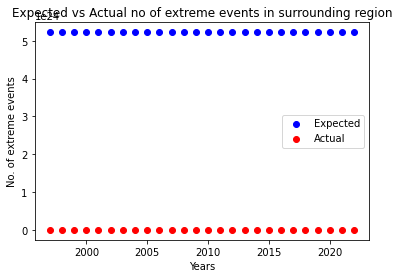

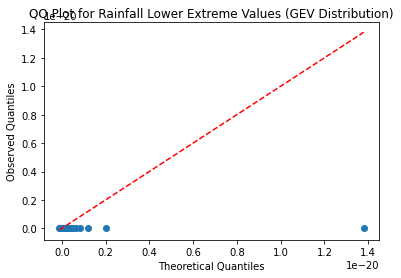

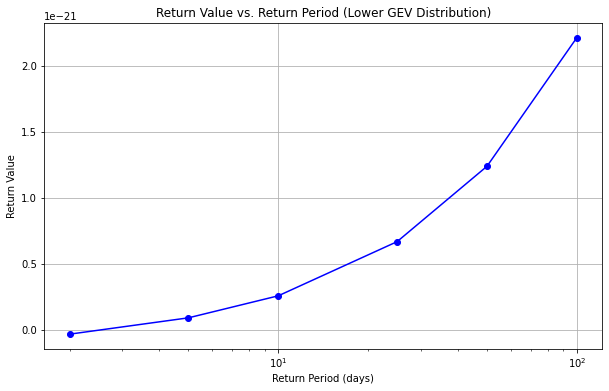

((30, 32), (78, 80))
206180


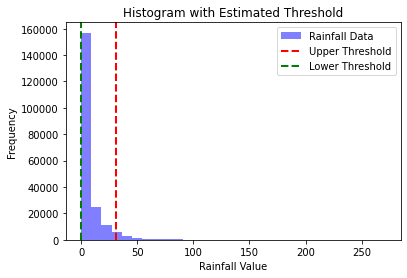

Estimated Upper Threshold: 30.79
Estimated Lower Threshold: 0.00


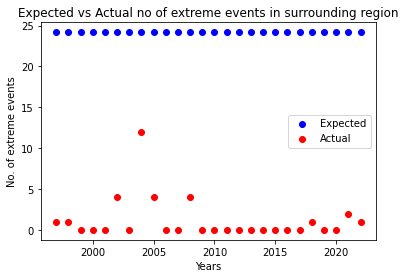

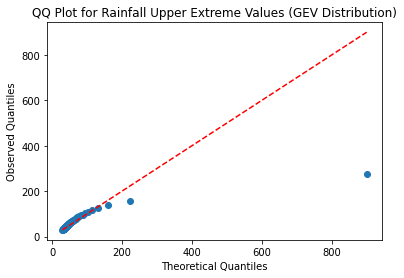

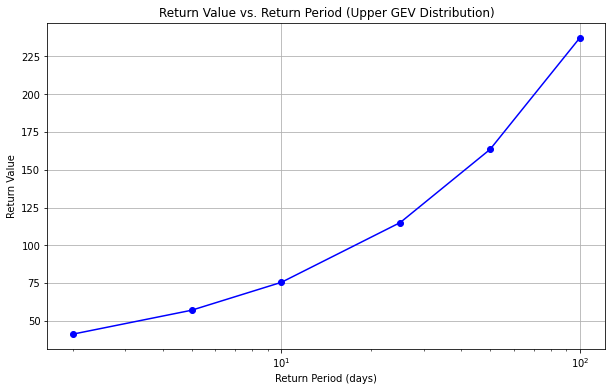

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


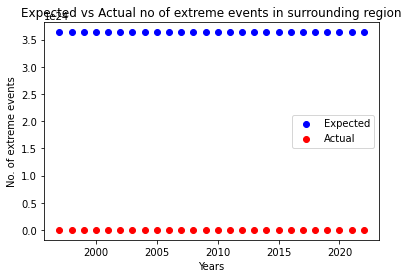

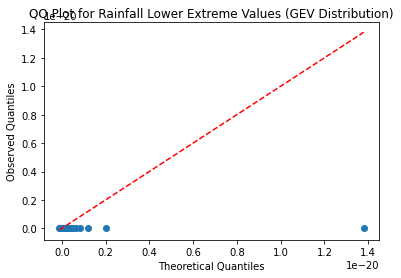

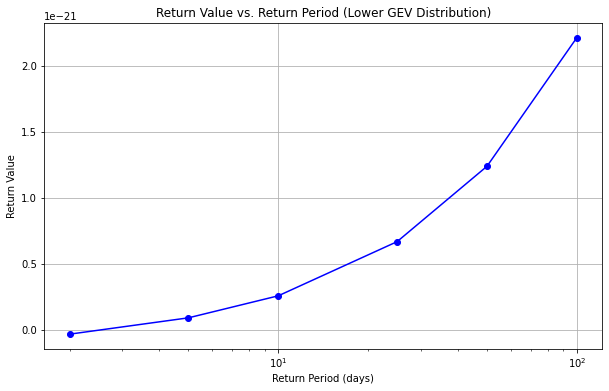

((30, 32), (80, 82))
47580


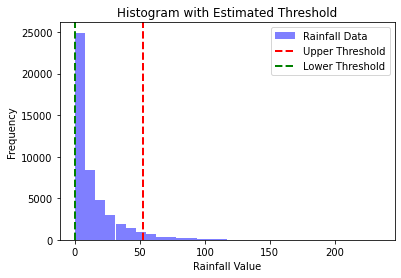

Estimated Upper Threshold: 52.70
Estimated Lower Threshold: 0.00


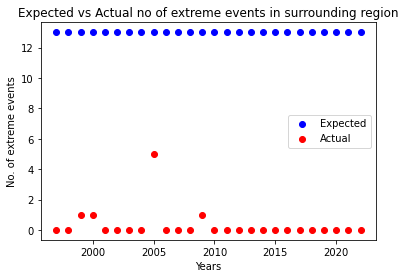

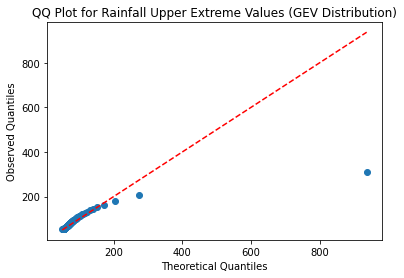

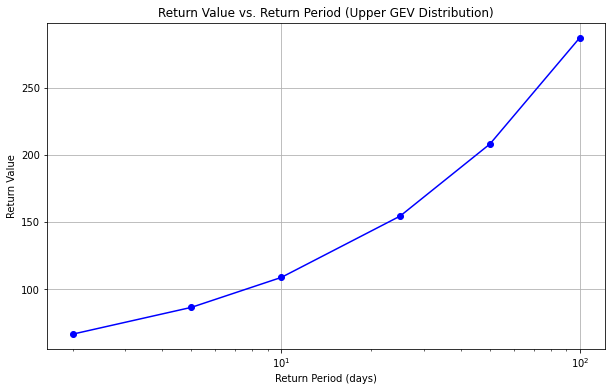

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


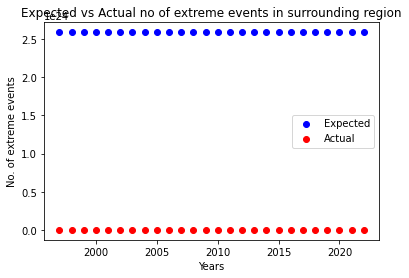

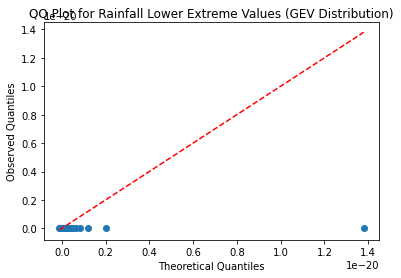

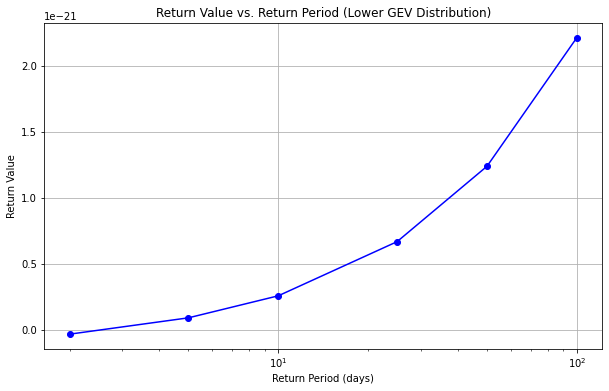

((30, 32), (82, 84))
((30, 32), (84, 86))
((30, 32), (86, 88))
((30, 32), (88, 90))
((30, 32), (90, 92))
((30, 32), (92, 94))
((30, 32), (94, 96))
((30, 32), (96, 98))
((30, 32), (98, 100))
((32, 34), (68, 70))
((32, 34), (70, 72))
((32, 34), (72, 74))
44408


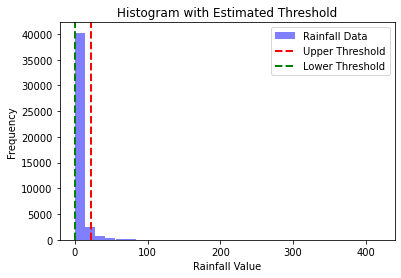

Estimated Upper Threshold: 22.41
Estimated Lower Threshold: 0.00


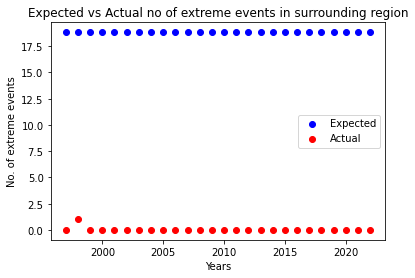

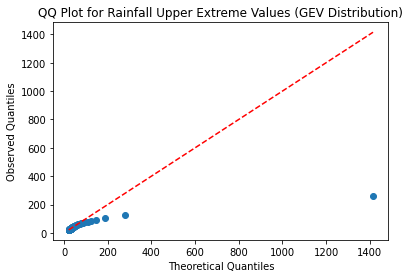

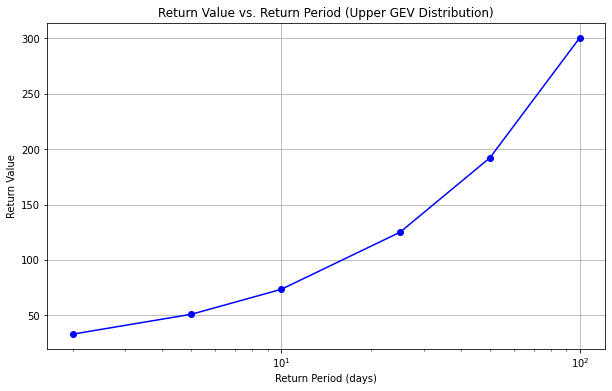

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


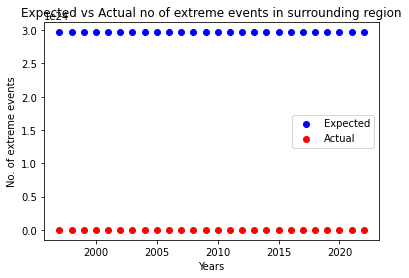

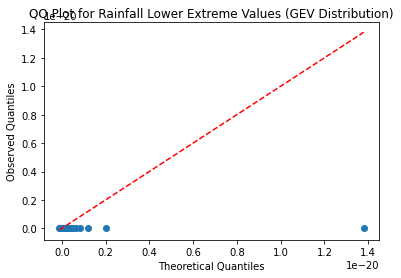

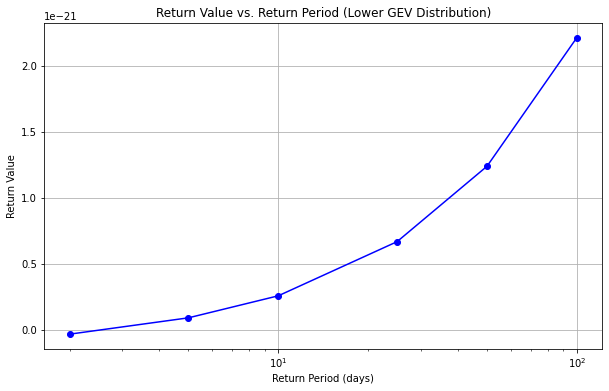

((32, 34), (74, 76))
225212


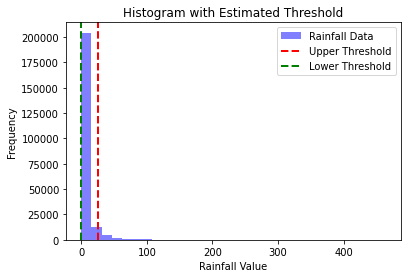

Estimated Upper Threshold: 25.31
Estimated Lower Threshold: 0.00


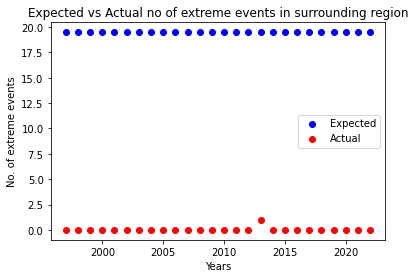

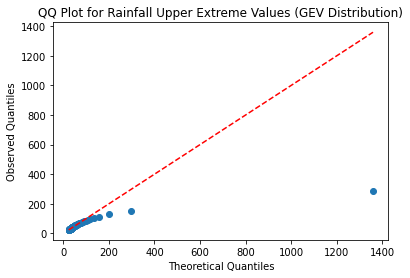

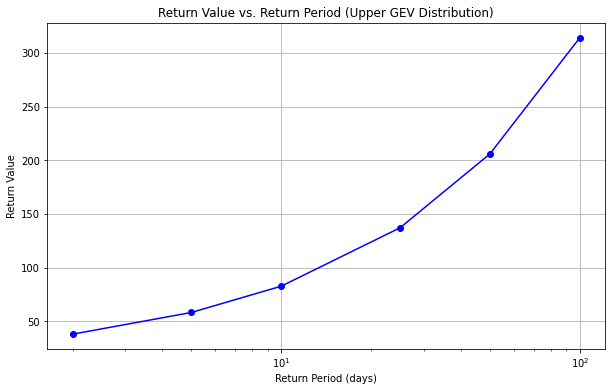

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


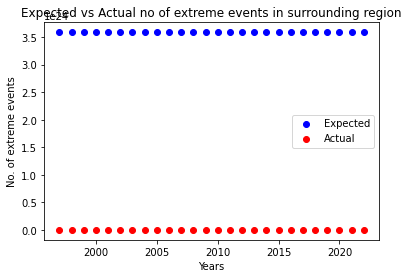

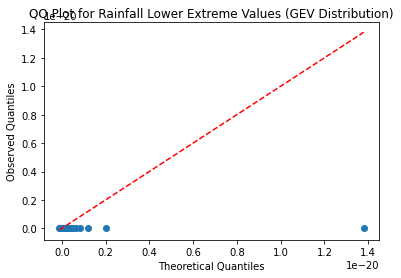

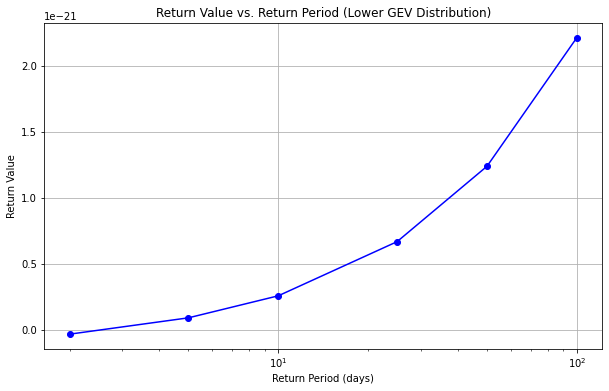

((32, 34), (76, 78))
256932


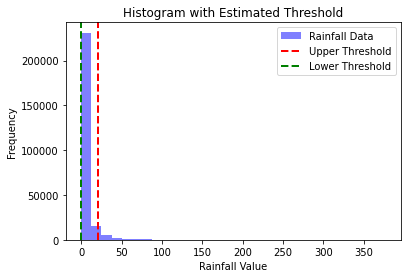

Estimated Upper Threshold: 21.15
Estimated Lower Threshold: 0.00


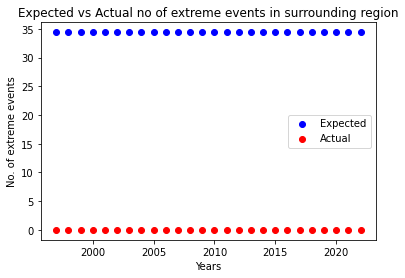

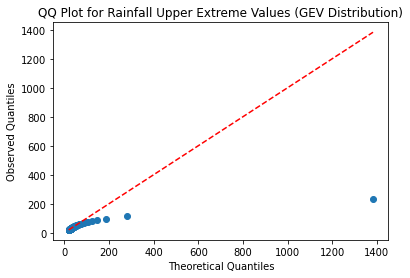

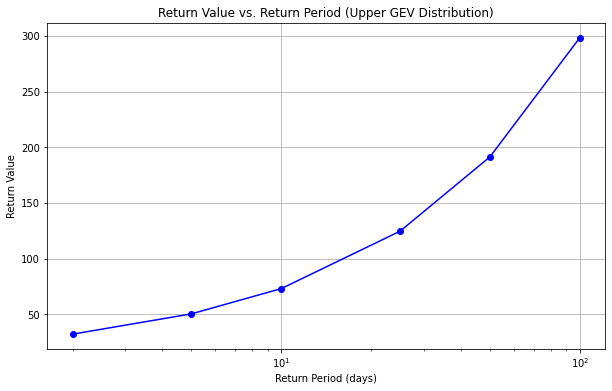

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


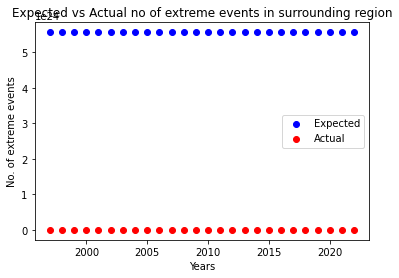

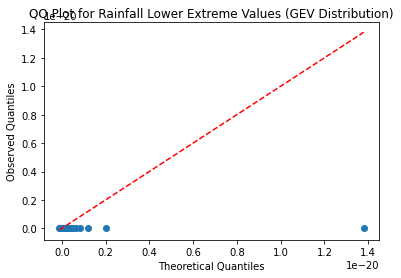

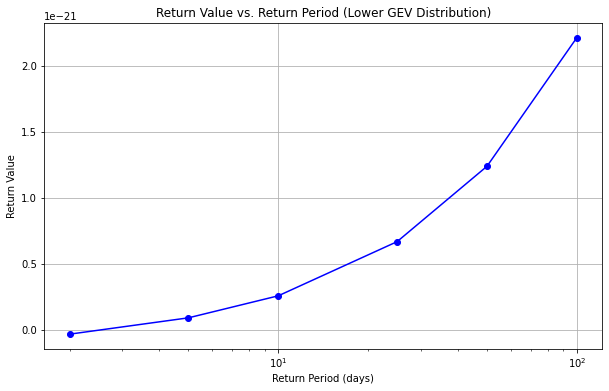

((32, 34), (78, 80))
152256


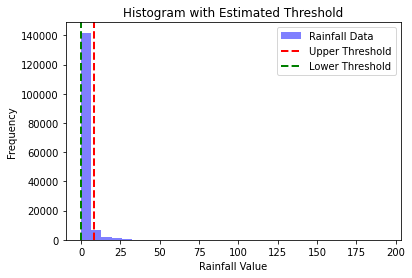

Estimated Upper Threshold: 8.40
Estimated Lower Threshold: 0.00


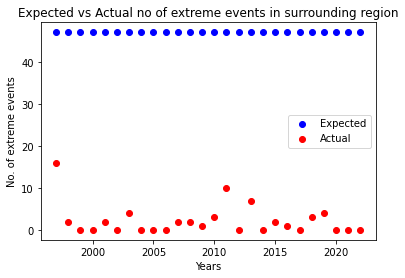

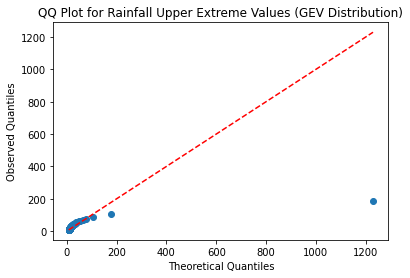

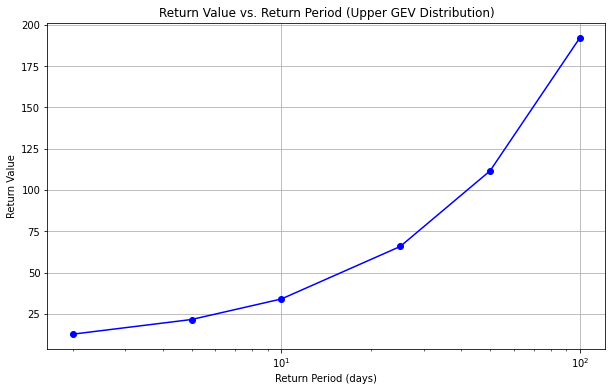

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


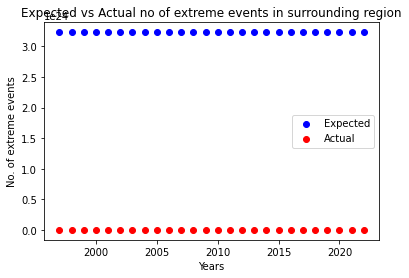

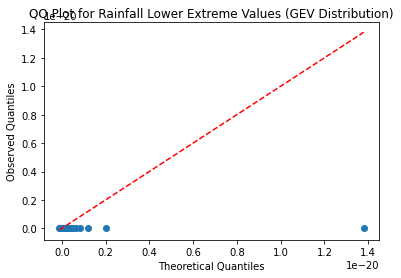

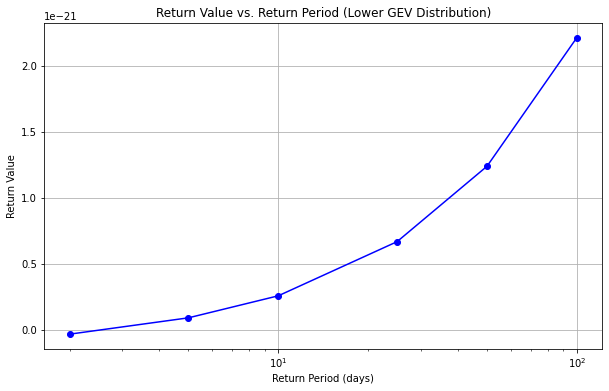

((32, 34), (80, 82))
((32, 34), (82, 84))
((32, 34), (84, 86))
((32, 34), (86, 88))
((32, 34), (88, 90))
((32, 34), (90, 92))
((32, 34), (92, 94))
((32, 34), (94, 96))
((32, 34), (96, 98))
((32, 34), (98, 100))
((34, 36), (68, 70))
((34, 36), (70, 72))
((34, 36), (72, 74))
104676


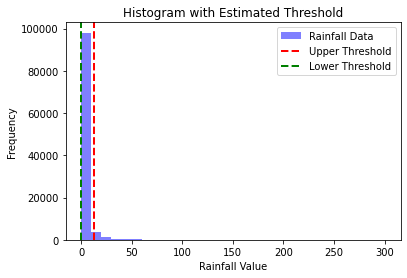

Estimated Upper Threshold: 12.46
Estimated Lower Threshold: 0.00


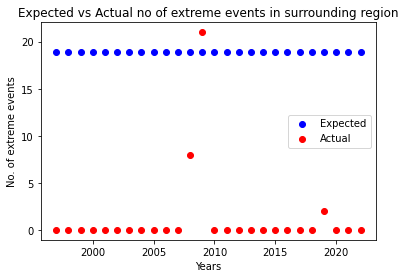

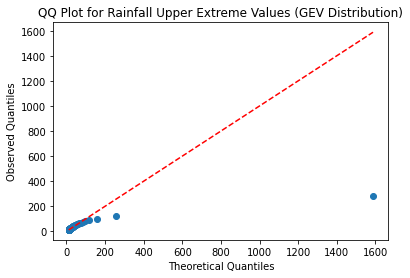

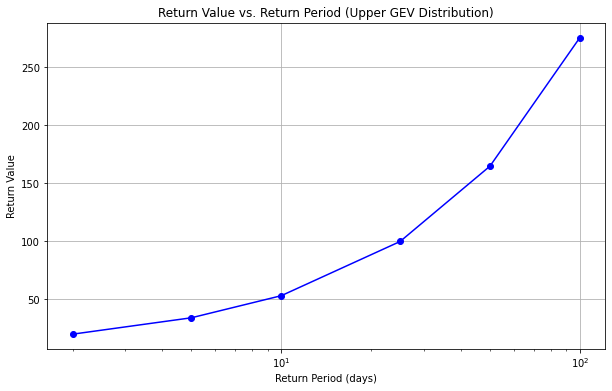

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


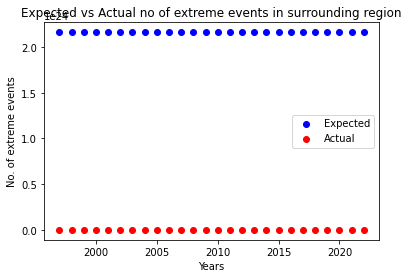

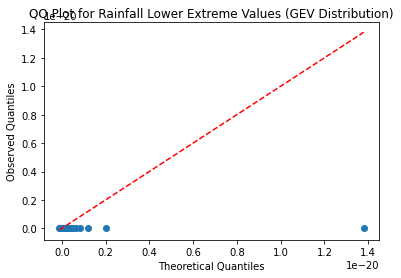

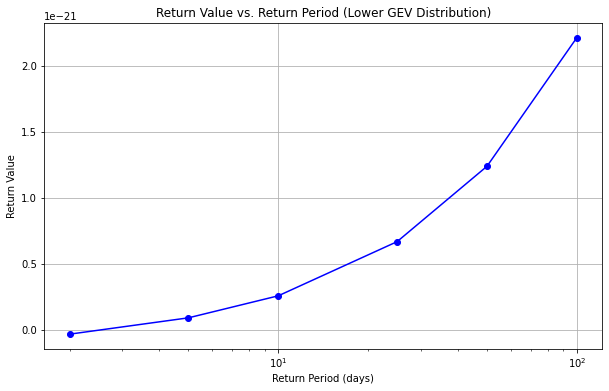

((34, 36), (74, 76))
256932


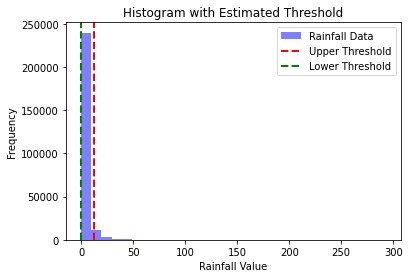

Estimated Upper Threshold: 12.30
Estimated Lower Threshold: 0.00


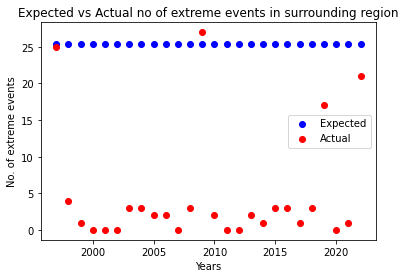

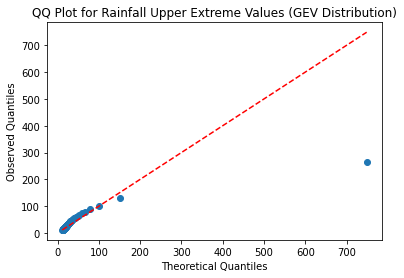

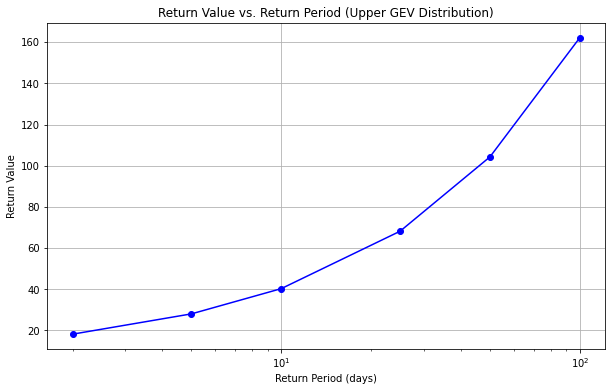

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


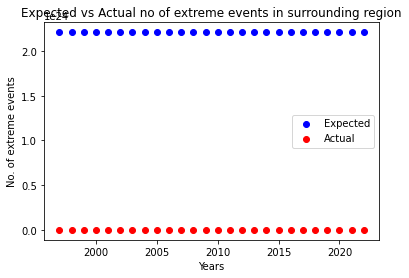

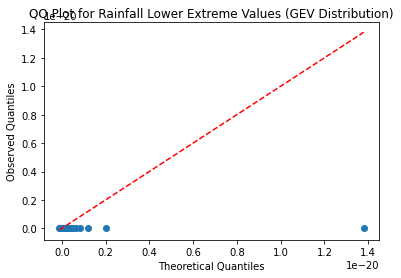

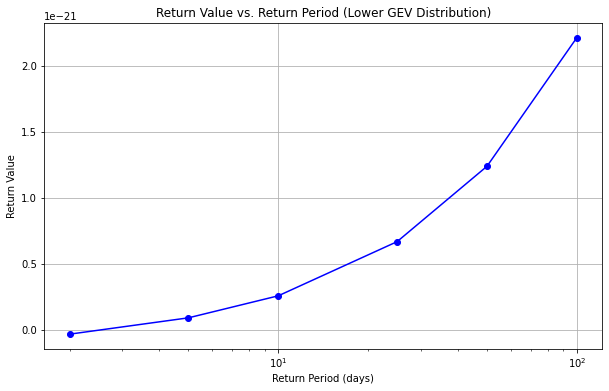

((34, 36), (76, 78))
241072


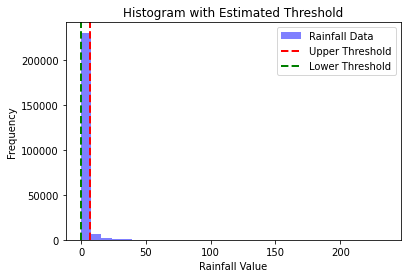

Estimated Upper Threshold: 7.20
Estimated Lower Threshold: 0.00


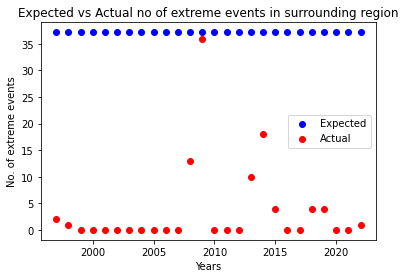

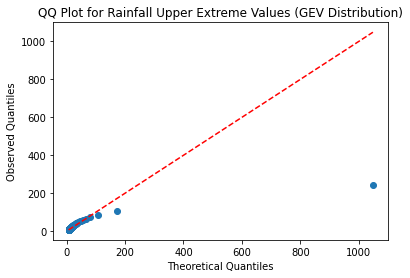

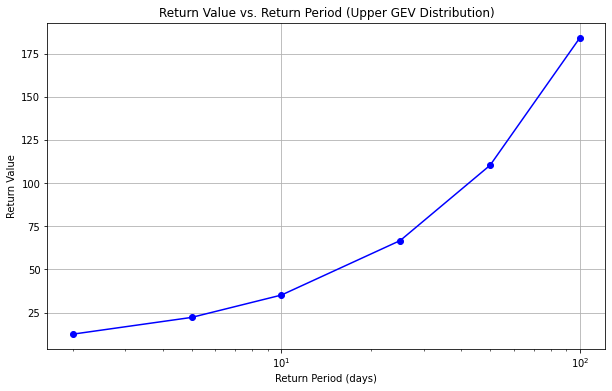

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


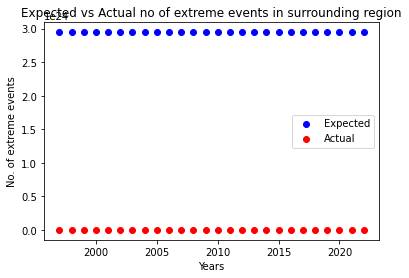

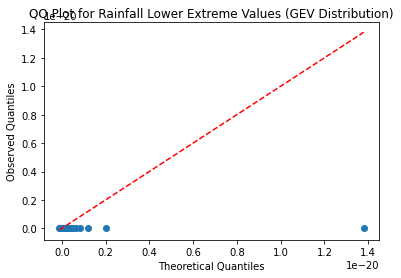

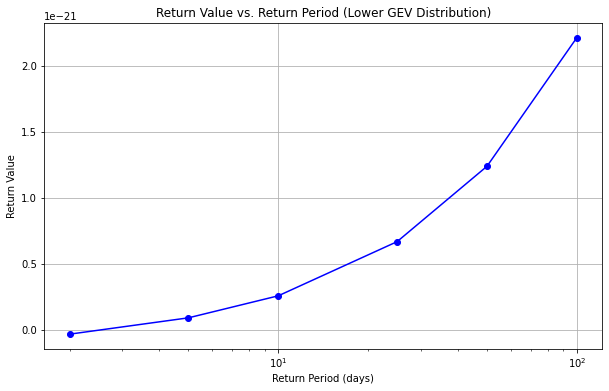

((34, 36), (78, 80))
228384


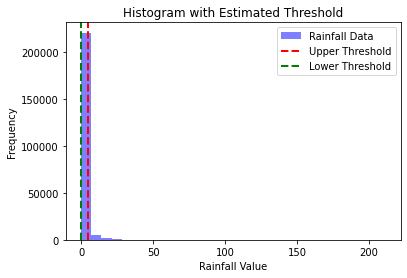

Estimated Upper Threshold: 4.86
Estimated Lower Threshold: 0.00


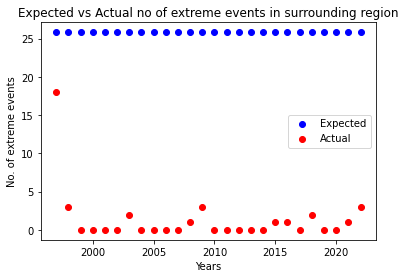

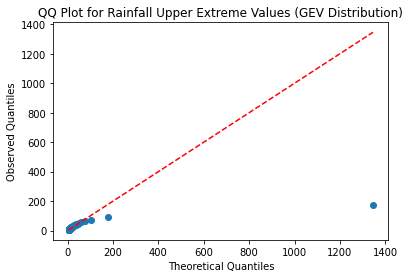

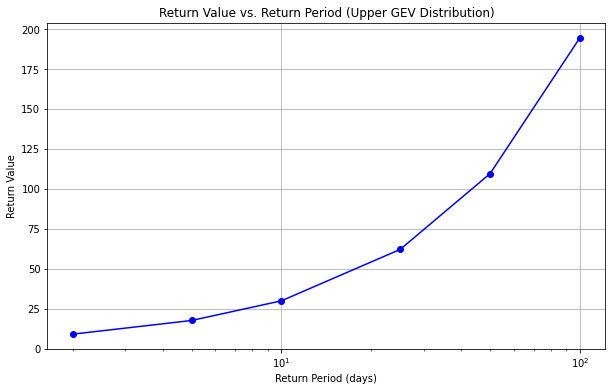

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


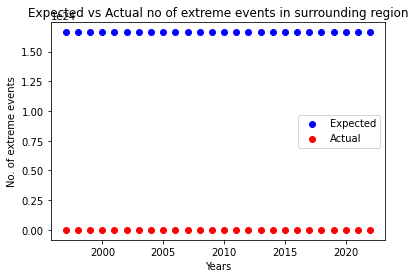

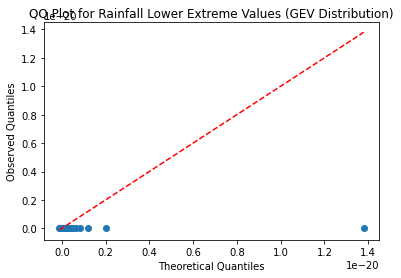

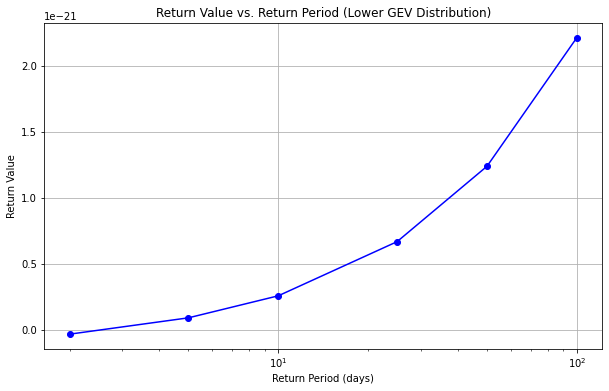

((34, 36), (80, 82))
25376


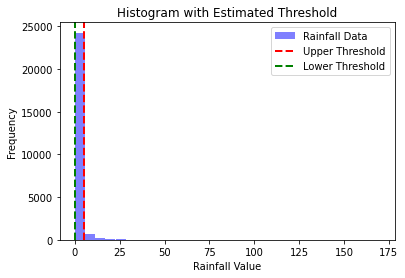

Estimated Upper Threshold: 5.09
Estimated Lower Threshold: 0.00


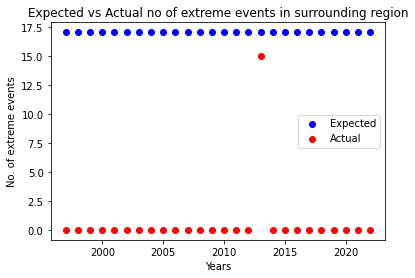

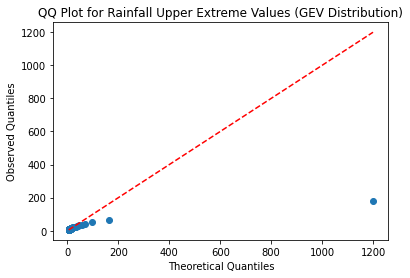

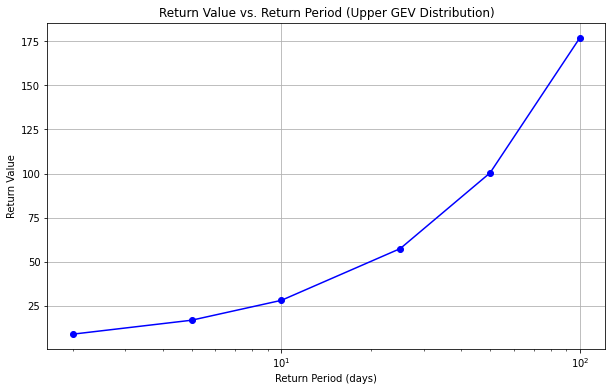

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


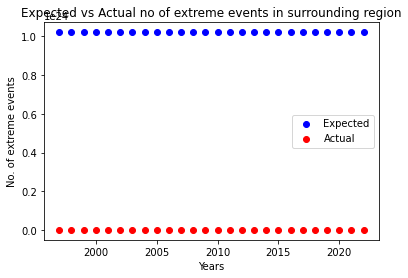

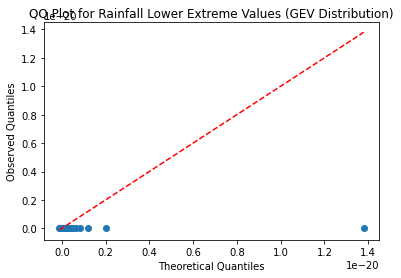

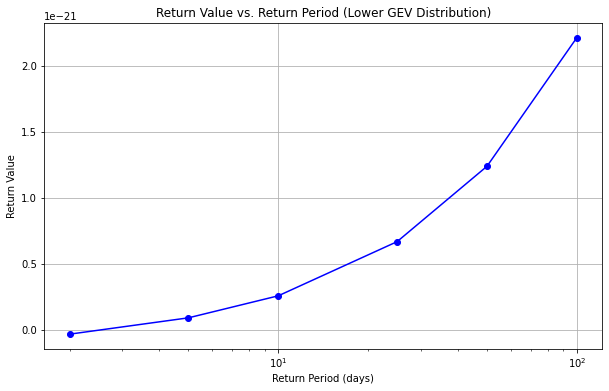

((34, 36), (82, 84))
((34, 36), (84, 86))
((34, 36), (86, 88))
((34, 36), (88, 90))
((34, 36), (90, 92))
((34, 36), (92, 94))
((34, 36), (94, 96))
((34, 36), (96, 98))
((34, 36), (98, 100))
((36, 38), (68, 70))
((36, 38), (70, 72))
((36, 38), (72, 74))
91988


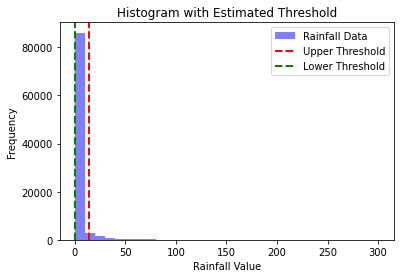

Estimated Upper Threshold: 14.31
Estimated Lower Threshold: 0.00


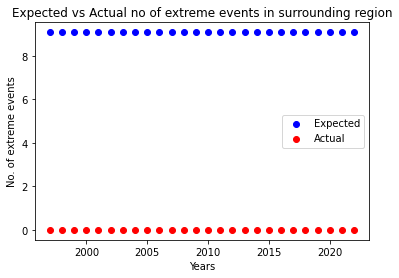

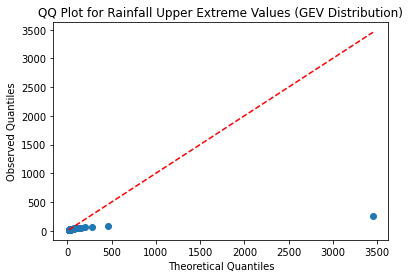

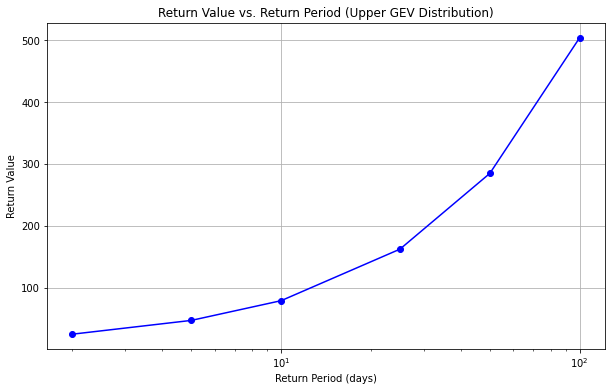

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


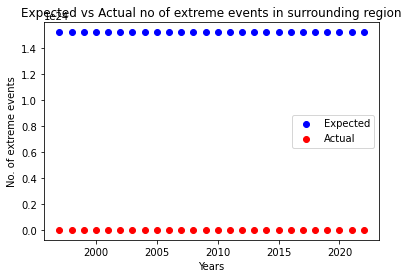

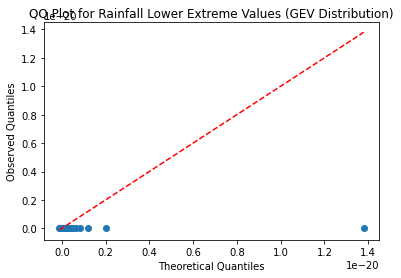

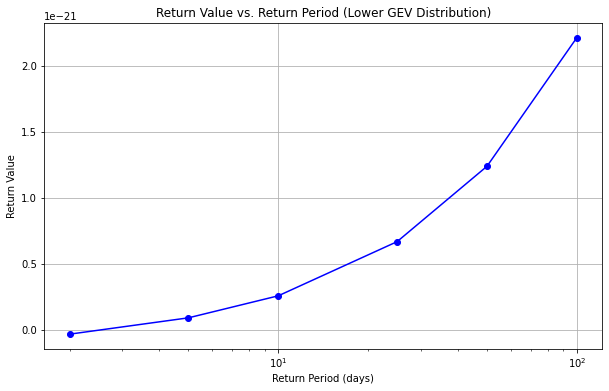

((36, 38), (74, 76))
145912


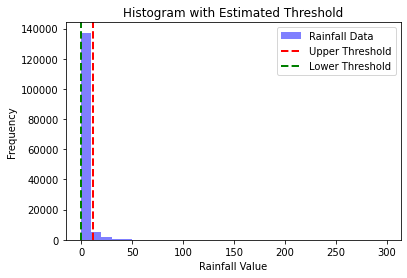

Estimated Upper Threshold: 11.36
Estimated Lower Threshold: 0.00


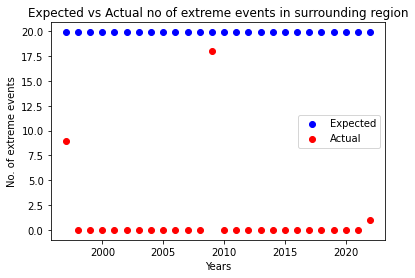

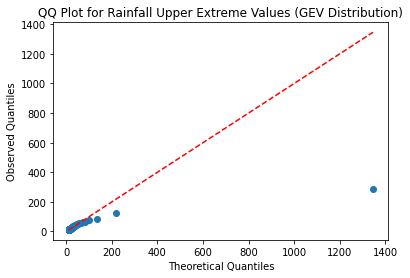

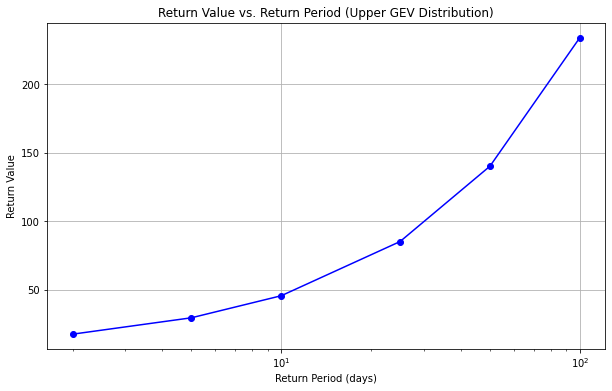

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


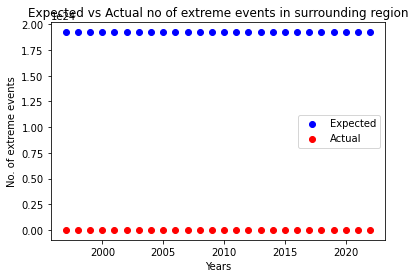

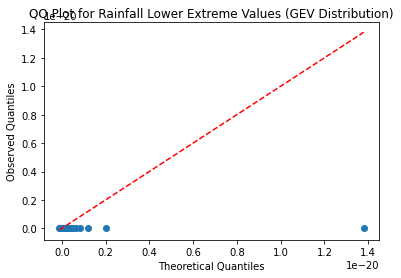

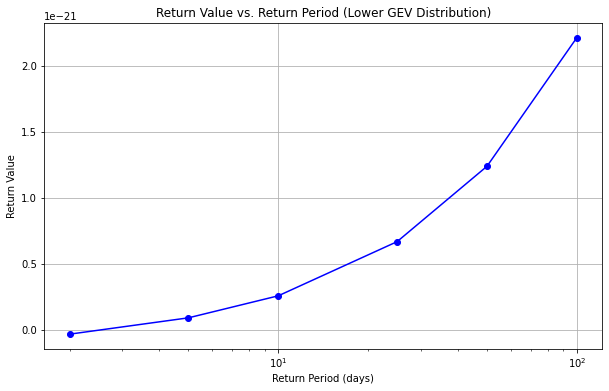

((36, 38), (76, 78))
34892


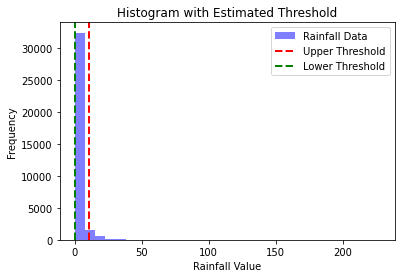

Estimated Upper Threshold: 10.23
Estimated Lower Threshold: 0.00


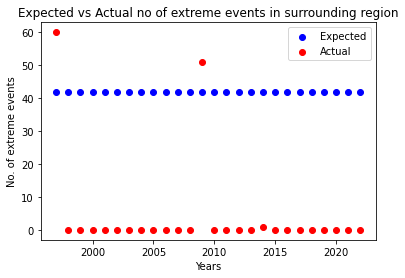

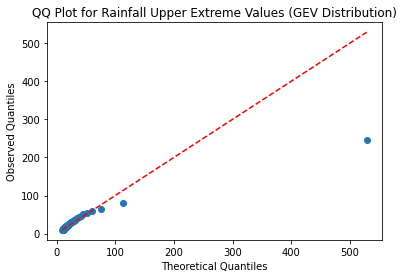

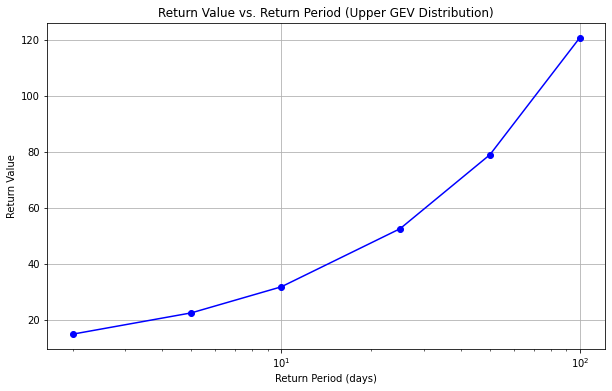

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


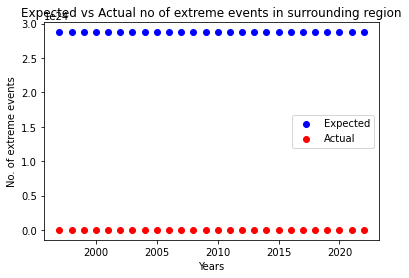

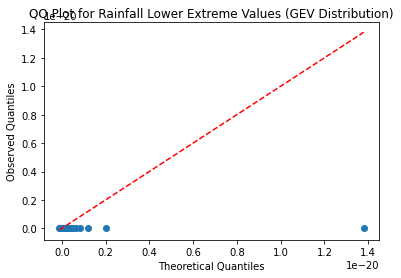

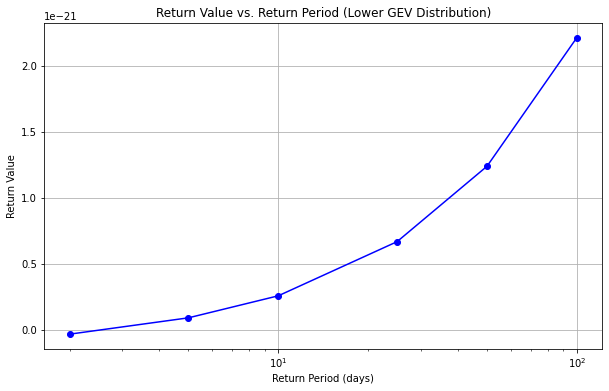

((36, 38), (78, 80))
22204


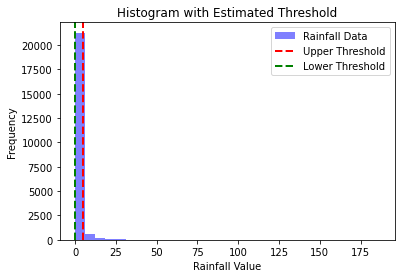

Estimated Upper Threshold: 5.11
Estimated Lower Threshold: 0.00


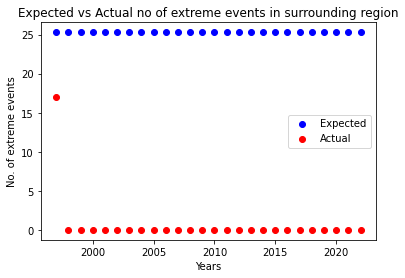

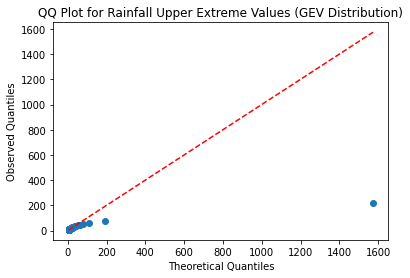

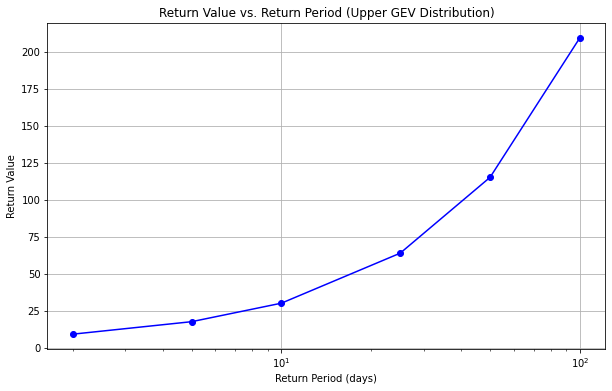

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


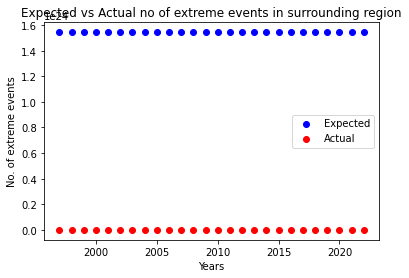

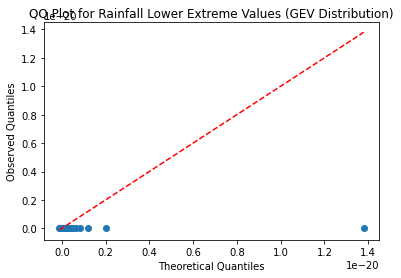

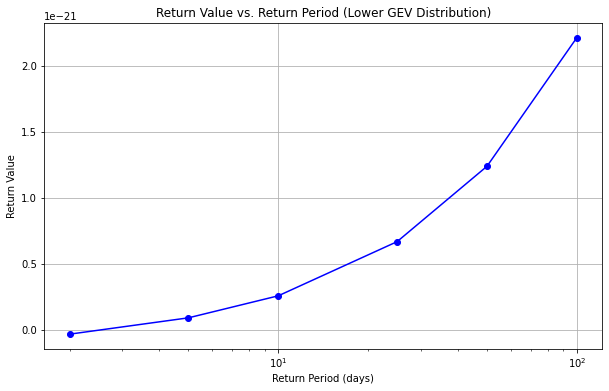

((36, 38), (80, 82))
3172


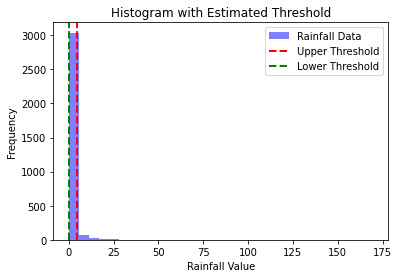

Estimated Upper Threshold: 4.61
Estimated Lower Threshold: 0.00


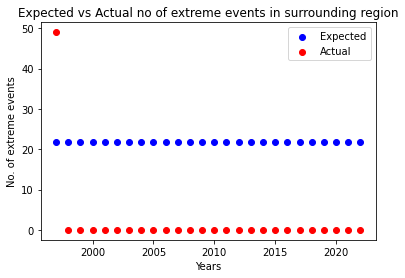

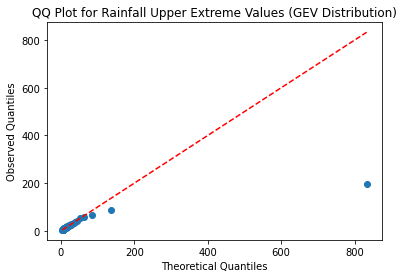

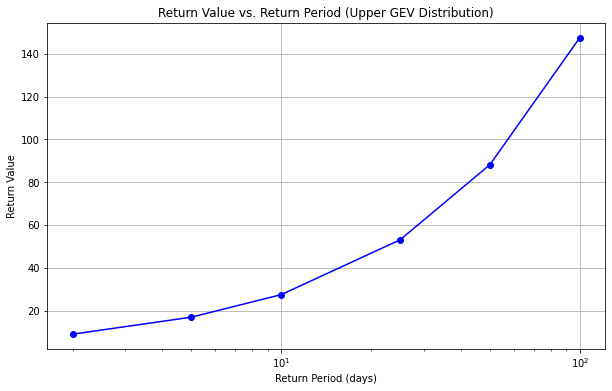

C:\Users\JBSCHOLOR-2020-18\AppData\Local\Programs\Python\Python39\lib\site-packages\scipy\stats\_distn_infrastructure.py:406: RuntimeWarning: invalid value encountered in double_scalars
  return m3 / np.power(m2, 1.5)


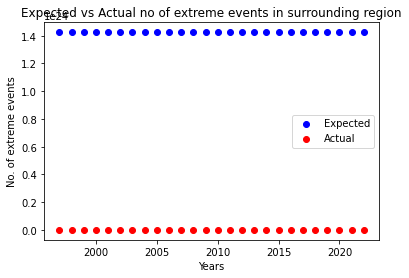

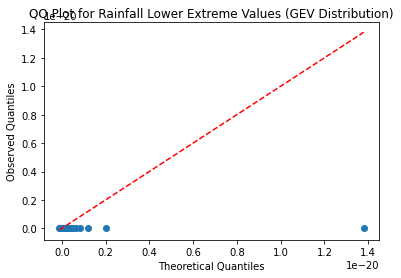

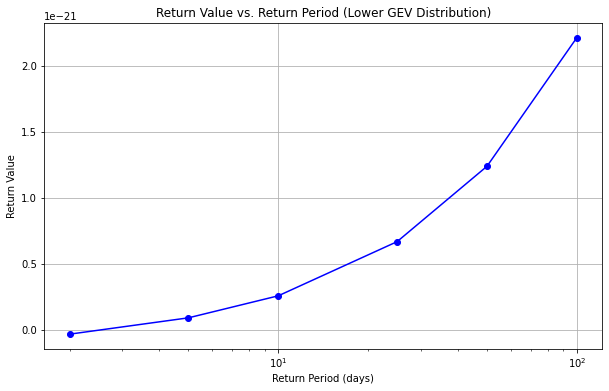

((36, 38), (82, 84))
((36, 38), (84, 86))
((36, 38), (86, 88))
((36, 38), (88, 90))
((36, 38), (90, 92))
((36, 38), (92, 94))
((36, 38), (94, 96))
((36, 38), (96, 98))
((36, 38), (98, 100))
((38, 40), (68, 70))
((38, 40), (70, 72))
((38, 40), (72, 74))
((38, 40), (74, 76))
((38, 40), (76, 78))
((38, 40), (78, 80))
((38, 40), (80, 82))
((38, 40), (82, 84))
((38, 40), (84, 86))
((38, 40), (86, 88))
((38, 40), (88, 90))
((38, 40), (90, 92))
((38, 40), (92, 94))
((38, 40), (94, 96))
((38, 40), (96, 98))
((38, 40), (98, 100))


In [ ]:
for region in regions:
    print(region)
    gev_analysis(df,region)